# train

In [1]:
import yaml
import os

with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

<ipython-input-1-1499ab5789c7>:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


In [2]:
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
os.makedirs(OUTPUT_ROOT, exist_ok=True)

## load library

In [3]:
# python default library
import os
import shutil
import datetime
import sys
import pickle
import random
from random import sample

# general analysis tool-kit
import numpy as np
import pandas as pd
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# pytorch
import torch
from torch import optim, nn
from torch.utils.tensorboard import SummaryWriter

#from torchsummary import summary

# etc
import yaml
yaml.warnings({'YAMLLoadWarning': False})

# original library
sys.path.append('/home/hiroki/research/dcase2021_task2/src/functions')
import common as com
import pytorch_modeler as modeler
from pytorch_model import Conditional_VAE as Model
#from pytorch_utils import filtered_load_model
#import models

import librosa
import IPython
import librosa.display

## load config and set logger

In [4]:
log_file = config['IO_OPTION']['OUTPUT_ROOT']+'/train_{0}.log'.format(datetime.date.today())
logger = com.setup_logger(log_file, '00_train.py')

## Setting

In [5]:
# Setting seed
modeler.set_seed(777)

In [6]:
############################################################################
# Setting I/O path
############################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
#dev_dir = INPUT_ROOT + "/dev_data"
#add_dev_dir = INPUT_ROOT + "/add_dev_data"
# machine type
machine_types = ['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
TB_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/tb'
OUT_FEATURE_DIR = OUTPUT_ROOT + '/extraction_features'
OUT_SCORE_DIR = OUTPUT_ROOT + '/score'
OUT_PRED_DIR = OUTPUT_ROOT + '/pred'
#os.makedirs(OUTPUT_ROOT, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(TB_DIR, exist_ok=True)
os.makedirs(OUT_FEATURE_DIR, exist_ok=True)
os.makedirs(OUT_SCORE_DIR, exist_ok=True)
os.makedirs(OUT_PRED_DIR, exist_ok=True)
# copy config
shutil.copy('./config.yaml', OUTPUT_ROOT)

'/media/hiroki/HDD1TB/research/dcase2021_task2/output/CenterLossVAE/ex14_randomfeat/config.yaml'

In [7]:
torch.cuda.is_available()

True

In [8]:
ext_data = pd.read_pickle(f'{INPUT_ROOT}/valve_features.pkl')

In [9]:
#train_features = ext_data['train']['features']

In [10]:
#train_features.shape

## training

In [11]:
def random_feature_selection(x, t_d=3776, d=2048):
    idx = torch.tensor(sample(range(0, t_d), d)) # t_d(特徴量)の中からランダムにd個サンプリングする(ぜんぶやると重いから) # わからん
    # 0~t_d idxの中からランダムにd個サンプリングする
    x = np.take(x, idx, 1)
    return x

In [12]:
#ext_data['train'].keys()

In [13]:
#############################################################################
# run
#############################################################################
def run(machine_type):
    com.tic()
    logger.info('TARGET MACHINE_TYPE: {0}'.format(machine_type))
    logger.info('MAKE DATA_LOADER')
    # dataloader
    #for machine in machine_types:
    #    if machine_type == machine:
    #        ext_data = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #    else:
    #        ext_data_ = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #        ext_data['train']['features'] = np.concatenate([ext_data['train']['features'],
    #                                                        ext_data_['train']['features']], axis=0)
    #        ext_data['train']['labels'] = np.concatenate([ext_data['train']['labels'],
    #                                                     ext_data_['train']['labels']], axis=0)
    #        ext_data['train']['wav_names'] = np.concatenate([ext_data['train']['wav_names'],
    #                                                         ext_data_['train']['wav_names']], axis=0)
            
    #t_d = 3776    # 全特徴量数
    #d = 1024      # 使う特徴量数
    #for phase in ['train', 'valid_source', 'valid_target']:
    #    x = ext_data[phase]['features']
    #    x = random_feature_selection(x)
    #    ext_data[phase]['features'] = x
    #    x = ext_data[phase]['features'][:,512:2048]
    #    ext_data[phase]['features'] = x
    dataloaders_dict = modeler.make_dataloader(ext_data)
    # define writer for tensorbord
    os.makedirs(TB_DIR+'/'+machine_type, exist_ok=True)
    tb_log_dir = TB_DIR + '/' + machine_type
    writer = SummaryWriter(log_dir = tb_log_dir)
    # out path
    model_out_path = MODEL_DIR+'/{}_model.pth'.format(machine_type)
    score_out_path = OUT_SCORE_DIR + '/{}_score.csv'.format(machine_type)
    pred_out_path = OUT_PRED_DIR + '/{}_pred.csv'.format(machine_type)
    logger.info('TRAINING')
    # parameter setting
    in_features = ext_data['train']['features'].shape[1]
    mid_size = config['param']['mid_size']
    latent_size = config['param']['latent_size']
    num_classes = 6
    net = Model(in_features, mid_size, latent_size, num_classes)
    optimizer = optim.Adam(net.parameters(), lr=1e-3)
    num_epochs = config['param']['num_epochs']
    #scheduler = optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e-2, 
    #                                          max_lr=1e-3, epochs=num_epochs, steps_per_epoch=len(dataloaders_dict['train']))
    # training
    output_dicts = modeler.train_net(net, dataloaders_dict, optimizer, num_epochs, writer, model_out_path, score_out_path, pred_out_path)
    
    com.toc()

In [14]:
machine_types

['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']

2021-05-30 02:34:10,550 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyCar
2021-05-30 02:34:10,565 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 02:34:10,568 - 00_train.py - INFO - TRAINING
2021-05-30 02:34:14,926 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:01<00:00,  8.81it/s]
2021-05-30 02:34:16,291 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.07it/s]
2021-05-30 02:34:16,361 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.64it/s]


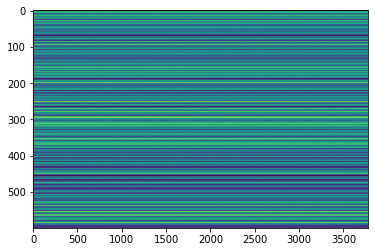

,AUC,pAUC
Source_0,0.550900,0.537368
Source_1,0.581100,0.540526
Source_2,0.627900,0.580526
Target_0,0.521700,0.576842
Target_1,0.664500,0.563684
Target_2,0.610200,0.500000
mean,0.592717,0.549825
h_mean,0.588859,0.548388


2021-05-30 02:34:18,131 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:134739.379557, val_AUC_hmean:0.588859, val_pAUC_hmean:0.548388, best_flag:True
2021-05-30 02:34:18,132 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.81it/s]
2021-05-30 02:34:18,895 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.16it/s]
2021-05-30 02:34:18,962 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 43.15it/s]


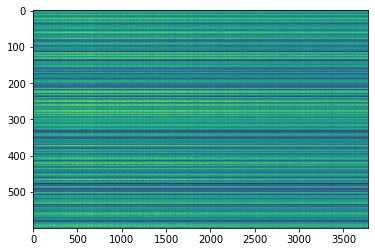

,AUC,pAUC
Source_0,0.570000,0.531053
Source_1,0.631300,0.540526
Source_2,0.662200,0.548947
Target_0,0.576600,0.561579
Target_1,0.693600,0.591053
Target_2,0.657200,0.523158
mean,0.631817,0.549386
h_mean,0.628522,0.548505


2021-05-30 02:34:20,742 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:84828.038411, val_AUC_hmean:0.628522, val_pAUC_hmean:0.548505, best_flag:True
2021-05-30 02:34:20,743 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.07it/s]
2021-05-30 02:34:21,492 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.37it/s]
2021-05-30 02:34:21,560 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.87it/s]


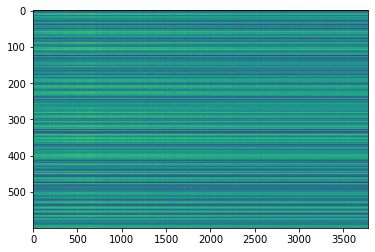

,AUC,pAUC
Source_0,0.572800,0.549474
Source_1,0.635800,0.543684
Source_2,0.669800,0.577895
Target_0,0.570200,0.610000
Target_1,0.687300,0.597895
Target_2,0.635800,0.546316
mean,0.628617,0.570877
h_mean,0.625445,0.569694


2021-05-30 02:34:23,148 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:74520.218750, val_AUC_hmean:0.625445, val_pAUC_hmean:0.569694, best_flag:True
2021-05-30 02:34:23,149 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.64it/s]
2021-05-30 02:34:23,872 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.93it/s]
2021-05-30 02:34:23,933 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.16it/s]
2021-05-30 02:34:23,990 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:68632.264323, val_AUC_hmean:0.645659, val_pAUC_hmean:0.545550, best_flag:False
2021-05-30 02:34:23,991 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.00it/s]
2021-05-30 02:34:24,699 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.86it/s]
2021-05-30 02:34:24,760 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.08it/s]


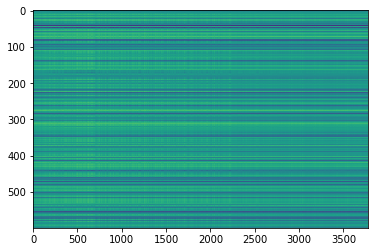

,AUC,pAUC
Source_0,0.635900,0.565263
Source_1,0.670300,0.552105
Source_2,0.728300,0.631053
Target_0,0.653100,0.640526
Target_1,0.653200,0.524211
Target_2,0.642900,0.527368
mean,0.663950,0.573421
h_mean,0.662614,0.569798


2021-05-30 02:34:26,456 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:64584.176432, val_AUC_hmean:0.662614, val_pAUC_hmean:0.569798, best_flag:True
2021-05-30 02:34:26,457 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.35it/s]
2021-05-30 02:34:27,193 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.12it/s]
2021-05-30 02:34:27,253 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.58it/s]
2021-05-30 02:34:27,312 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:60893.503906, val_AUC_hmean:0.671550, val_pAUC_hmean:0.562850, best_flag:False
2021-05-30 02:34:27,314 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.98it/s]
2021-05-30 02:34:28,022 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.92it/s]
2021-05-30 02:34:28,084 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.52it/s]


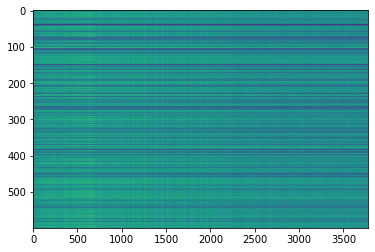

,AUC,pAUC
Source_0,0.694400,0.604211
Source_1,0.686600,0.552632
Source_2,0.760400,0.629474
Target_0,0.669500,0.652105
Target_1,0.635800,0.486842
Target_2,0.642600,0.530000
mean,0.681550,0.575877
h_mean,0.679171,0.569933


2021-05-30 02:34:30,013 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:57519.232747, val_AUC_hmean:0.679171, val_pAUC_hmean:0.569933, best_flag:True
2021-05-30 02:34:30,015 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.41it/s]
2021-05-30 02:34:30,749 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.52it/s]
2021-05-30 02:34:30,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.29it/s]


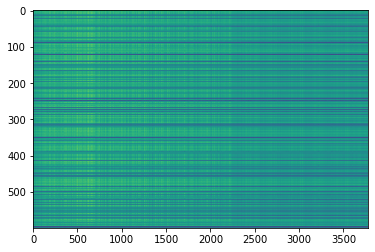

,AUC,pAUC
Source_0,0.810000,0.618421
Source_1,0.703600,0.567895
Source_2,0.805800,0.647368
Target_0,0.787100,0.667368
Target_1,0.636500,0.482632
Target_2,0.565000,0.513158
mean,0.718000,0.582807
h_mean,0.705192,0.574617


2021-05-30 02:34:32,664 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:55398.737630, val_AUC_hmean:0.705192, val_pAUC_hmean:0.574617, best_flag:True
2021-05-30 02:34:32,666 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.51it/s]
2021-05-30 02:34:33,442 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.73it/s]
2021-05-30 02:34:33,508 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.09it/s]


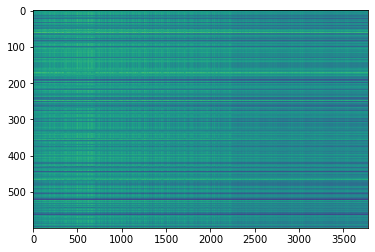

,AUC,pAUC
Source_0,0.750700,0.600526
Source_1,0.673700,0.572632
Source_2,0.789300,0.681053
Target_0,0.761800,0.682105
Target_1,0.648800,0.506842
Target_2,0.623200,0.522632
mean,0.707917,0.594298
h_mean,0.702413,0.586379


2021-05-30 02:34:35,583 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:52969.301107, val_AUC_hmean:0.702413, val_pAUC_hmean:0.586379, best_flag:True
2021-05-30 02:34:35,584 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.99it/s]
2021-05-30 02:34:36,337 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.64it/s]
2021-05-30 02:34:36,403 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.35it/s]
2021-05-30 02:34:36,464 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:50624.565755, val_AUC_hmean:0.677408, val_pAUC_hmean:0.574063, best_flag:False
2021-05-30 02:34:36,467 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.63it/s]
2021-05-30 02:34:37,236 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.66it/s]
2021-05-30 02:34:37,299 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.30it/s]
2021-05-30 02:

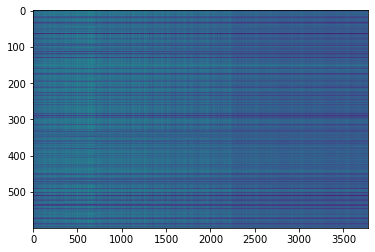

,AUC,pAUC
Source_0,0.727400,0.626316
Source_1,0.719400,0.611579
Source_2,0.794400,0.727895
Target_0,0.718700,0.687895
Target_1,0.680200,0.498421
Target_2,0.549900,0.503158
mean,0.698333,0.609211
h_mean,0.689363,0.596833


2021-05-30 02:34:41,698 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:43862.388997, val_AUC_hmean:0.689363, val_pAUC_hmean:0.596833, best_flag:True
2021-05-30 02:34:41,700 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.10it/s]
2021-05-30 02:34:42,404 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.05it/s]
2021-05-30 02:34:42,466 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.32it/s]
2021-05-30 02:34:42,527 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:42583.288086, val_AUC_hmean:0.674354, val_pAUC_hmean:0.591093, best_flag:False
2021-05-30 02:34:42,528 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.91it/s]
2021-05-30 02:34:43,241 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.69it/s]
2021-05-30 02:34:43,302 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.24it/s]
2021-05-30 02

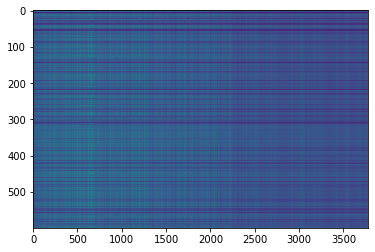

,AUC,pAUC
Source_0,0.785100,0.636316
Source_1,0.697800,0.603158
Source_2,0.846800,0.736316
Target_0,0.708000,0.680000
Target_1,0.683200,0.511579
Target_2,0.436800,0.502105
mean,0.692950,0.611579
h_mean,0.662747,0.599728


2021-05-30 02:34:46,794 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:38741.636393, val_AUC_hmean:0.662747, val_pAUC_hmean:0.599728, best_flag:True
2021-05-30 02:34:46,796 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.70it/s]
2021-05-30 02:34:47,517 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.58it/s]
2021-05-30 02:34:47,571 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.47it/s]


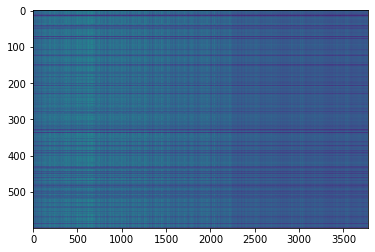

,AUC,pAUC
Source_0,0.674700,0.618421
Source_1,0.744600,0.614211
Source_2,0.819200,0.723684
Target_0,0.696400,0.682105
Target_1,0.709100,0.535789
Target_2,0.439900,0.507368
mean,0.680650,0.613596
h_mean,0.654644,0.604208


2021-05-30 02:34:49,341 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:37809.510742, val_AUC_hmean:0.654644, val_pAUC_hmean:0.604208, best_flag:True
2021-05-30 02:34:49,346 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.74it/s]
2021-05-30 02:34:50,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.07it/s]
2021-05-30 02:34:50,173 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.75it/s]
2021-05-30 02:34:50,226 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:36837.494141, val_AUC_hmean:0.700847, val_pAUC_hmean:0.602781, best_flag:False
2021-05-30 02:34:50,228 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.46it/s]
2021-05-30 02:34:50,960 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.48it/s]
2021-05-30 02:34:51,018 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.05it/s]
2021-05-30 02

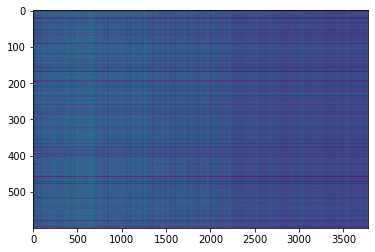

,AUC,pAUC
Source_0,0.807700,0.636842
Source_1,0.728900,0.614211
Source_2,0.849700,0.738421
Target_0,0.738300,0.677368
Target_1,0.698700,0.537368
Target_2,0.400200,0.498421
mean,0.703917,0.617105
h_mean,0.661424,0.606296


2021-05-30 02:34:54,561 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:33829.950521, val_AUC_hmean:0.661424, val_pAUC_hmean:0.606296, best_flag:True
2021-05-30 02:34:54,562 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.75it/s]
2021-05-30 02:34:55,280 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.25it/s]
2021-05-30 02:34:55,337 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.04it/s]


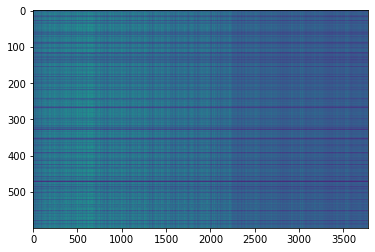

,AUC,pAUC
Source_0,0.789300,0.657895
Source_1,0.719200,0.624737
Source_2,0.826300,0.737368
Target_0,0.777800,0.700000
Target_1,0.709800,0.523158
Target_2,0.485800,0.513684
mean,0.718033,0.626140
h_mean,0.696009,0.614527


2021-05-30 02:34:57,062 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:32886.966634, val_AUC_hmean:0.696009, val_pAUC_hmean:0.614527, best_flag:True
2021-05-30 02:34:57,063 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.01it/s]
2021-05-30 02:34:57,770 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.73it/s]
2021-05-30 02:34:57,828 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.81it/s]
2021-05-30 02:34:57,885 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:32006.607422, val_AUC_hmean:0.696410, val_pAUC_hmean:0.608215, best_flag:False
2021-05-30 02:34:57,886 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.43it/s]
2021-05-30 02:34:58,666 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.19it/s]
2021-05-30 02:34:58,729 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.50it/s]
2021-05-30 02

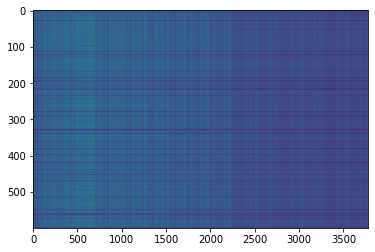

,AUC,pAUC
Source_0,0.765000,0.644737
Source_1,0.709200,0.651579
Source_2,0.852600,0.733158
Target_0,0.650600,0.658421
Target_1,0.776400,0.565789
Target_2,0.493300,0.514737
mean,0.707850,0.628070
h_mean,0.686317,0.619919


2021-05-30 02:35:06,294 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:26426.831380, val_AUC_hmean:0.686317, val_pAUC_hmean:0.619919, best_flag:True
2021-05-30 02:35:06,295 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.24it/s]
2021-05-30 02:35:06,994 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.64it/s]
2021-05-30 02:35:07,061 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.52it/s]


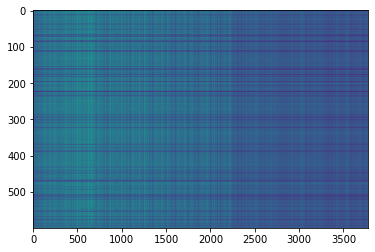

,AUC,pAUC
Source_0,0.742600,0.634737
Source_1,0.734400,0.655263
Source_2,0.836700,0.741053
Target_0,0.642800,0.656316
Target_1,0.819300,0.582632
Target_2,0.485000,0.514211
mean,0.710133,0.630702
h_mean,0.686377,0.622683


2021-05-30 02:35:08,741 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:25992.777669, val_AUC_hmean:0.686377, val_pAUC_hmean:0.622683, best_flag:True
2021-05-30 02:35:08,742 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.92it/s]
2021-05-30 02:35:09,497 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.47it/s]
2021-05-30 02:35:09,547 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.40it/s]


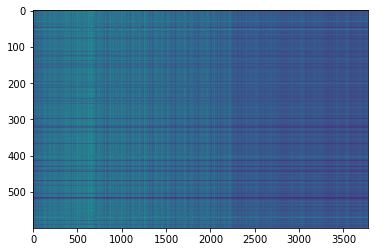

,AUC,pAUC
Source_0,0.791200,0.631579
Source_1,0.722900,0.653158
Source_2,0.866200,0.734737
Target_0,0.740800,0.644737
Target_1,0.830800,0.607368
Target_2,0.439000,0.509474
mean,0.731817,0.630175
h_mean,0.694996,0.622687


2021-05-30 02:35:11,291 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:25325.834798, val_AUC_hmean:0.694996, val_pAUC_hmean:0.622687, best_flag:True
2021-05-30 02:35:11,292 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.93it/s]
2021-05-30 02:35:12,047 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.01it/s]
2021-05-30 02:35:12,106 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.42it/s]


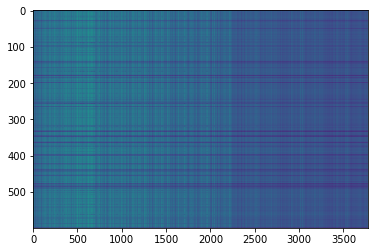

,AUC,pAUC
Source_0,0.78320,0.651579
Source_1,0.73020,0.628421
Source_2,0.88230,0.738947
Target_0,0.70180,0.656842
Target_1,0.81690,0.596316
Target_2,0.44700,0.514211
mean,0.72690,0.631053
h_mean,0.69237,0.623478


2021-05-30 02:35:13,944 - pytorch_modeler.py - INFO - epoch:36/300, train_losses:24782.379883, val_AUC_hmean:0.692370, val_pAUC_hmean:0.623478, best_flag:True
2021-05-30 02:35:13,945 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 24.42it/s]
2021-05-30 02:35:14,439 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.44it/s]
2021-05-30 02:35:14,488 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.45it/s]
2021-05-30 02:35:14,540 - pytorch_modeler.py - INFO - epoch:37/300, train_losses:24320.551270, val_AUC_hmean:0.669565, val_pAUC_hmean:0.611398, best_flag:False
2021-05-30 02:35:14,541 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.72it/s]
2021-05-30 02:35:15,261 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.03it/s]
2021-05-30 02:35:15,322 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.38it/s]
2021-05-30 02

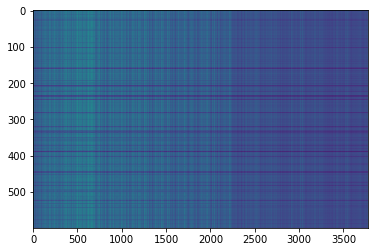

,AUC,pAUC
Source_0,0.801100,0.655263
Source_1,0.762000,0.645263
Source_2,0.869900,0.752105
Target_0,0.698800,0.651053
Target_1,0.844200,0.601579
Target_2,0.418200,0.505263
mean,0.732367,0.635088
h_mean,0.688314,0.626116


2021-05-30 02:35:23,005 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:20417.996094, val_AUC_hmean:0.688314, val_pAUC_hmean:0.626116, best_flag:True
2021-05-30 02:35:23,005 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.16it/s]
2021-05-30 02:35:23,750 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.89it/s]
2021-05-30 02:35:23,821 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.55it/s]
2021-05-30 02:35:23,870 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:19976.486165, val_AUC_hmean:0.643260, val_pAUC_hmean:0.615590, best_flag:False
2021-05-30 02:35:23,871 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.12it/s]
2021-05-30 02:35:24,618 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.39it/s]
2021-05-30 02:35:24,669 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.14it/s]


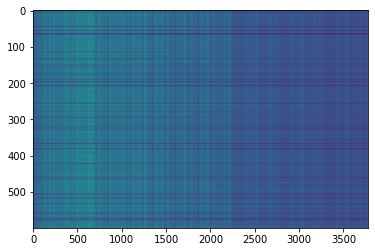

,AUC,pAUC
Source_0,0.753900,0.638947
Source_1,0.752100,0.675263
Source_2,0.845000,0.736316
Target_0,0.647500,0.652632
Target_1,0.845800,0.621053
Target_2,0.474000,0.512632
mean,0.719717,0.639474
h_mean,0.691571,0.631763


2021-05-30 02:35:26,326 - pytorch_modeler.py - INFO - epoch:47/300, train_losses:19620.088542, val_AUC_hmean:0.691571, val_pAUC_hmean:0.631763, best_flag:True
2021-05-30 02:35:26,327 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.60it/s]
2021-05-30 02:35:27,052 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.80it/s]
2021-05-30 02:35:27,111 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.34it/s]
2021-05-30 02:35:27,157 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:19258.135091, val_AUC_hmean:0.683566, val_pAUC_hmean:0.618121, best_flag:False
2021-05-30 02:35:27,158 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.77it/s]
2021-05-30 02:35:27,836 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.92it/s]
2021-05-30 02:35:27,894 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.23it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 56.43it/s]
2021-05-30 02:35:40,589 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.42it/s]
2021-05-30 02:35:40,650 - pytorch_modeler.py - INFO - epoch:64/300, train_losses:13913.237305, val_AUC_hmean:0.646110, val_pAUC_hmean:0.617835, best_flag:False
2021-05-30 02:35:40,651 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.26it/s]
2021-05-30 02:35:41,391 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.36it/s]
2021-05-30 02:35:41,447 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.22it/s]


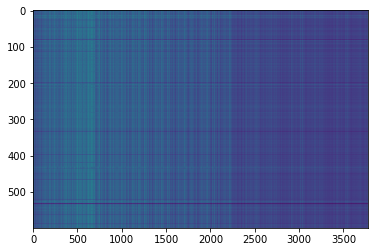

,AUC,pAUC
Source_0,0.779200,0.663684
Source_1,0.776700,0.655789
Source_2,0.820700,0.732105
Target_0,0.697100,0.670000
Target_1,0.860700,0.617895
Target_2,0.562100,0.525789
mean,0.749417,0.644211
h_mean,0.734867,0.637594


2021-05-30 02:35:43,089 - pytorch_modeler.py - INFO - epoch:65/300, train_losses:13710.433512, val_AUC_hmean:0.734867, val_pAUC_hmean:0.637594, best_flag:True
2021-05-30 02:35:43,092 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.53it/s]
2021-05-30 02:35:43,820 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.51it/s]
2021-05-30 02:35:43,877 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.33it/s]
2021-05-30 02:35:43,934 - pytorch_modeler.py - INFO - epoch:66/300, train_losses:13417.988037, val_AUC_hmean:0.681320, val_pAUC_hmean:0.626725, best_flag:False
2021-05-30 02:35:43,935 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.18it/s]
2021-05-30 02:35:44,636 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.53it/s]
2021-05-30 02:35:44,698 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.90it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 54.71it/s]
2021-05-30 02:35:57,072 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.21it/s]
2021-05-30 02:35:57,129 - pytorch_modeler.py - INFO - epoch:82/300, train_losses:9822.185140, val_AUC_hmean:0.668816, val_pAUC_hmean:0.624091, best_flag:False
2021-05-30 02:35:57,130 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.26it/s]
2021-05-30 02:35:57,919 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.80it/s]
2021-05-30 02:35:57,981 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.85it/s]
2021-05-30 02:35:58,035 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:9560.316406, val_AUC_hmean:0.671389, val_pAUC_hmean:0.607411, best_flag:False
2021-05-30 02:35:58,036 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.66it/s]
2021-05-30 02:35:58,759 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-05-30 02:36:10,459 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.14it/s]
2021-05-30 02:36:11,161 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.01it/s]
2021-05-30 02:36:11,220 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.49it/s]
2021-05-30 02:36:11,284 - pytorch_modeler.py - INFO - epoch:99/300, train_losses:7006.847616, val_AUC_hmean:0.685204, val_pAUC_hmean:0.624304, best_flag:False
2021-05-30 02:36:11,285 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.01it/s]
2021-05-30 02:36:11,993 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.99it/s]
2021-05-30 02:36:12,050 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.13it/s]
2021-05-30 02:36:12,109 - pytorch_modeler.py - INFO - epoch:100/300, train_losses:6814.865438, val_AUC_hmean:0.688733, val_pAUC_hmean:0.629822, best_flag:False
2021-05-30 02

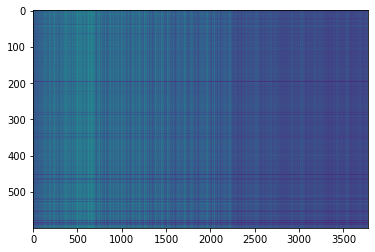

,AUC,pAUC
Source_0,0.751500,0.654737
Source_1,0.745400,0.653684
Source_2,0.844800,0.728947
Target_0,0.668300,0.684211
Target_1,0.844500,0.631579
Target_2,0.464700,0.522632
mean,0.719867,0.645965
h_mean,0.690581,0.639166


2021-05-30 02:36:15,303 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:6545.567708, val_AUC_hmean:0.690581, val_pAUC_hmean:0.639166, best_flag:True
2021-05-30 02:36:15,305 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.33it/s]
2021-05-30 02:36:16,090 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.68it/s]
2021-05-30 02:36:16,146 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.80it/s]
2021-05-30 02:36:16,199 - pytorch_modeler.py - INFO - epoch:103/300, train_losses:6390.325562, val_AUC_hmean:0.679322, val_pAUC_hmean:0.628466, best_flag:False
2021-05-30 02:36:16,200 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.08it/s]
2021-05-30 02:36:16,906 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.66it/s]
2021-05-30 02:36:16,967 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.61it/s]
2021-05-30 02

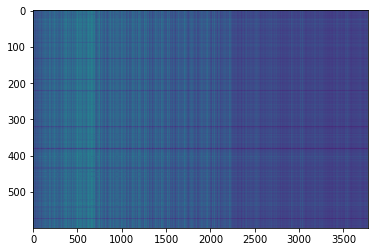

,AUC,pAUC
Source_0,0.780700,0.660526
Source_1,0.743300,0.645263
Source_2,0.840300,0.733684
Target_0,0.692700,0.680526
Target_1,0.860100,0.658421
Target_2,0.441100,0.508947
mean,0.726367,0.647895
h_mean,0.690477,0.639675


2021-05-30 02:36:20,196 - pytorch_modeler.py - INFO - epoch:106/300, train_losses:6139.467489, val_AUC_hmean:0.690477, val_pAUC_hmean:0.639675, best_flag:True
2021-05-30 02:36:20,197 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.14it/s]
2021-05-30 02:36:20,900 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.32it/s]
2021-05-30 02:36:20,957 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.67it/s]
2021-05-30 02:36:21,014 - pytorch_modeler.py - INFO - epoch:107/300, train_losses:6030.587769, val_AUC_hmean:0.676183, val_pAUC_hmean:0.637008, best_flag:False
2021-05-30 02:36:21,015 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.99it/s]
2021-05-30 02:36:21,724 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.93it/s]
2021-05-30 02:36:21,784 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.00it/s]
2021-05-30 02

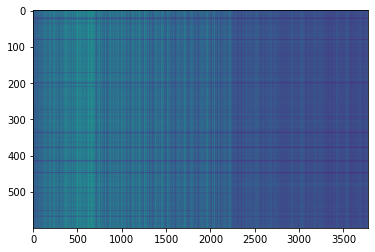

,AUC,pAUC
Source_0,0.755400,0.652105
Source_1,0.755600,0.650526
Source_2,0.843800,0.732632
Target_0,0.667100,0.670526
Target_1,0.868200,0.669474
Target_2,0.436300,0.511579
mean,0.721067,0.647807
h_mean,0.683745,0.639968


2021-05-30 02:36:28,384 - pytorch_modeler.py - INFO - epoch:114/300, train_losses:5267.793132, val_AUC_hmean:0.683745, val_pAUC_hmean:0.639968, best_flag:True
2021-05-30 02:36:28,385 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.43it/s]
2021-05-30 02:36:29,118 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.93it/s]
2021-05-30 02:36:29,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.20it/s]
2021-05-30 02:36:29,234 - pytorch_modeler.py - INFO - epoch:115/300, train_losses:5144.310303, val_AUC_hmean:0.698204, val_pAUC_hmean:0.634162, best_flag:False
2021-05-30 02:36:29,235 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.25it/s]
2021-05-30 02:36:29,933 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.34it/s]
2021-05-30 02:36:29,997 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.37it/s]
2021-05-30 02

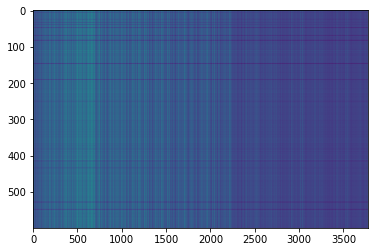

,AUC,pAUC
Source_0,0.755900,0.661053
Source_1,0.764400,0.651579
Source_2,0.858200,0.722632
Target_0,0.650200,0.674737
Target_1,0.858300,0.664211
Target_2,0.440900,0.512632
mean,0.721317,0.647807
h_mean,0.684342,0.640367


2021-05-30 02:36:42,463 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:3942.647298, val_AUC_hmean:0.684342, val_pAUC_hmean:0.640367, best_flag:True
2021-05-30 02:36:42,464 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.83it/s]
2021-05-30 02:36:43,179 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.64it/s]
2021-05-30 02:36:43,241 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.18it/s]
2021-05-30 02:36:43,297 - pytorch_modeler.py - INFO - epoch:130/300, train_losses:3812.830933, val_AUC_hmean:0.655205, val_pAUC_hmean:0.635441, best_flag:False
2021-05-30 02:36:43,298 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.01it/s]
2021-05-30 02:36:44,006 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.44it/s]
2021-05-30 02:36:44,074 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.06it/s]
2021-05-30 02

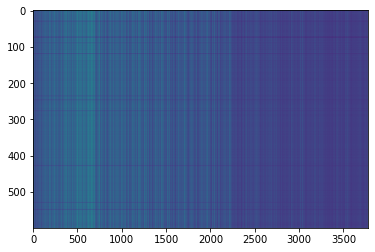

,AUC,pAUC
Source_0,0.792900,0.656842
Source_1,0.748200,0.650000
Source_2,0.818500,0.725263
Target_0,0.695800,0.683158
Target_1,0.862300,0.674737
Target_2,0.405400,0.508947
mean,0.720517,0.649825
h_mean,0.675443,0.641684


2021-05-30 02:36:52,295 - pytorch_modeler.py - INFO - epoch:139/300, train_losses:3199.669454, val_AUC_hmean:0.675443, val_pAUC_hmean:0.641684, best_flag:True
2021-05-30 02:36:52,296 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.38it/s]
2021-05-30 02:36:53,030 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.03it/s]
2021-05-30 02:36:53,091 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.17it/s]
2021-05-30 02:36:53,152 - pytorch_modeler.py - INFO - epoch:140/300, train_losses:3161.212382, val_AUC_hmean:0.679760, val_pAUC_hmean:0.636867, best_flag:False
2021-05-30 02:36:53,153 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.22it/s]
2021-05-30 02:36:53,895 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.44it/s]
2021-05-30 02:36:53,955 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.84it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 81.99it/s]
2021-05-30 02:37:05,740 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.97it/s]
2021-05-30 02:37:05,783 - pytorch_modeler.py - INFO - epoch:156/300, train_losses:2334.001790, val_AUC_hmean:0.710722, val_pAUC_hmean:0.636143, best_flag:False
2021-05-30 02:37:05,784 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.93it/s]
2021-05-30 02:37:06,388 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.42it/s]
2021-05-30 02:37:06,452 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.62it/s]
2021-05-30 02:37:06,511 - pytorch_modeler.py - INFO - epoch:157/300, train_losses:2254.158183, val_AUC_hmean:0.676781, val_pAUC_hmean:0.636593, best_flag:False
2021-05-30 02:37:06,513 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.75it/s]
2021-05-30 02:37:07,093 - pytorch_modeler.py - INFO - valid_source
100%|███████

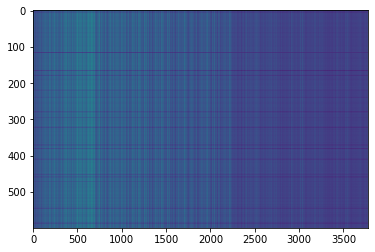

,AUC,pAUC
Source_0,0.783300,0.664211
Source_1,0.734800,0.656842
Source_2,0.834000,0.712105
Target_0,0.687500,0.678947
Target_1,0.875800,0.686842
Target_2,0.397300,0.508947
mean,0.718783,0.651316
h_mean,0.670395,0.643368


2021-05-30 02:37:08,901 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:2258.108724, val_AUC_hmean:0.670395, val_pAUC_hmean:0.643368, best_flag:True
2021-05-30 02:37:08,901 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 21.68it/s]
2021-05-30 02:37:09,461 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 20.51it/s]
2021-05-30 02:37:09,577 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.33it/s]
2021-05-30 02:37:09,624 - pytorch_modeler.py - INFO - epoch:159/300, train_losses:2219.091675, val_AUC_hmean:0.672404, val_pAUC_hmean:0.632981, best_flag:False
2021-05-30 02:37:09,625 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.31it/s]
2021-05-30 02:37:10,101 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.61it/s]
2021-05-30 02:37:10,143 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.35it/s]
2021-05-30 02

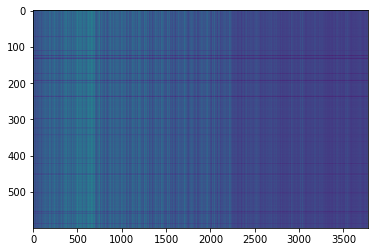

,AUC,pAUC
Source_0,0.800600,0.662105
Source_1,0.762100,0.666316
Source_2,0.851800,0.716316
Target_0,0.684600,0.676316
Target_1,0.872300,0.673158
Target_2,0.391300,0.512632
mean,0.727117,0.651140
h_mean,0.674317,0.643638


2021-05-30 02:37:13,378 - pytorch_modeler.py - INFO - epoch:162/300, train_losses:2067.585317, val_AUC_hmean:0.674317, val_pAUC_hmean:0.643638, best_flag:True
2021-05-30 02:37:13,379 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 23.50it/s]
2021-05-30 02:37:13,891 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.58it/s]
2021-05-30 02:37:13,939 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.56it/s]
2021-05-30 02:37:13,994 - pytorch_modeler.py - INFO - epoch:163/300, train_losses:2050.633962, val_AUC_hmean:0.684598, val_pAUC_hmean:0.638705, best_flag:False
2021-05-30 02:37:13,995 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.27it/s]
2021-05-30 02:37:14,692 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.81it/s]
2021-05-30 02:37:14,756 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.31it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 79.61it/s]
2021-05-30 02:37:24,365 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.28it/s]
2021-05-30 02:37:24,420 - pytorch_modeler.py - INFO - epoch:179/300, train_losses:1568.485036, val_AUC_hmean:0.637518, val_pAUC_hmean:0.630424, best_flag:False
2021-05-30 02:37:24,421 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.93it/s]
2021-05-30 02:37:25,132 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.20it/s]
2021-05-30 02:37:25,179 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.64it/s]
2021-05-30 02:37:25,228 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:1573.382680, val_AUC_hmean:0.639986, val_pAUC_hmean:0.630006, best_flag:False
2021-05-30 02:37:25,231 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.24it/s]
2021-05-30 02:37:25,973 - pytorch_modeler.py - INFO - valid_source
100%|███████

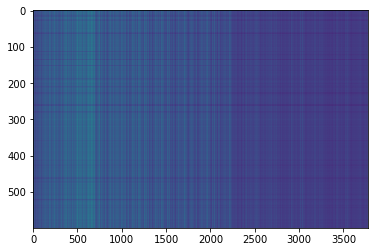

,AUC,pAUC
Source_0,0.785100,0.672105
Source_1,0.742900,0.651053
Source_2,0.847500,0.734211
Target_0,0.710700,0.681053
Target_1,0.860100,0.662632
Target_2,0.426200,0.522632
mean,0.728750,0.653947
h_mean,0.688407,0.646783


2021-05-30 02:37:36,101 - pytorch_modeler.py - INFO - epoch:193/300, train_losses:1186.944672, val_AUC_hmean:0.688407, val_pAUC_hmean:0.646783, best_flag:True
2021-05-30 02:37:36,102 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.58it/s]
2021-05-30 02:37:36,828 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.93it/s]
2021-05-30 02:37:36,885 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.00it/s]
2021-05-30 02:37:36,945 - pytorch_modeler.py - INFO - epoch:194/300, train_losses:1199.657725, val_AUC_hmean:0.649279, val_pAUC_hmean:0.631239, best_flag:False
2021-05-30 02:37:36,946 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 23.97it/s]
2021-05-30 02:37:37,449 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.96it/s]
2021-05-30 02:37:37,502 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.62it/s]
2021-05-30 02

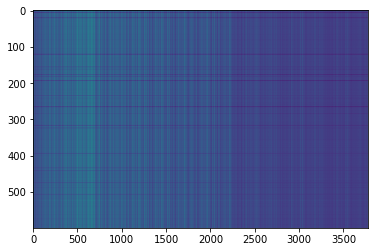

,AUC,pAUC
Source_0,0.745500,0.666842
Source_1,0.753100,0.661579
Source_2,0.840200,0.738947
Target_0,0.676700,0.686316
Target_1,0.852700,0.659474
Target_2,0.416500,0.517368
mean,0.714117,0.655088
h_mean,0.673334,0.647201


2021-05-30 02:37:44,682 - pytorch_modeler.py - INFO - epoch:203/300, train_losses:1027.650472, val_AUC_hmean:0.673334, val_pAUC_hmean:0.647201, best_flag:True
2021-05-30 02:37:44,683 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.43it/s]
2021-05-30 02:37:45,463 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.43it/s]
2021-05-30 02:37:45,529 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.63it/s]
2021-05-30 02:37:45,583 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:989.974548, val_AUC_hmean:0.671340, val_pAUC_hmean:0.634881, best_flag:False
2021-05-30 02:37:45,584 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.89it/s]
2021-05-30 02:37:46,296 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.55it/s]
2021-05-30 02:37:46,355 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.64it/s]
2021-05-30 02:

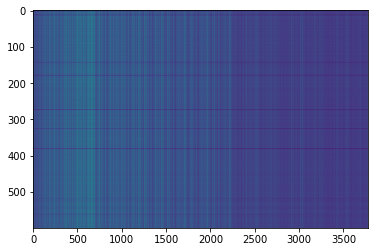

,AUC,pAUC
Source_0,0.759300,0.677895
Source_1,0.758000,0.660526
Source_2,0.865500,0.732632
Target_0,0.686100,0.672105
Target_1,0.863000,0.680000
Target_2,0.385300,0.515263
mean,0.719533,0.656404
h_mean,0.666422,0.648421


2021-05-30 02:37:53,203 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:818.695175, val_AUC_hmean:0.666422, val_pAUC_hmean:0.648421, best_flag:True
2021-05-30 02:37:53,204 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 24.82it/s]
2021-05-30 02:37:53,690 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.60it/s]
2021-05-30 02:37:53,737 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.97it/s]
2021-05-30 02:37:53,777 - pytorch_modeler.py - INFO - epoch:214/300, train_losses:769.635885, val_AUC_hmean:0.676609, val_pAUC_hmean:0.640007, best_flag:False
2021-05-30 02:37:53,778 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.12it/s]
2021-05-30 02:37:54,258 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.04it/s]
2021-05-30 02:37:54,297 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.47it/s]
2021-05-30 02:3

100%|██████████| 2/2 [00:00<00:00, 50.80it/s]
2021-05-30 02:38:06,187 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.26it/s]
2021-05-30 02:38:06,248 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:583.916234, val_AUC_hmean:0.666510, val_pAUC_hmean:0.644936, best_flag:False
2021-05-30 02:38:06,249 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.15it/s]
2021-05-30 02:38:06,951 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.19it/s]
2021-05-30 02:38:07,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.72it/s]
2021-05-30 02:38:07,073 - pytorch_modeler.py - INFO - epoch:231/300, train_losses:598.877782, val_AUC_hmean:0.656736, val_pAUC_hmean:0.647017, best_flag:False
2021-05-30 02:38:07,074 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.89it/s]
2021-05-30 02:38:07,788 - pytorch_modeler.py - INFO - valid_source
100%|█████████

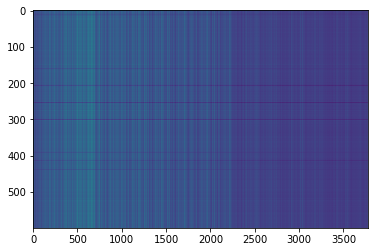

,AUC,pAUC
Source_0,0.791900,0.684211
Source_1,0.764500,0.659474
Source_2,0.841500,0.731579
Target_0,0.694400,0.687368
Target_1,0.860600,0.675263
Target_2,0.375400,0.507368
mean,0.721383,0.657544
h_mean,0.664814,0.648544


2021-05-30 02:38:12,715 - pytorch_modeler.py - INFO - epoch:236/300, train_losses:530.931203, val_AUC_hmean:0.664814, val_pAUC_hmean:0.648544, best_flag:True
2021-05-30 02:38:12,716 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.52it/s]
2021-05-30 02:38:13,445 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.71it/s]
2021-05-30 02:38:13,494 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.32it/s]
2021-05-30 02:38:13,547 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:565.267810, val_AUC_hmean:0.677486, val_pAUC_hmean:0.646423, best_flag:False
2021-05-30 02:38:13,548 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.65it/s]
2021-05-30 02:38:14,271 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.02it/s]
2021-05-30 02:38:14,328 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.20it/s]
2021-05-30 02:3

100%|██████████| 2/2 [00:00<00:00, 60.38it/s]
2021-05-30 02:38:25,378 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.15it/s]
2021-05-30 02:38:25,439 - pytorch_modeler.py - INFO - epoch:253/300, train_losses:486.781342, val_AUC_hmean:0.673556, val_pAUC_hmean:0.645261, best_flag:False
2021-05-30 02:38:25,440 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.82it/s]
2021-05-30 02:38:26,157 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.93it/s]
2021-05-30 02:38:26,215 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.70it/s]
2021-05-30 02:38:26,274 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:391.532110, val_AUC_hmean:0.657434, val_pAUC_hmean:0.641900, best_flag:False
2021-05-30 02:38:26,276 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.88it/s]
2021-05-30 02:38:26,989 - pytorch_modeler.py - INFO - valid_source
100%|█████████

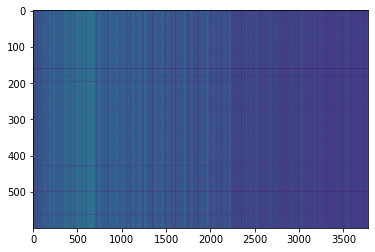

,AUC,pAUC
Source_0,0.796600,0.685263
Source_1,0.755700,0.639474
Source_2,0.859000,0.734737
Target_0,0.704700,0.684737
Target_1,0.870400,0.697368
Target_2,0.376100,0.510000
mean,0.727083,0.658596
h_mean,0.668929,0.649402


2021-05-30 02:38:33,636 - pytorch_modeler.py - INFO - epoch:261/300, train_losses:373.523206, val_AUC_hmean:0.668929, val_pAUC_hmean:0.649402, best_flag:True
2021-05-30 02:38:33,637 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.64it/s]
2021-05-30 02:38:34,361 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 16.60it/s]
2021-05-30 02:38:34,501 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.04it/s]
2021-05-30 02:38:34,559 - pytorch_modeler.py - INFO - epoch:262/300, train_losses:375.490275, val_AUC_hmean:0.662436, val_pAUC_hmean:0.641076, best_flag:False
2021-05-30 02:38:34,560 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.98it/s]
2021-05-30 02:38:35,269 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.45it/s]
2021-05-30 02:38:35,328 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.12it/s]
2021-05-30 02:3

100%|██████████| 2/2 [00:00<00:00, 52.52it/s]
2021-05-30 02:38:47,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.52it/s]
2021-05-30 02:38:47,731 - pytorch_modeler.py - INFO - epoch:278/300, train_losses:276.420254, val_AUC_hmean:0.673890, val_pAUC_hmean:0.638521, best_flag:False
2021-05-30 02:38:47,732 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.01it/s]
2021-05-30 02:38:48,440 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.22it/s]
2021-05-30 02:38:48,501 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.23it/s]
2021-05-30 02:38:48,556 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:329.355813, val_AUC_hmean:0.670744, val_pAUC_hmean:0.640143, best_flag:False
2021-05-30 02:38:48,557 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.04it/s]
2021-05-30 02:38:49,264 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-05-30 02:39:01,119 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.94it/s]
2021-05-30 02:39:01,829 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.51it/s]
2021-05-30 02:39:01,886 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.01it/s]
2021-05-30 02:39:01,944 - pytorch_modeler.py - INFO - epoch:295/300, train_losses:213.935960, val_AUC_hmean:0.653535, val_pAUC_hmean:0.643842, best_flag:False
2021-05-30 02:39:01,945 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.14it/s]
2021-05-30 02:39:02,647 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.10it/s]
2021-05-30 02:39:02,704 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.00it/s]
2021-05-30 02:39:02,765 - pytorch_modeler.py - INFO - epoch:296/300, train_losses:237.570451, val_AUC_hmean:0.659224, val_pAUC_hmean:0.642892, best_flag:False
2021-05-30 02:

,AUC,pAUC
Source_0,0.796600,0.685263
Source_1,0.755700,0.639474
Source_2,0.859000,0.734737
Target_0,0.704700,0.684737
Target_1,0.870400,0.697368
Target_2,0.376100,0.510000
mean,0.727083,0.658596
h_mean,0.668929,0.649402


2021-05-30 02:39:06,068 - 00_train.py - INFO - TARGET MACHINE_TYPE: gearbox
2021-05-30 02:39:06,069 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 02:39:06,071 - 00_train.py - INFO - TRAINING


elapsed time: 295.518304825 [sec]


2021-05-30 02:39:06,499 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 16.73it/s]
2021-05-30 02:39:07,219 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.72it/s]
2021-05-30 02:39:07,280 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.02it/s]


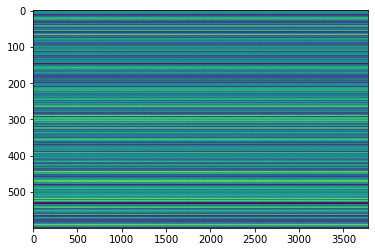

,AUC,pAUC
Source_0,0.545600,0.534737
Source_1,0.556600,0.563158
Source_2,0.613400,0.545263
Target_0,0.524000,0.578947
Target_1,0.666500,0.578421
Target_2,0.586100,0.503684
mean,0.582033,0.550702
h_mean,0.578331,0.549388


2021-05-30 02:39:08,848 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:136830.949219, val_AUC_hmean:0.578331, val_pAUC_hmean:0.549388, best_flag:True
2021-05-30 02:39:08,849 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.08it/s]
2021-05-30 02:39:09,648 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.63it/s]
2021-05-30 02:39:09,691 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.37it/s]


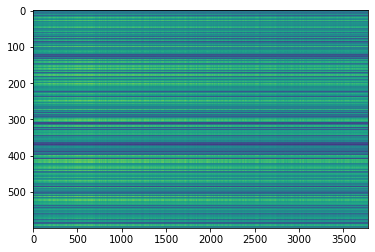

,AUC,pAUC
Source_0,0.609700,0.572632
Source_1,0.608000,0.534737
Source_2,0.691300,0.580526
Target_0,0.540400,0.601053
Target_1,0.704600,0.577895
Target_2,0.638400,0.503684
mean,0.632067,0.561754
h_mean,0.627118,0.559779


2021-05-30 02:39:11,391 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:88421.183594, val_AUC_hmean:0.627118, val_pAUC_hmean:0.559779, best_flag:True
2021-05-30 02:39:11,392 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.25it/s]
2021-05-30 02:39:12,132 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.72it/s]
2021-05-30 02:39:12,189 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.48it/s]
2021-05-30 02:39:12,237 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:77224.423828, val_AUC_hmean:0.632950, val_pAUC_hmean:0.540070, best_flag:False
2021-05-30 02:39:12,238 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.24it/s]
2021-05-30 02:39:12,978 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.63it/s]
2021-05-30 02:39:13,037 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.48it/s]


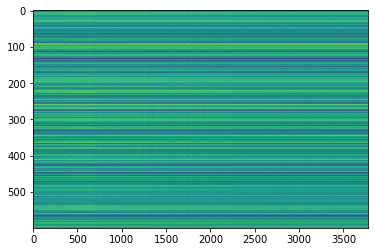

,AUC,pAUC
Source_0,0.597200,0.568947
Source_1,0.626000,0.518947
Source_2,0.743900,0.624211
Target_0,0.578400,0.621053
Target_1,0.658500,0.544211
Target_2,0.668300,0.543158
mean,0.645383,0.570088
h_mean,0.641023,0.567354


2021-05-30 02:39:14,615 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:70906.358073, val_AUC_hmean:0.641023, val_pAUC_hmean:0.567354, best_flag:True
2021-05-30 02:39:14,616 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.91it/s]
2021-05-30 02:39:15,328 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.29it/s]
2021-05-30 02:39:15,386 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.18it/s]


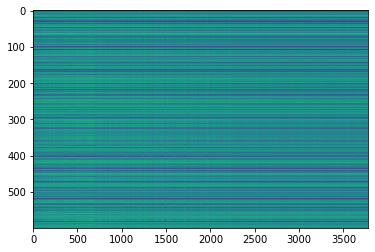

,AUC,pAUC
Source_0,0.691500,0.602105
Source_1,0.696100,0.573158
Source_2,0.666500,0.596842
Target_0,0.674900,0.641579
Target_1,0.613900,0.492105
Target_2,0.583800,0.538421
mean,0.654450,0.574035
h_mean,0.651704,0.569851


2021-05-30 02:39:17,183 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:66793.593424, val_AUC_hmean:0.651704, val_pAUC_hmean:0.569851, best_flag:True
2021-05-30 02:39:17,184 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.77it/s]
2021-05-30 02:39:17,902 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.78it/s]
2021-05-30 02:39:17,965 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.99it/s]
2021-05-30 02:39:18,024 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:63329.847982, val_AUC_hmean:0.676922, val_pAUC_hmean:0.563788, best_flag:False
2021-05-30 02:39:18,025 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.99it/s]
2021-05-30 02:39:18,734 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.93it/s]
2021-05-30 02:39:18,794 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.49it/s]


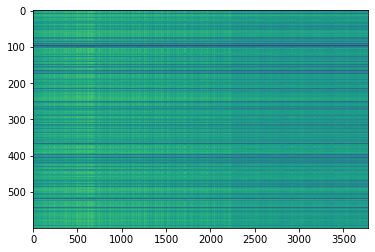

,AUC,pAUC
Source_0,0.705400,0.624737
Source_1,0.670000,0.560526
Source_2,0.737700,0.612105
Target_0,0.723200,0.658421
Target_1,0.660900,0.504737
Target_2,0.596500,0.497895
mean,0.682283,0.576404
h_mean,0.678885,0.569969


2021-05-30 02:39:20,452 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:60085.823893, val_AUC_hmean:0.678885, val_pAUC_hmean:0.569969, best_flag:True
2021-05-30 02:39:20,454 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.74it/s]
2021-05-30 02:39:21,173 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.71it/s]
2021-05-30 02:39:21,232 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.84it/s]


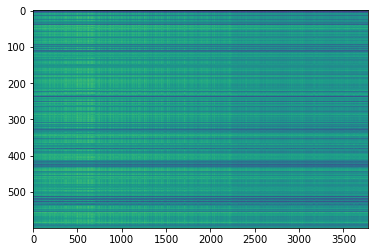

,AUC,pAUC
Source_0,0.757300,0.646316
Source_1,0.660100,0.546842
Source_2,0.820300,0.670000
Target_0,0.711800,0.655789
Target_1,0.637200,0.503158
Target_2,0.637200,0.545789
mean,0.703983,0.594649
h_mean,0.697829,0.587487


2021-05-30 02:39:22,875 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:57343.948568, val_AUC_hmean:0.697829, val_pAUC_hmean:0.587487, best_flag:True
2021-05-30 02:39:22,876 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.05it/s]
2021-05-30 02:39:23,582 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.25it/s]
2021-05-30 02:39:23,641 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.74it/s]


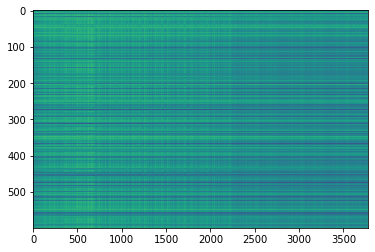

,AUC,pAUC
Source_0,0.726400,0.618421
Source_1,0.700800,0.594737
Source_2,0.790300,0.692105
Target_0,0.732900,0.658421
Target_1,0.680100,0.528421
Target_2,0.627300,0.523684
mean,0.709633,0.602632
h_mean,0.706058,0.596180


2021-05-30 02:39:25,247 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:54435.019206, val_AUC_hmean:0.706058, val_pAUC_hmean:0.596180, best_flag:True
2021-05-30 02:39:25,248 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.03it/s]
2021-05-30 02:39:25,955 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.23it/s]
2021-05-30 02:39:26,014 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.72it/s]


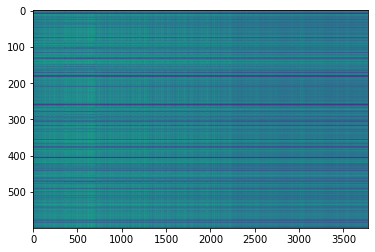

,AUC,pAUC
Source_0,0.772900,0.623158
Source_1,0.709300,0.596842
Source_2,0.801600,0.723158
Target_0,0.730000,0.651579
Target_1,0.701700,0.534737
Target_2,0.619200,0.523684
mean,0.722450,0.608860
h_mean,0.717606,0.601359


2021-05-30 02:39:27,691 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:52125.608724, val_AUC_hmean:0.717606, val_pAUC_hmean:0.601359, best_flag:True
2021-05-30 02:39:27,692 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.94it/s]
2021-05-30 02:39:28,447 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.04it/s]
2021-05-30 02:39:28,498 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.21it/s]
2021-05-30 02:39:28,548 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:50031.656250, val_AUC_hmean:0.699284, val_pAUC_hmean:0.592004, best_flag:False
2021-05-30 02:39:28,549 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.11it/s]
2021-05-30 02:39:29,297 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.67it/s]
2021-05-30 02:39:29,339 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.43it/s]


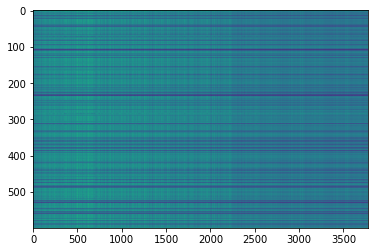

,AUC,pAUC
Source_0,0.777300,0.648947
Source_1,0.730000,0.631579
Source_2,0.797200,0.697368
Target_0,0.735100,0.672632
Target_1,0.706600,0.562632
Target_2,0.552300,0.520000
mean,0.716417,0.622193
h_mean,0.706135,0.615676


2021-05-30 02:39:30,955 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:48289.952799, val_AUC_hmean:0.706135, val_pAUC_hmean:0.615676, best_flag:True
2021-05-30 02:39:30,956 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.84it/s]
2021-05-30 02:39:31,670 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 16.80it/s]
2021-05-30 02:39:31,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.10it/s]
2021-05-30 02:39:31,863 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:46763.050781, val_AUC_hmean:0.678138, val_pAUC_hmean:0.606325, best_flag:False
2021-05-30 02:39:31,864 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.11it/s]
2021-05-30 02:39:32,611 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.33it/s]
2021-05-30 02:39:32,669 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.38it/s]
2021-05-30 02

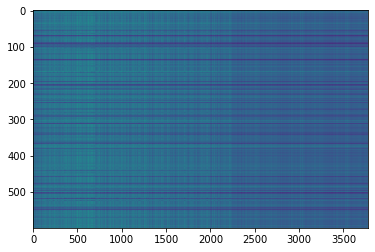

,AUC,pAUC
Source_0,0.812600,0.655789
Source_1,0.721400,0.616316
Source_2,0.829700,0.751579
Target_0,0.744200,0.681053
Target_1,0.706700,0.551579
Target_2,0.562800,0.524737
mean,0.729567,0.630175
h_mean,0.717905,0.620799


2021-05-30 02:39:36,048 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:42360.213216, val_AUC_hmean:0.717905, val_pAUC_hmean:0.620799, best_flag:True
2021-05-30 02:39:36,049 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.46it/s]
2021-05-30 02:39:36,780 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.16it/s]
2021-05-30 02:39:36,837 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.40it/s]


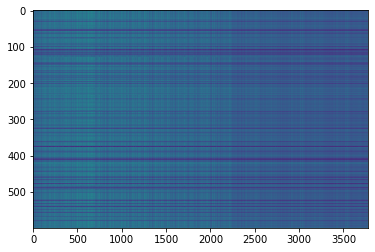

,AUC,pAUC
Source_0,0.801400,0.658421
Source_1,0.763700,0.674211
Source_2,0.805900,0.732105
Target_0,0.705200,0.658421
Target_1,0.730800,0.561579
Target_2,0.468600,0.509474
mean,0.712600,0.632368
h_mean,0.688192,0.623039


2021-05-30 02:39:38,447 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:40850.349284, val_AUC_hmean:0.688192, val_pAUC_hmean:0.623039, best_flag:True
2021-05-30 02:39:38,447 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.12it/s]
2021-05-30 02:39:39,151 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.17it/s]
2021-05-30 02:39:39,210 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.30it/s]
2021-05-30 02:39:39,266 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:39780.292643, val_AUC_hmean:0.704312, val_pAUC_hmean:0.617786, best_flag:False
2021-05-30 02:39:39,267 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.89it/s]
2021-05-30 02:39:39,980 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.38it/s]
2021-05-30 02:39:40,035 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.53it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 56.42it/s]
2021-05-30 02:39:52,487 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.34it/s]
2021-05-30 02:39:52,545 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:26525.342611, val_AUC_hmean:0.675984, val_pAUC_hmean:0.599014, best_flag:False
2021-05-30 02:39:52,546 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.08it/s]
2021-05-30 02:39:53,251 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.78it/s]
2021-05-30 02:39:53,311 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.66it/s]


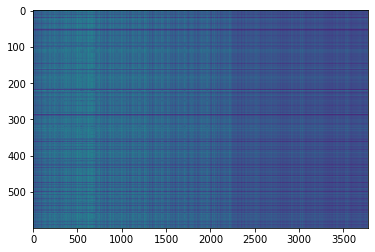

,AUC,pAUC
Source_0,0.809750,0.658947
Source_1,0.753900,0.675263
Source_2,0.853300,0.734737
Target_0,0.684100,0.665789
Target_1,0.780000,0.565789
Target_2,0.515800,0.521579
mean,0.732808,0.637018
h_mean,0.712939,0.628524


2021-05-30 02:39:54,949 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:25873.017578, val_AUC_hmean:0.712939, val_pAUC_hmean:0.628524, best_flag:True
2021-05-30 02:39:54,950 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.74it/s]
2021-05-30 02:39:55,671 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.50it/s]
2021-05-30 02:39:55,729 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.52it/s]
2021-05-30 02:39:55,789 - pytorch_modeler.py - INFO - epoch:36/300, train_losses:25449.993815, val_AUC_hmean:0.682681, val_pAUC_hmean:0.621630, best_flag:False
2021-05-30 02:39:55,791 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.03it/s]
2021-05-30 02:39:56,498 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.23it/s]
2021-05-30 02:39:56,557 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.22it/s]
2021-05-30 02

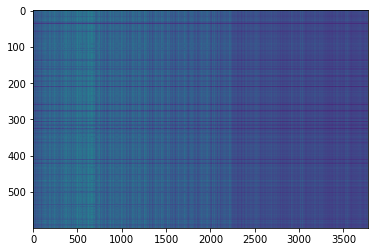

,AUC,pAUC
Source_0,0.831500,0.660000
Source_1,0.758600,0.678947
Source_2,0.841500,0.737895
Target_0,0.714500,0.676316
Target_1,0.823600,0.587895
Target_2,0.464400,0.520526
mean,0.739017,0.643596
h_mean,0.707856,0.635328


2021-05-30 02:40:08,908 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:18618.334961, val_AUC_hmean:0.707856, val_pAUC_hmean:0.635328, best_flag:True
2021-05-30 02:40:08,909 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.42it/s]
2021-05-30 02:40:09,743 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.34it/s]
2021-05-30 02:40:09,801 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.21it/s]
2021-05-30 02:40:09,853 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:18317.380208, val_AUC_hmean:0.676576, val_pAUC_hmean:0.617010, best_flag:False
2021-05-30 02:40:09,855 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.17it/s]
2021-05-30 02:40:10,557 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.13it/s]
2021-05-30 02:40:10,615 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.14it/s]
2021-05-30 02

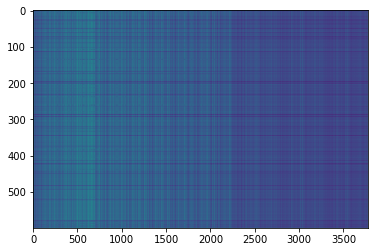

,AUC,pAUC
Source_0,0.849400,0.679474
Source_1,0.713300,0.633684
Source_2,0.825600,0.734737
Target_0,0.731900,0.667895
Target_1,0.835900,0.621579
Target_2,0.550900,0.533684
mean,0.751167,0.645175
h_mean,0.734546,0.638934


2021-05-30 02:40:13,858 - pytorch_modeler.py - INFO - epoch:54/300, train_losses:17519.079590, val_AUC_hmean:0.734546, val_pAUC_hmean:0.638934, best_flag:True
2021-05-30 02:40:13,859 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.23it/s]
2021-05-30 02:40:14,558 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.88it/s]
2021-05-30 02:40:14,625 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.59it/s]
2021-05-30 02:40:14,687 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:16993.610514, val_AUC_hmean:0.714909, val_pAUC_hmean:0.624303, best_flag:False
2021-05-30 02:40:14,688 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.17it/s]
2021-05-30 02:40:15,389 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.78it/s]
2021-05-30 02:40:15,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.01it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 88.69it/s]
2021-05-30 02:40:27,929 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.75it/s]
2021-05-30 02:40:27,970 - pytorch_modeler.py - INFO - epoch:71/300, train_losses:12168.610352, val_AUC_hmean:0.719145, val_pAUC_hmean:0.628546, best_flag:False
2021-05-30 02:40:27,972 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.95it/s]
2021-05-30 02:40:28,682 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.92it/s]
2021-05-30 02:40:28,722 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.30it/s]
2021-05-30 02:40:28,769 - pytorch_modeler.py - INFO - epoch:72/300, train_losses:11861.475260, val_AUC_hmean:0.715683, val_pAUC_hmean:0.625277, best_flag:False
2021-05-30 02:40:28,770 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.13it/s]
2021-05-30 02:40:29,472 - pytorch_modeler.py - INFO - valid_source
100%|███████

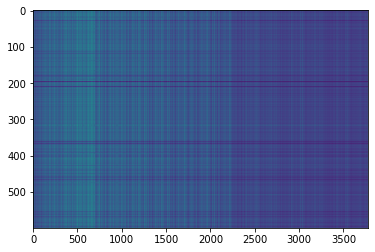

,AUC,pAUC
Source_0,0.836300,0.654211
Source_1,0.741300,0.669474
Source_2,0.846000,0.732105
Target_0,0.704600,0.676316
Target_1,0.854800,0.624211
Target_2,0.445900,0.524737
mean,0.738150,0.646842
h_mean,0.701056,0.640032


2021-05-30 02:40:42,243 - pytorch_modeler.py - INFO - epoch:87/300, train_losses:8662.689779, val_AUC_hmean:0.701056, val_pAUC_hmean:0.640032, best_flag:True
2021-05-30 02:40:42,244 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.34it/s]
2021-05-30 02:40:42,900 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.81it/s]
2021-05-30 02:40:42,952 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.53it/s]
2021-05-30 02:40:43,004 - pytorch_modeler.py - INFO - epoch:88/300, train_losses:8558.270996, val_AUC_hmean:0.727324, val_pAUC_hmean:0.625215, best_flag:False
2021-05-30 02:40:43,005 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.17it/s]
2021-05-30 02:40:43,667 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.25it/s]
2021-05-30 02:40:43,724 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.08it/s]
2021-05-30 02:4

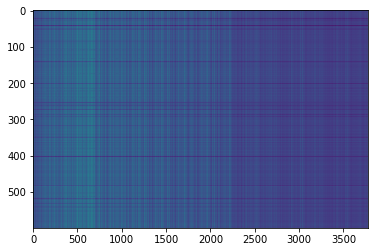

,AUC,pAUC
Source_0,0.855200,0.674737
Source_1,0.741700,0.669474
Source_2,0.861300,0.726842
Target_0,0.739100,0.671053
Target_1,0.851700,0.635263
Target_2,0.425100,0.515263
mean,0.745683,0.648772
h_mean,0.701089,0.641253


2021-05-30 02:40:46,773 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:8036.326782, val_AUC_hmean:0.701089, val_pAUC_hmean:0.641253, best_flag:True
2021-05-30 02:40:46,774 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.94it/s]
2021-05-30 02:40:47,444 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.27it/s]
2021-05-30 02:40:47,498 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.68it/s]
2021-05-30 02:40:47,550 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:7905.326986, val_AUC_hmean:0.673260, val_pAUC_hmean:0.629977, best_flag:False
2021-05-30 02:40:47,551 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.96it/s]
2021-05-30 02:40:48,222 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.86it/s]
2021-05-30 02:40:48,274 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.20it/s]
2021-05-30 02:4

100%|██████████| 2/2 [00:00<00:00, 56.78it/s]
2021-05-30 02:40:59,997 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.69it/s]
2021-05-30 02:41:00,053 - pytorch_modeler.py - INFO - epoch:108/300, train_losses:5706.303670, val_AUC_hmean:0.702528, val_pAUC_hmean:0.635279, best_flag:False
2021-05-30 02:41:00,054 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.33it/s]
2021-05-30 02:41:00,677 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.46it/s]
2021-05-30 02:41:00,731 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.59it/s]
2021-05-30 02:41:00,782 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:5652.843669, val_AUC_hmean:0.703457, val_pAUC_hmean:0.639036, best_flag:False
2021-05-30 02:41:00,783 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.02it/s]
2021-05-30 02:41:01,451 - pytorch_modeler.py - INFO - valid_source
100%|███████

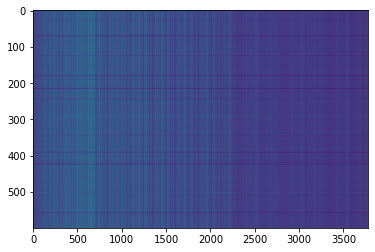

,AUC,pAUC
Source_0,0.818600,0.663158
Source_1,0.744100,0.677368
Source_2,0.852700,0.720526
Target_0,0.669900,0.677895
Target_1,0.860000,0.643684
Target_2,0.517000,0.524211
mean,0.743717,0.651140
h_mean,0.720458,0.644575


2021-05-30 02:41:03,811 - pytorch_modeler.py - INFO - epoch:111/300, train_losses:5380.549967, val_AUC_hmean:0.720458, val_pAUC_hmean:0.644575, best_flag:True
2021-05-30 02:41:03,812 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.03it/s]
2021-05-30 02:41:04,480 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 18.28it/s]
2021-05-30 02:41:04,606 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.26it/s]
2021-05-30 02:41:04,659 - pytorch_modeler.py - INFO - epoch:112/300, train_losses:5241.307414, val_AUC_hmean:0.672588, val_pAUC_hmean:0.636666, best_flag:False
2021-05-30 02:41:04,660 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.02it/s]
2021-05-30 02:41:05,328 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.33it/s]
2021-05-30 02:41:05,380 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.07it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 58.82it/s]
2021-05-30 02:41:16,997 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.77it/s]
2021-05-30 02:41:17,050 - pytorch_modeler.py - INFO - epoch:128/300, train_losses:4082.976888, val_AUC_hmean:0.675509, val_pAUC_hmean:0.607952, best_flag:False
2021-05-30 02:41:17,051 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.30it/s]
2021-05-30 02:41:17,675 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.40it/s]
2021-05-30 02:41:17,727 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.82it/s]
2021-05-30 02:41:17,778 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:4037.641663, val_AUC_hmean:0.658950, val_pAUC_hmean:0.599326, best_flag:False
2021-05-30 02:41:17,779 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 02:41:18,449 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 02:41:29,088 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.72it/s]
2021-05-30 02:41:29,539 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.28it/s]
2021-05-30 02:41:29,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.96it/s]
2021-05-30 02:41:29,625 - pytorch_modeler.py - INFO - epoch:145/300, train_losses:2754.693502, val_AUC_hmean:0.684980, val_pAUC_hmean:0.627030, best_flag:False
2021-05-30 02:41:29,627 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.72it/s]
2021-05-30 02:41:30,078 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.32it/s]
2021-05-30 02:41:30,115 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.90it/s]
2021-05-30 02:41:30,156 - pytorch_modeler.py - INFO - epoch:146/300, train_losses:2782.020487, val_AUC_hmean:0.675839, val_pAUC_hmean:0.631464, best_flag:False
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 98.94it/s]
2021-05-30 02:41:39,393 - pytorch_modeler.py - INFO - epoch:161/300, train_losses:1938.977722, val_AUC_hmean:0.694597, val_pAUC_hmean:0.635645, best_flag:False
2021-05-30 02:41:39,394 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.41it/s]
2021-05-30 02:41:39,984 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.33it/s]
2021-05-30 02:41:40,040 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.64it/s]
2021-05-30 02:41:40,091 - pytorch_modeler.py - INFO - epoch:162/300, train_losses:2008.672526, val_AUC_hmean:0.668740, val_pAUC_hmean:0.629245, best_flag:False
2021-05-30 02:41:40,093 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.69it/s]
2021-05-30 02:41:40,624 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.69it/s]
2021-05-30 02:41:40,662 - pytorch_modeler.py - INFO - valid_target
100%|██████

100%|██████████| 12/12 [00:00<00:00, 18.82it/s]
2021-05-30 02:41:50,420 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.40it/s]
2021-05-30 02:41:50,457 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.20it/s]
2021-05-30 02:41:50,495 - pytorch_modeler.py - INFO - epoch:178/300, train_losses:1341.985697, val_AUC_hmean:0.682554, val_pAUC_hmean:0.636445, best_flag:False
2021-05-30 02:41:50,496 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.13it/s]
2021-05-30 02:41:50,957 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 92.47it/s]
2021-05-30 02:41:50,998 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.88it/s]
2021-05-30 02:41:51,039 - pytorch_modeler.py - INFO - epoch:179/300, train_losses:1419.757650, val_AUC_hmean:0.675974, val_pAUC_hmean:0.631842, best_flag:False
2021-05-30 02:41:51,040 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 02:42:00,363 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.57it/s]
2021-05-30 02:42:00,816 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 95.98it/s]
2021-05-30 02:42:00,853 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.14it/s]
2021-05-30 02:42:00,891 - pytorch_modeler.py - INFO - epoch:195/300, train_losses:973.810349, val_AUC_hmean:0.698742, val_pAUC_hmean:0.639977, best_flag:False
2021-05-30 02:42:00,893 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.97it/s]
2021-05-30 02:42:01,340 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.54it/s]
2021-05-30 02:42:01,383 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.17it/s]
2021-05-30 02:42:01,422 - pytorch_modeler.py - INFO - epoch:196/300, train_losses:963.060537, val_AUC_hmean:0.692240, val_pAUC_hmean:0.640807, best_flag:False
2021-05-30 02:

100%|██████████| 2/2 [00:00<00:00, 101.06it/s]
2021-05-30 02:42:11,101 - pytorch_modeler.py - INFO - epoch:211/300, train_losses:743.210800, val_AUC_hmean:0.702584, val_pAUC_hmean:0.639028, best_flag:False
2021-05-30 02:42:11,102 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.76it/s]
2021-05-30 02:42:11,553 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.61it/s]
2021-05-30 02:42:11,589 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.61it/s]
2021-05-30 02:42:11,719 - pytorch_modeler.py - INFO - epoch:212/300, train_losses:758.840551, val_AUC_hmean:0.692070, val_pAUC_hmean:0.636301, best_flag:False
2021-05-30 02:42:11,720 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.36it/s]
2021-05-30 02:42:12,414 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.57it/s]
2021-05-30 02:42:12,465 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 18.00it/s]
2021-05-30 02:42:23,492 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.33it/s]
2021-05-30 02:42:23,546 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.91it/s]
2021-05-30 02:42:23,599 - pytorch_modeler.py - INFO - epoch:228/300, train_losses:512.787725, val_AUC_hmean:0.671265, val_pAUC_hmean:0.629922, best_flag:False
2021-05-30 02:42:23,600 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.98it/s]
2021-05-30 02:42:24,269 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.08it/s]
2021-05-30 02:42:24,322 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.73it/s]
2021-05-30 02:42:24,371 - pytorch_modeler.py - INFO - epoch:229/300, train_losses:601.638695, val_AUC_hmean:0.696733, val_pAUC_hmean:0.637596, best_flag:False
2021-05-30 02:42:24,372 - pytorch_modeler.py - INFO - train
100%|█████████

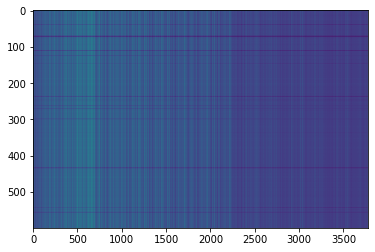

,AUC,pAUC
Source_0,0.775500,0.665789
Source_1,0.761500,0.664211
Source_2,0.825800,0.741579
Target_0,0.687200,0.670000
Target_1,0.867500,0.666842
Target_2,0.472000,0.527368
mean,0.731583,0.655965
h_mean,0.702560,0.649045


2021-05-30 02:42:29,113 - pytorch_modeler.py - INFO - epoch:234/300, train_losses:489.336751, val_AUC_hmean:0.702560, val_pAUC_hmean:0.649045, best_flag:True
2021-05-30 02:42:29,114 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.13it/s]
2021-05-30 02:42:29,859 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.69it/s]
2021-05-30 02:42:29,912 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.87it/s]
2021-05-30 02:42:29,965 - pytorch_modeler.py - INFO - epoch:235/300, train_losses:448.090663, val_AUC_hmean:0.716863, val_pAUC_hmean:0.634839, best_flag:False
2021-05-30 02:42:29,966 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.41it/s]
2021-05-30 02:42:30,586 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.27it/s]
2021-05-30 02:42:30,639 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.46it/s]


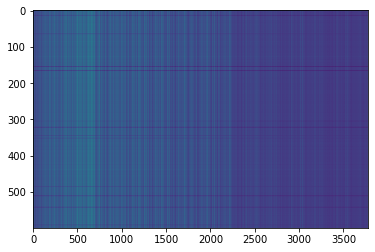

,AUC,pAUC
Source_0,0.795900,0.678947
Source_1,0.767300,0.683158
Source_2,0.839100,0.726842
Target_0,0.707800,0.673158
Target_1,0.856100,0.666842
Target_2,0.410000,0.518421
mean,0.729367,0.657895
h_mean,0.684041,0.650297


2021-05-30 02:42:32,160 - pytorch_modeler.py - INFO - epoch:236/300, train_losses:498.410113, val_AUC_hmean:0.684041, val_pAUC_hmean:0.650297, best_flag:True
2021-05-30 02:42:32,161 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.35it/s]
2021-05-30 02:42:32,855 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.58it/s]
2021-05-30 02:42:32,905 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.48it/s]
2021-05-30 02:42:32,948 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:458.085149, val_AUC_hmean:0.677298, val_pAUC_hmean:0.639350, best_flag:False
2021-05-30 02:42:32,950 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.76it/s]
2021-05-30 02:42:33,669 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.64it/s]
2021-05-30 02:42:33,720 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.48it/s]
2021-05-30 02:4

100%|██████████| 2/2 [00:00<00:00, 97.99it/s]
2021-05-30 02:42:45,553 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.69it/s]
2021-05-30 02:42:45,598 - pytorch_modeler.py - INFO - epoch:253/300, train_losses:406.262085, val_AUC_hmean:0.682126, val_pAUC_hmean:0.639289, best_flag:False
2021-05-30 02:42:45,599 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.64it/s]
2021-05-30 02:42:46,282 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.98it/s]
2021-05-30 02:42:46,334 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.09it/s]
2021-05-30 02:42:46,383 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:356.686924, val_AUC_hmean:0.684824, val_pAUC_hmean:0.649534, best_flag:False
2021-05-30 02:42:46,384 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.70it/s]
2021-05-30 02:42:47,063 - pytorch_modeler.py - INFO - valid_source
100%|█████████

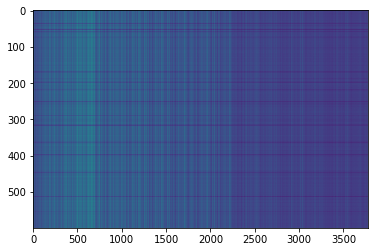

,AUC,pAUC
Source_0,0.812800,0.676842
Source_1,0.762600,0.668421
Source_2,0.840200,0.732632
Target_0,0.737100,0.685263
Target_1,0.861400,0.677368
Target_2,0.439300,0.513158
mean,0.742233,0.658947
h_mean,0.703752,0.650564


2021-05-30 02:42:55,807 - pytorch_modeler.py - INFO - epoch:264/300, train_losses:331.957247, val_AUC_hmean:0.703752, val_pAUC_hmean:0.650564, best_flag:True
2021-05-30 02:42:55,808 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.74it/s]
2021-05-30 02:42:56,486 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.74it/s]
2021-05-30 02:42:56,538 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.62it/s]
2021-05-30 02:42:56,587 - pytorch_modeler.py - INFO - epoch:265/300, train_losses:387.845371, val_AUC_hmean:0.657805, val_pAUC_hmean:0.593797, best_flag:False
2021-05-30 02:42:56,588 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.74it/s]
2021-05-30 02:42:57,266 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.72it/s]
2021-05-30 02:42:57,319 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.85it/s]
2021-05-30 02:4

100%|██████████| 2/2 [00:00<00:00, 55.96it/s]
2021-05-30 02:43:09,194 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.45it/s]
2021-05-30 02:43:09,244 - pytorch_modeler.py - INFO - epoch:281/300, train_losses:265.272119, val_AUC_hmean:0.646376, val_pAUC_hmean:0.624081, best_flag:False
2021-05-30 02:43:09,245 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.67it/s]
2021-05-30 02:43:09,926 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.33it/s]
2021-05-30 02:43:09,978 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.27it/s]
2021-05-30 02:43:10,029 - pytorch_modeler.py - INFO - epoch:282/300, train_losses:353.081436, val_AUC_hmean:0.646939, val_pAUC_hmean:0.625537, best_flag:False
2021-05-30 02:43:10,030 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.65it/s]
2021-05-30 02:43:10,711 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-05-30 02:43:21,942 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.71it/s]
2021-05-30 02:43:22,622 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.31it/s]
2021-05-30 02:43:22,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.61it/s]
2021-05-30 02:43:22,723 - pytorch_modeler.py - INFO - epoch:298/300, train_losses:191.171160, val_AUC_hmean:0.677106, val_pAUC_hmean:0.633683, best_flag:False
2021-05-30 02:43:22,725 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.68it/s]
2021-05-30 02:43:23,406 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.23it/s]
2021-05-30 02:43:23,461 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.58it/s]
2021-05-30 02:43:23,518 - pytorch_modeler.py - INFO - epoch:299/300, train_losses:193.001422, val_AUC_hmean:0.662677, val_pAUC_hmean:0.630252, best_flag:False
2021-05-30 02:

,AUC,pAUC
Source_0,0.812800,0.676842
Source_1,0.762600,0.668421
Source_2,0.840200,0.732632
Target_0,0.737100,0.685263
Target_1,0.861400,0.677368
Target_2,0.439300,0.513158
mean,0.742233,0.658947
h_mean,0.703752,0.650564


2021-05-30 02:43:24,308 - 00_train.py - INFO - TARGET MACHINE_TYPE: valve
2021-05-30 02:43:24,308 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 02:43:24,310 - 00_train.py - INFO - TRAINING


elapsed time: 258.238881111 [sec]


2021-05-30 02:43:24,721 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 16.56it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 17.73it/s]
2021-05-30 02:43:25,401 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.04it/s]
2021-05-30 02:43:25,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.36it/s]


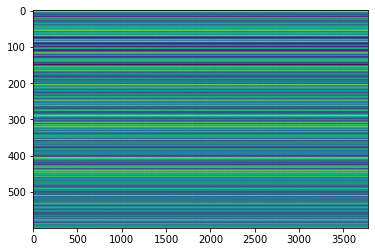

,AUC,pAUC
Source_0,0.564700,0.553158
Source_1,0.604100,0.553684
Source_2,0.655000,0.565263
Target_0,0.534000,0.596316
Target_1,0.683600,0.570526
Target_2,0.639300,0.496316
mean,0.613450,0.555877
h_mean,0.608974,0.554142


2021-05-30 02:43:27,003 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:135897.698568, val_AUC_hmean:0.608974, val_pAUC_hmean:0.554142, best_flag:True
2021-05-30 02:43:27,004 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.46it/s]
2021-05-30 02:43:27,693 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.44it/s]
2021-05-30 02:43:27,746 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.77it/s]


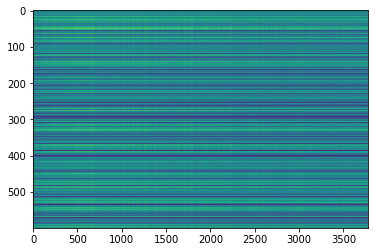

,AUC,pAUC
Source_0,0.603100,0.593158
Source_1,0.638300,0.552105
Source_2,0.651900,0.581579
Target_0,0.580100,0.614737
Target_1,0.723600,0.599474
Target_2,0.622500,0.493684
mean,0.636583,0.572456
h_mean,0.633514,0.569421


2021-05-30 02:43:29,327 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:87829.431641, val_AUC_hmean:0.633514, val_pAUC_hmean:0.569421, best_flag:True
2021-05-30 02:43:29,328 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.19it/s]
2021-05-30 02:43:29,990 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.30it/s]
2021-05-30 02:43:30,040 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.54it/s]
2021-05-30 02:43:30,092 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:75958.988932, val_AUC_hmean:0.632574, val_pAUC_hmean:0.567238, best_flag:False
2021-05-30 02:43:30,093 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.13it/s]
2021-05-30 02:43:30,757 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.16it/s]
2021-05-30 02:43:30,817 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.60it/s]


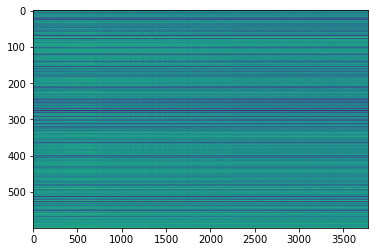

,AUC,pAUC
Source_0,0.617500,0.606316
Source_1,0.666100,0.571053
Source_2,0.720200,0.620000
Target_0,0.577800,0.634737
Target_1,0.705300,0.541579
Target_2,0.641500,0.530000
mean,0.654733,0.583947
h_mean,0.650999,0.581279


2021-05-30 02:43:32,398 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:69328.280599, val_AUC_hmean:0.650999, val_pAUC_hmean:0.581279, best_flag:True
2021-05-30 02:43:32,398 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.26it/s]
2021-05-30 02:43:33,057 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.54it/s]
2021-05-30 02:43:33,106 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.85it/s]
2021-05-30 02:43:33,157 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:65456.175456, val_AUC_hmean:0.665974, val_pAUC_hmean:0.559478, best_flag:False
2021-05-30 02:43:33,158 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.89it/s]
2021-05-30 02:43:33,871 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.01it/s]
2021-05-30 02:43:33,926 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.25it/s]
2021-05-30 02:4

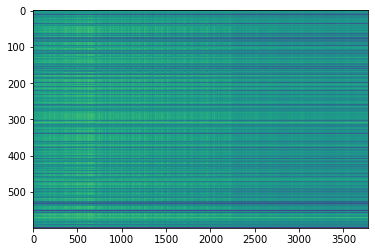

,AUC,pAUC
Source_0,0.724900,0.618947
Source_1,0.711200,0.604737
Source_2,0.778200,0.680000
Target_0,0.667800,0.665263
Target_1,0.705000,0.540526
Target_2,0.634900,0.552105
mean,0.703667,0.610263
h_mean,0.700809,0.605797


2021-05-30 02:43:37,329 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:56213.660482, val_AUC_hmean:0.700809, val_pAUC_hmean:0.605797, best_flag:True
2021-05-30 02:43:37,330 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.03it/s]
2021-05-30 02:43:37,997 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.95it/s]
2021-05-30 02:43:38,045 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.59it/s]
2021-05-30 02:43:38,101 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:53458.879557, val_AUC_hmean:0.681303, val_pAUC_hmean:0.570337, best_flag:False
2021-05-30 02:43:38,102 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.81it/s]
2021-05-30 02:43:38,782 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.48it/s]
2021-05-30 02:43:38,836 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.51it/s]
2021-05-30 02:4

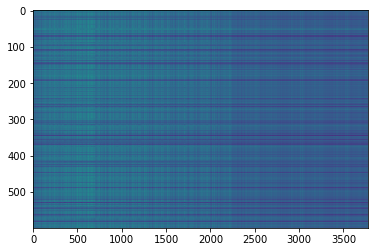

,AUC,pAUC
Source_0,0.802300,0.663684
Source_1,0.704900,0.629474
Source_2,0.816200,0.731579
Target_0,0.714000,0.665789
Target_1,0.689300,0.514737
Target_2,0.533700,0.512632
mean,0.710067,0.619649
h_mean,0.696438,0.608661


2021-05-30 02:43:45,045 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:41182.251953, val_AUC_hmean:0.696438, val_pAUC_hmean:0.608661, best_flag:True
2021-05-30 02:43:45,046 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.93it/s]
2021-05-30 02:43:45,757 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.83it/s]
2021-05-30 02:43:45,795 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.43it/s]
2021-05-30 02:43:45,853 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:40049.914062, val_AUC_hmean:0.660101, val_pAUC_hmean:0.600747, best_flag:False
2021-05-30 02:43:45,854 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.44it/s]
2021-05-30 02:43:46,546 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.70it/s]
2021-05-30 02:43:46,588 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.13it/s]
2021-05-30 02

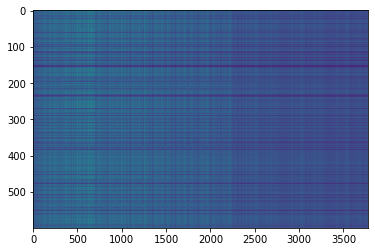

,AUC,pAUC
Source_0,0.737400,0.655263
Source_1,0.692600,0.627368
Source_2,0.790300,0.731053
Target_0,0.713000,0.671053
Target_1,0.723300,0.548947
Target_2,0.438700,0.501053
mean,0.682550,0.622456
h_mean,0.657186,0.612519


2021-05-30 02:43:52,082 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:33633.374023, val_AUC_hmean:0.657186, val_pAUC_hmean:0.612519, best_flag:True
2021-05-30 02:43:52,083 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.89it/s]
2021-05-30 02:43:52,755 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.71it/s]
2021-05-30 02:43:52,808 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.11it/s]
2021-05-30 02:43:52,859 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:32773.033854, val_AUC_hmean:0.647078, val_pAUC_hmean:0.609956, best_flag:False
2021-05-30 02:43:52,860 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.16it/s]
2021-05-30 02:43:53,605 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.40it/s]
2021-05-30 02:43:53,658 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 90.64it/s]


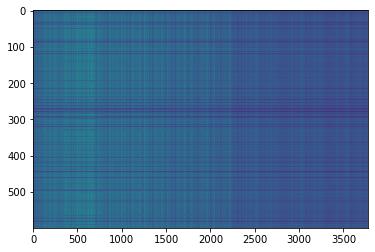

,AUC,pAUC
Source_0,0.733700,0.655263
Source_1,0.662600,0.624211
Source_2,0.784100,0.727895
Target_0,0.661700,0.664211
Target_1,0.725400,0.560526
Target_2,0.467800,0.514211
mean,0.672550,0.624386
h_mean,0.653952,0.616253


2021-05-30 02:43:55,309 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:31902.848958, val_AUC_hmean:0.653952, val_pAUC_hmean:0.616253, best_flag:True
2021-05-30 02:43:55,310 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.26it/s]
2021-05-30 02:43:56,013 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.04it/s]
2021-05-30 02:43:56,066 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.53it/s]
2021-05-30 02:43:56,107 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:31084.381185, val_AUC_hmean:0.652662, val_pAUC_hmean:0.610854, best_flag:False
2021-05-30 02:43:56,108 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.29it/s]
2021-05-30 02:43:56,804 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.42it/s]
2021-05-30 02:43:56,856 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.63it/s]


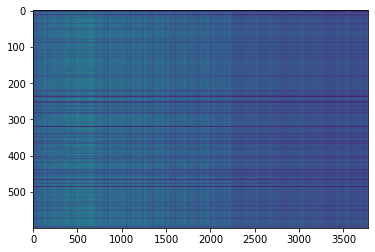

,AUC,pAUC
Source_0,0.730200,0.647368
Source_1,0.669000,0.635263
Source_2,0.845100,0.745263
Target_0,0.646700,0.661579
Target_1,0.731400,0.562105
Target_2,0.551700,0.511579
mean,0.695683,0.627193
h_mean,0.683864,0.618176


2021-05-30 02:43:58,396 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:30389.051595, val_AUC_hmean:0.683864, val_pAUC_hmean:0.618176, best_flag:True
2021-05-30 02:43:58,397 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.98it/s]
2021-05-30 02:43:59,067 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.22it/s]
2021-05-30 02:43:59,120 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.99it/s]
2021-05-30 02:43:59,172 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:29596.040527, val_AUC_hmean:0.651826, val_pAUC_hmean:0.616902, best_flag:False
2021-05-30 02:43:59,173 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.12it/s]
2021-05-30 02:43:59,838 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.11it/s]
2021-05-30 02:43:59,891 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.82it/s]
2021-05-30 02

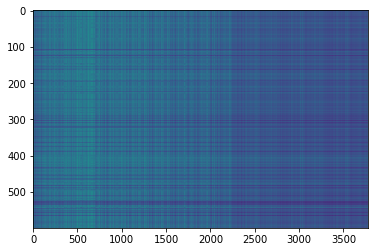

,AUC,pAUC
Source_0,0.808200,0.674211
Source_1,0.694600,0.603684
Source_2,0.811600,0.756316
Target_0,0.718500,0.664737
Target_1,0.761900,0.568947
Target_2,0.492200,0.511053
mean,0.714500,0.629825
h_mean,0.694033,0.619794


2021-05-30 02:44:04,592 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:26430.885742, val_AUC_hmean:0.694033, val_pAUC_hmean:0.619794, best_flag:True
2021-05-30 02:44:04,593 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 02:44:05,263 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.62it/s]
2021-05-30 02:44:05,314 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.75it/s]
2021-05-30 02:44:05,363 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:25921.322266, val_AUC_hmean:0.679361, val_pAUC_hmean:0.611279, best_flag:False
2021-05-30 02:44:05,364 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.14it/s]
2021-05-30 02:44:06,028 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.78it/s]
2021-05-30 02:44:06,088 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.17it/s]
2021-05-30 02

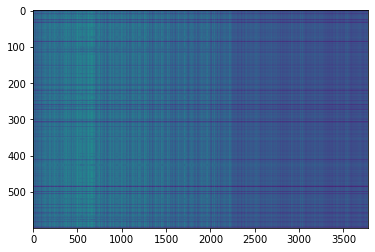

,AUC,pAUC
Source_0,0.780600,0.661579
Source_1,0.712500,0.624211
Source_2,0.782700,0.752632
Target_0,0.702100,0.667368
Target_1,0.778200,0.561579
Target_2,0.431800,0.513158
mean,0.697983,0.630088
h_mean,0.667601,0.620472


2021-05-30 02:44:09,249 - pytorch_modeler.py - INFO - epoch:37/300, train_losses:24308.452311, val_AUC_hmean:0.667601, val_pAUC_hmean:0.620472, best_flag:True
2021-05-30 02:44:09,250 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.50it/s]
2021-05-30 02:44:09,938 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.88it/s]
2021-05-30 02:44:09,992 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.84it/s]
2021-05-30 02:44:10,045 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:23592.328613, val_AUC_hmean:0.645425, val_pAUC_hmean:0.611064, best_flag:False
2021-05-30 02:44:10,046 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.43it/s]
2021-05-30 02:44:10,778 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.26it/s]
2021-05-30 02:44:10,831 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.19it/s]
2021-05-30 02

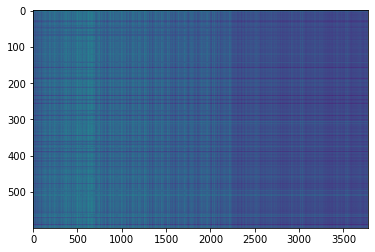

,AUC,pAUC
Source_0,0.802700,0.685789
Source_1,0.738900,0.663684
Source_2,0.826700,0.734211
Target_0,0.724800,0.678421
Target_1,0.785000,0.555789
Target_2,0.417700,0.512105
mean,0.715967,0.638333
h_mean,0.677474,0.628082


2021-05-30 02:44:15,601 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:21022.367676, val_AUC_hmean:0.677474, val_pAUC_hmean:0.628082, best_flag:True
2021-05-30 02:44:15,602 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.06it/s]
2021-05-30 02:44:16,268 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.26it/s]
2021-05-30 02:44:16,321 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.08it/s]
2021-05-30 02:44:16,370 - pytorch_modeler.py - INFO - epoch:44/300, train_losses:20571.853190, val_AUC_hmean:0.697159, val_pAUC_hmean:0.623216, best_flag:False
2021-05-30 02:44:16,371 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.00it/s]
2021-05-30 02:44:17,040 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.14it/s]
2021-05-30 02:44:17,091 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.19it/s]


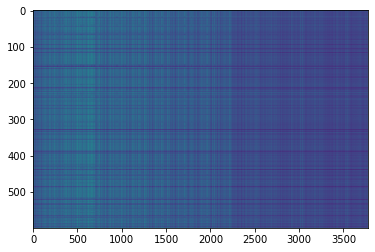

,AUC,pAUC
Source_0,0.827200,0.670526
Source_1,0.750500,0.676316
Source_2,0.837700,0.731579
Target_0,0.687000,0.652632
Target_1,0.809800,0.588947
Target_2,0.412600,0.508421
mean,0.720800,0.638070
h_mean,0.678026,0.629330


2021-05-30 02:44:18,764 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:20148.159668, val_AUC_hmean:0.678026, val_pAUC_hmean:0.629330, best_flag:True
2021-05-30 02:44:18,765 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.78it/s]
2021-05-30 02:44:19,442 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.17it/s]
2021-05-30 02:44:19,496 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.38it/s]
2021-05-30 02:44:19,547 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:19615.110840, val_AUC_hmean:0.683211, val_pAUC_hmean:0.620006, best_flag:False
2021-05-30 02:44:19,548 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.91it/s]
2021-05-30 02:44:20,220 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.10it/s]
2021-05-30 02:44:20,269 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.10it/s]
2021-05-30 02

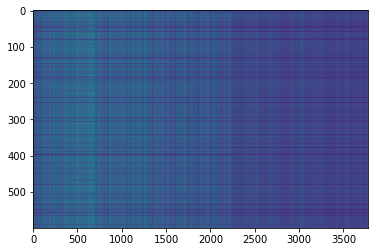

,AUC,pAUC
Source_0,0.781300,0.668421
Source_1,0.757900,0.686316
Source_2,0.833900,0.734737
Target_0,0.677300,0.657368
Target_1,0.815600,0.591579
Target_2,0.437900,0.517895
mean,0.717317,0.642719
h_mean,0.683005,0.634474


2021-05-30 02:44:22,674 - pytorch_modeler.py - INFO - epoch:48/300, train_losses:18813.568359, val_AUC_hmean:0.683005, val_pAUC_hmean:0.634474, best_flag:True
2021-05-30 02:44:22,675 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.20it/s]
2021-05-30 02:44:23,375 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.90it/s]
2021-05-30 02:44:23,429 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.69it/s]
2021-05-30 02:44:23,482 - pytorch_modeler.py - INFO - epoch:49/300, train_losses:18462.687337, val_AUC_hmean:0.691913, val_pAUC_hmean:0.621923, best_flag:False
2021-05-30 02:44:23,483 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.92it/s]
2021-05-30 02:44:24,154 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.55it/s]
2021-05-30 02:44:24,207 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.12it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 54.38it/s]
2021-05-30 02:44:35,857 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.80it/s]
2021-05-30 02:44:35,908 - pytorch_modeler.py - INFO - epoch:65/300, train_losses:13310.989909, val_AUC_hmean:0.677664, val_pAUC_hmean:0.618122, best_flag:False
2021-05-30 02:44:35,909 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 02:44:36,579 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.55it/s]
2021-05-30 02:44:36,634 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.10it/s]
2021-05-30 02:44:36,686 - pytorch_modeler.py - INFO - epoch:66/300, train_losses:13025.378825, val_AUC_hmean:0.688994, val_pAUC_hmean:0.619588, best_flag:False
2021-05-30 02:44:36,687 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.05it/s]
2021-05-30 02:44:37,354 - pytorch_modeler.py - INFO - valid_source
100%|███████

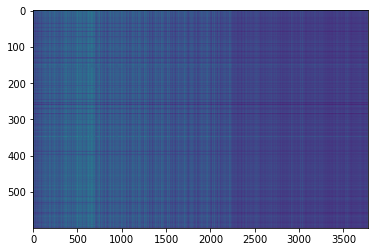

,AUC,pAUC
Source_0,0.798500,0.685263
Source_1,0.740600,0.660000
Source_2,0.835700,0.724737
Target_0,0.702700,0.674211
Target_1,0.833300,0.612632
Target_2,0.434300,0.517895
mean,0.724183,0.645789
h_mean,0.687688,0.638252


2021-05-30 02:44:49,100 - pytorch_modeler.py - INFO - epoch:80/300, train_losses:9772.540283, val_AUC_hmean:0.687688, val_pAUC_hmean:0.638252, best_flag:True
2021-05-30 02:44:49,101 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.11it/s]
2021-05-30 02:44:49,766 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.56it/s]
2021-05-30 02:44:49,823 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.94it/s]
2021-05-30 02:44:49,875 - pytorch_modeler.py - INFO - epoch:81/300, train_losses:9492.778646, val_AUC_hmean:0.685277, val_pAUC_hmean:0.624908, best_flag:False
2021-05-30 02:44:49,876 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.01it/s]
2021-05-30 02:44:50,544 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.07it/s]
2021-05-30 02:44:50,597 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.04it/s]
2021-05-30 02:4

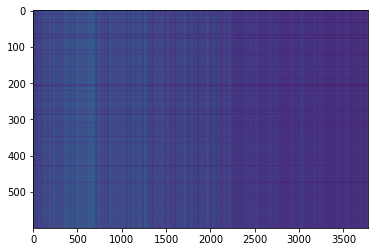

,AUC,pAUC
Source_0,0.793000,0.688947
Source_1,0.749800,0.673158
Source_2,0.835000,0.736316
Target_0,0.673300,0.672632
Target_1,0.823200,0.618421
Target_2,0.514600,0.528421
mean,0.731483,0.652982
h_mean,0.711273,0.645766


2021-05-30 02:44:56,036 - pytorch_modeler.py - INFO - epoch:87/300, train_losses:8498.455404, val_AUC_hmean:0.711273, val_pAUC_hmean:0.645766, best_flag:True
2021-05-30 02:44:56,037 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.30it/s]
2021-05-30 02:44:56,732 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.34it/s]
2021-05-30 02:44:56,769 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.73it/s]
2021-05-30 02:44:56,811 - pytorch_modeler.py - INFO - epoch:88/300, train_losses:8296.474447, val_AUC_hmean:0.652894, val_pAUC_hmean:0.629084, best_flag:False
2021-05-30 02:44:56,812 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.69it/s]
2021-05-30 02:44:57,533 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.19it/s]
2021-05-30 02:44:57,572 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.73it/s]
2021-05-30 02:4

100%|██████████| 2/2 [00:00<00:00, 85.95it/s]
2021-05-30 02:45:09,446 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.38it/s]
2021-05-30 02:45:09,488 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:5901.728678, val_AUC_hmean:0.654765, val_pAUC_hmean:0.629417, best_flag:False
2021-05-30 02:45:09,489 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.00it/s]
2021-05-30 02:45:10,197 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.25it/s]
2021-05-30 02:45:10,240 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.42it/s]
2021-05-30 02:45:10,284 - pytorch_modeler.py - INFO - epoch:105/300, train_losses:5794.568604, val_AUC_hmean:0.671950, val_pAUC_hmean:0.623475, best_flag:False
2021-05-30 02:45:10,285 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.05it/s]
2021-05-30 02:45:10,991 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 02:45:22,206 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.99it/s]
2021-05-30 02:45:22,915 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.89it/s]
2021-05-30 02:45:22,962 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.01it/s]
2021-05-30 02:45:23,019 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:5065.686523, val_AUC_hmean:0.648882, val_pAUC_hmean:0.581414, best_flag:False
2021-05-30 02:45:23,020 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.51it/s]
2021-05-30 02:45:23,707 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.11it/s]
2021-05-30 02:45:23,749 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.71it/s]
2021-05-30 02:45:23,805 - pytorch_modeler.py - INFO - epoch:122/300, train_losses:4923.916138, val_AUC_hmean:0.634245, val_pAUC_hmean:0.590587, best_flag:False
2021-05-30 0

100%|██████████| 2/2 [00:00<00:00, 49.35it/s]
2021-05-30 02:45:35,757 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:3135.530741, val_AUC_hmean:0.638641, val_pAUC_hmean:0.623298, best_flag:False
2021-05-30 02:45:35,758 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.34it/s]
2021-05-30 02:45:36,453 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.88it/s]
2021-05-30 02:45:36,497 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.06it/s]
2021-05-30 02:45:36,556 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:3015.619690, val_AUC_hmean:0.651255, val_pAUC_hmean:0.623568, best_flag:False
2021-05-30 02:45:36,557 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.47it/s]
2021-05-30 02:45:37,247 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.99it/s]
2021-05-30 02:45:37,288 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 17.64it/s]
2021-05-30 02:45:46,775 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.33it/s]
2021-05-30 02:45:46,817 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.26it/s]
2021-05-30 02:45:46,858 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:2170.525513, val_AUC_hmean:0.666395, val_pAUC_hmean:0.625356, best_flag:False
2021-05-30 02:45:46,859 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 23.16it/s]
2021-05-30 02:45:47,379 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.46it/s]
2021-05-30 02:45:47,416 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.34it/s]
2021-05-30 02:45:47,461 - pytorch_modeler.py - INFO - epoch:155/300, train_losses:2124.890188, val_AUC_hmean:0.673902, val_pAUC_hmean:0.634540, best_flag:False
2021-05-30 02:45:47,462 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 02:45:56,824 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.07it/s]
2021-05-30 02:45:57,490 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.89it/s]
2021-05-30 02:45:57,543 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.66it/s]
2021-05-30 02:45:57,592 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:1506.291840, val_AUC_hmean:0.644983, val_pAUC_hmean:0.633483, best_flag:False
2021-05-30 02:45:57,593 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.24it/s]
2021-05-30 02:45:58,220 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.70it/s]
2021-05-30 02:45:58,262 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.15it/s]
2021-05-30 02:45:58,321 - pytorch_modeler.py - INFO - epoch:172/300, train_losses:1490.819631, val_AUC_hmean:0.703985, val_pAUC_hmean:0.632763, best_flag:False
2021-05-30 0

100%|██████████| 2/2 [00:00<00:00, 100.87it/s]
2021-05-30 02:46:07,312 - pytorch_modeler.py - INFO - epoch:187/300, train_losses:1108.646103, val_AUC_hmean:0.653262, val_pAUC_hmean:0.623929, best_flag:False
2021-05-30 02:46:07,313 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.35it/s]
2021-05-30 02:46:07,969 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.26it/s]
2021-05-30 02:46:08,019 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.26it/s]
2021-05-30 02:46:08,070 - pytorch_modeler.py - INFO - epoch:188/300, train_losses:1082.202326, val_AUC_hmean:0.624140, val_pAUC_hmean:0.630942, best_flag:False
2021-05-30 02:46:08,072 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.11it/s]
2021-05-30 02:46:08,737 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.73it/s]
2021-05-30 02:46:08,789 - pytorch_modeler.py - INFO - valid_target
100%|██████

100%|██████████| 12/12 [00:00<00:00, 26.51it/s]
2021-05-30 02:46:18,584 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.75it/s]
2021-05-30 02:46:18,620 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.31it/s]
2021-05-30 02:46:18,661 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:792.462001, val_AUC_hmean:0.656378, val_pAUC_hmean:0.628445, best_flag:False
2021-05-30 02:46:18,663 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.08it/s]
2021-05-30 02:46:19,263 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.15it/s]
2021-05-30 02:46:19,316 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.20it/s]
2021-05-30 02:46:19,366 - pytorch_modeler.py - INFO - epoch:205/300, train_losses:747.709773, val_AUC_hmean:0.667581, val_pAUC_hmean:0.633062, best_flag:False
2021-05-30 02:46:19,367 - pytorch_modeler.py - INFO - train
100%|█████████

2021-05-30 02:46:30,500 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.79it/s]
2021-05-30 02:46:30,950 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.58it/s]
2021-05-30 02:46:30,987 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.03it/s]
2021-05-30 02:46:31,037 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:640.784841, val_AUC_hmean:0.678307, val_pAUC_hmean:0.610981, best_flag:False
2021-05-30 02:46:31,038 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.78it/s]
2021-05-30 02:46:31,488 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.99it/s]
2021-05-30 02:46:31,527 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.20it/s]
2021-05-30 02:46:31,578 - pytorch_modeler.py - INFO - epoch:222/300, train_losses:3837.175959, val_AUC_hmean:0.635938, val_pAUC_hmean:0.580131, best_flag:False
2021-05-30

100%|██████████| 2/2 [00:00<00:00, 63.23it/s]
2021-05-30 02:46:42,411 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:469.653145, val_AUC_hmean:0.652618, val_pAUC_hmean:0.619385, best_flag:False
2021-05-30 02:46:42,412 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.99it/s]
2021-05-30 02:46:43,081 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.13it/s]
2021-05-30 02:46:43,134 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.08it/s]
2021-05-30 02:46:43,185 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:460.230815, val_AUC_hmean:0.659680, val_pAUC_hmean:0.625227, best_flag:False
2021-05-30 02:46:43,186 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.98it/s]
2021-05-30 02:46:43,939 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.57it/s]
2021-05-30 02:46:43,992 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 12/12 [00:00<00:00, 18.11it/s]
2021-05-30 02:46:54,866 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.31it/s]
2021-05-30 02:46:54,925 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.39it/s]
2021-05-30 02:46:54,971 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:377.908946, val_AUC_hmean:0.678365, val_pAUC_hmean:0.633634, best_flag:False
2021-05-30 02:46:54,972 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.06it/s]
2021-05-30 02:46:55,639 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.92it/s]
2021-05-30 02:46:55,691 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.17it/s]
2021-05-30 02:46:55,742 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:327.980492, val_AUC_hmean:0.683489, val_pAUC_hmean:0.630865, best_flag:False
2021-05-30 02:46:55,743 - pytorch_modeler.py - INFO - train
100%|█████████

2021-05-30 02:47:07,574 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.67it/s]
2021-05-30 02:47:08,254 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.13it/s]
2021-05-30 02:47:08,305 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.00it/s]
2021-05-30 02:47:08,355 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:293.472037, val_AUC_hmean:0.649736, val_pAUC_hmean:0.633883, best_flag:False
2021-05-30 02:47:08,356 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.65it/s]
2021-05-30 02:47:09,038 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.01it/s]
2021-05-30 02:47:09,091 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.11it/s]
2021-05-30 02:47:09,142 - pytorch_modeler.py - INFO - epoch:272/300, train_losses:307.237649, val_AUC_hmean:0.662091, val_pAUC_hmean:0.629819, best_flag:False
2021-05-30 02:

100%|██████████| 2/2 [00:00<00:00, 66.82it/s]
2021-05-30 02:47:20,905 - pytorch_modeler.py - INFO - epoch:287/300, train_losses:247.742195, val_AUC_hmean:0.675867, val_pAUC_hmean:0.619581, best_flag:False
2021-05-30 02:47:20,906 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.72it/s]
2021-05-30 02:47:21,585 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.85it/s]
2021-05-30 02:47:21,641 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.70it/s]
2021-05-30 02:47:21,690 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:262.594934, val_AUC_hmean:0.647569, val_pAUC_hmean:0.632445, best_flag:False
2021-05-30 02:47:21,691 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.70it/s]
2021-05-30 02:47:22,372 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.04it/s]
2021-05-30 02:47:22,423 - pytorch_modeler.py - INFO - valid_target
100%|█████████

,AUC,pAUC
Source_0,0.793000,0.688947
Source_1,0.749800,0.673158
Source_2,0.835000,0.736316
Target_0,0.673300,0.672632
Target_1,0.823200,0.618421
Target_2,0.514600,0.528421
mean,0.731483,0.652982
h_mean,0.711273,0.645766


2021-05-30 02:47:30,385 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyTrain
2021-05-30 02:47:30,386 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 02:47:30,409 - 00_train.py - INFO - TRAINING


elapsed time: 246.075810671 [sec]


2021-05-30 02:47:30,809 - pytorch_modeler.py - INFO - train
 25%|██▌       | 3/12 [00:00<00:00, 24.91it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 26.50it/s]
2021-05-30 02:47:31,264 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 96.14it/s]
2021-05-30 02:47:31,303 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.88it/s]


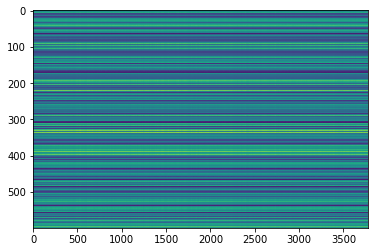

,AUC,pAUC
Source_0,0.563800,0.544211
Source_1,0.527400,0.505789
Source_2,0.615300,0.584737
Target_0,0.553700,0.546316
Target_1,0.628500,0.564211
Target_2,0.654500,0.516316
mean,0.590533,0.543596
h_mean,0.587084,0.542278


2021-05-30 02:47:33,127 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:134727.816406, val_AUC_hmean:0.587084, val_pAUC_hmean:0.542278, best_flag:True
2021-05-30 02:47:33,129 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.59it/s]
2021-05-30 02:47:33,814 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.72it/s]
2021-05-30 02:47:33,864 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.57it/s]


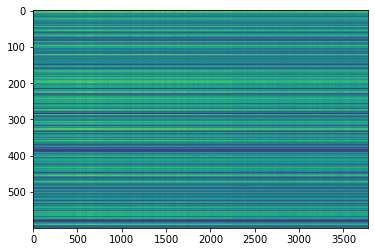

,AUC,pAUC
Source_0,0.582000,0.552632
Source_1,0.632300,0.559474
Source_2,0.653500,0.538947
Target_0,0.550700,0.601053
Target_1,0.707500,0.591579
Target_2,0.641300,0.510526
mean,0.627883,0.559035
h_mean,0.623792,0.557347


2021-05-30 02:47:35,525 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:86098.138672, val_AUC_hmean:0.623792, val_pAUC_hmean:0.557347, best_flag:True
2021-05-30 02:47:35,526 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.39it/s]
2021-05-30 02:47:36,220 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.97it/s]
2021-05-30 02:47:36,264 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.93it/s]


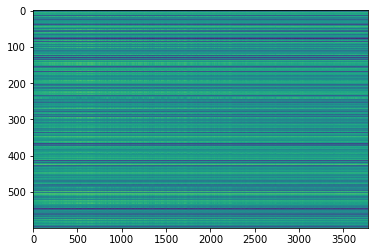

,AUC,pAUC
Source_0,0.618200,0.558421
Source_1,0.639200,0.559474
Source_2,0.716300,0.594211
Target_0,0.585900,0.592105
Target_1,0.674900,0.576316
Target_2,0.627700,0.518947
mean,0.643700,0.566579
h_mean,0.641045,0.565393


2021-05-30 02:47:38,163 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:74211.310547, val_AUC_hmean:0.641045, val_pAUC_hmean:0.565393, best_flag:True
2021-05-30 02:47:38,164 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.66it/s]
2021-05-30 02:47:38,846 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.42it/s]
2021-05-30 02:47:38,899 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.02it/s]
2021-05-30 02:47:38,960 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:68142.639974, val_AUC_hmean:0.628061, val_pAUC_hmean:0.552813, best_flag:False
2021-05-30 02:47:38,961 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.88it/s]
2021-05-30 02:47:39,634 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.71it/s]
2021-05-30 02:47:39,687 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.83it/s]


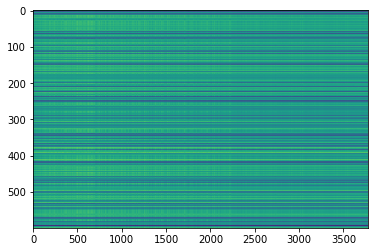

,AUC,pAUC
Source_0,0.687000,0.590000
Source_1,0.686100,0.578421
Source_2,0.702400,0.599474
Target_0,0.641900,0.627895
Target_1,0.672400,0.516842
Target_2,0.596800,0.534211
mean,0.664433,0.574474
h_mean,0.662435,0.571905


2021-05-30 02:47:41,211 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:64562.079102, val_AUC_hmean:0.662435, val_pAUC_hmean:0.571905, best_flag:True
2021-05-30 02:47:41,212 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.61it/s]
2021-05-30 02:47:41,895 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.03it/s]
2021-05-30 02:47:41,949 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.55it/s]
2021-05-30 02:47:42,008 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:61060.233073, val_AUC_hmean:0.644435, val_pAUC_hmean:0.555807, best_flag:False
2021-05-30 02:47:42,009 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.53it/s]
2021-05-30 02:47:42,696 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.61it/s]
2021-05-30 02:47:42,753 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.83it/s]
2021-05-30 02:4

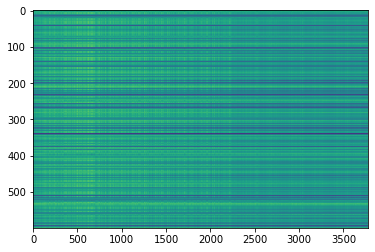

,AUC,pAUC
Source_0,0.699900,0.597895
Source_1,0.696300,0.594737
Source_2,0.788900,0.655789
Target_0,0.658400,0.641053
Target_1,0.684500,0.491579
Target_2,0.626500,0.522105
mean,0.692417,0.583860
h_mean,0.688986,0.577570


2021-05-30 02:47:45,119 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:55262.512695, val_AUC_hmean:0.688986, val_pAUC_hmean:0.577570, best_flag:True
2021-05-30 02:47:45,121 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.63it/s]
2021-05-30 02:47:45,805 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.60it/s]
2021-05-30 02:47:45,859 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.94it/s]
2021-05-30 02:47:45,915 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:53528.116536, val_AUC_hmean:0.686544, val_pAUC_hmean:0.571537, best_flag:False
2021-05-30 02:47:45,916 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.74it/s]
2021-05-30 02:47:46,595 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.16it/s]
2021-05-30 02:47:46,647 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.47it/s]


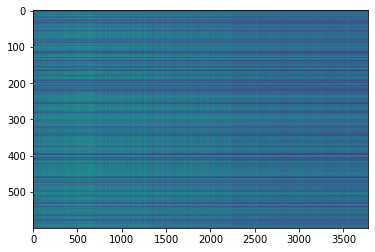

,AUC,pAUC
Source_0,0.772500,0.628421
Source_1,0.650700,0.576842
Source_2,0.814600,0.718421
Target_0,0.678500,0.642105
Target_1,0.688900,0.506842
Target_2,0.599400,0.524211
mean,0.700767,0.599474
h_mean,0.693428,0.590853


2021-05-30 02:47:48,257 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:51314.087240, val_AUC_hmean:0.693428, val_pAUC_hmean:0.590853, best_flag:True
2021-05-30 02:47:48,258 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.69it/s]
2021-05-30 02:47:48,938 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.78it/s]
2021-05-30 02:47:48,995 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.05it/s]
2021-05-30 02:47:49,046 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:49238.889974, val_AUC_hmean:0.656328, val_pAUC_hmean:0.573622, best_flag:False
2021-05-30 02:47:49,047 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.05it/s]
2021-05-30 02:47:49,714 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.92it/s]
2021-05-30 02:47:49,769 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.47it/s]
2021-05-30 02

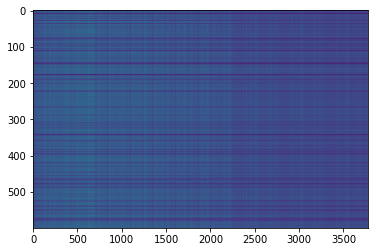

,AUC,pAUC
Source_0,0.781700,0.628421
Source_1,0.689300,0.613158
Source_2,0.841800,0.742632
Target_0,0.730900,0.658947
Target_1,0.684100,0.500000
Target_2,0.496400,0.506316
mean,0.704033,0.608246
h_mean,0.684744,0.596340


2021-05-30 02:47:55,412 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:40333.540690, val_AUC_hmean:0.684744, val_pAUC_hmean:0.596340, best_flag:True
2021-05-30 02:47:55,413 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.13it/s]
2021-05-30 02:47:56,115 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.71it/s]
2021-05-30 02:47:56,161 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.10it/s]
2021-05-30 02:47:56,206 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:39570.827148, val_AUC_hmean:0.682189, val_pAUC_hmean:0.592069, best_flag:False
2021-05-30 02:47:56,207 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.31it/s]
2021-05-30 02:47:56,903 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.39it/s]
2021-05-30 02:47:56,955 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.74it/s]
2021-05-30 02

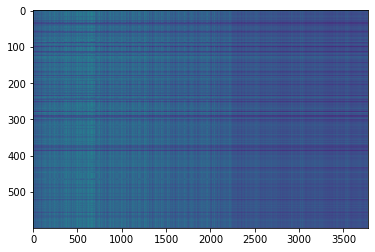

,AUC,pAUC
Source_0,0.716400,0.622632
Source_1,0.719600,0.649474
Source_2,0.831000,0.736842
Target_0,0.664200,0.648421
Target_1,0.730300,0.535263
Target_2,0.496000,0.520000
mean,0.692917,0.618772
h_mean,0.675683,0.609975


2021-05-30 02:48:01,676 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:34260.265951, val_AUC_hmean:0.675683, val_pAUC_hmean:0.609975, best_flag:True
2021-05-30 02:48:01,677 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.78it/s]
2021-05-30 02:48:02,354 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.68it/s]
2021-05-30 02:48:02,403 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.70it/s]
2021-05-30 02:48:02,453 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:33942.961263, val_AUC_hmean:0.663230, val_pAUC_hmean:0.588625, best_flag:False
2021-05-30 02:48:02,454 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.06it/s]
2021-05-30 02:48:03,121 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.50it/s]
2021-05-30 02:48:03,174 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.77it/s]
2021-05-30 02

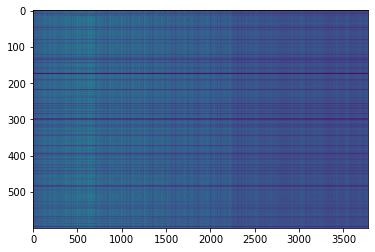

,AUC,pAUC
Source_0,0.753300,0.642105
Source_1,0.789800,0.684737
Source_2,0.753400,0.717368
Target_0,0.767900,0.680526
Target_1,0.757300,0.539474
Target_2,0.480900,0.515789
mean,0.717100,0.630000
h_mean,0.695804,0.620241


2021-05-30 02:48:05,502 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:31961.022461, val_AUC_hmean:0.695804, val_pAUC_hmean:0.620241, best_flag:True
2021-05-30 02:48:05,503 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.65it/s]
2021-05-30 02:48:06,186 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.67it/s]
2021-05-30 02:48:06,235 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.24it/s]
2021-05-30 02:48:06,287 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:31145.683757, val_AUC_hmean:0.686111, val_pAUC_hmean:0.609436, best_flag:False
2021-05-30 02:48:06,288 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.12it/s]
2021-05-30 02:48:06,953 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.74it/s]
2021-05-30 02:48:07,008 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.04it/s]
2021-05-30 02

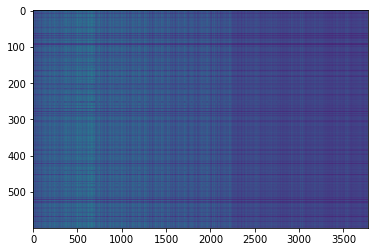

,AUC,pAUC
Source_0,0.783000,0.644211
Source_1,0.734900,0.658947
Source_2,0.831600,0.740526
Target_0,0.714200,0.666316
Target_1,0.791400,0.574737
Target_2,0.465500,0.512105
mean,0.720100,0.632807
h_mean,0.693453,0.624110


2021-05-30 02:48:16,387 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:23904.898112, val_AUC_hmean:0.693453, val_pAUC_hmean:0.624110, best_flag:True
2021-05-30 02:48:16,388 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.73it/s]
2021-05-30 02:48:17,067 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.06it/s]
2021-05-30 02:48:17,121 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.96it/s]
2021-05-30 02:48:17,171 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:23388.452474, val_AUC_hmean:0.676924, val_pAUC_hmean:0.614369, best_flag:False
2021-05-30 02:48:17,172 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.11it/s]
2021-05-30 02:48:17,836 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.87it/s]
2021-05-30 02:48:17,890 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.82it/s]
2021-05-30 02

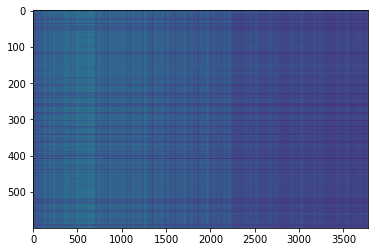

,AUC,pAUC
Source_0,0.733400,0.639474
Source_1,0.730500,0.656316
Source_2,0.843000,0.733684
Target_0,0.680800,0.666842
Target_1,0.812900,0.596842
Target_2,0.541900,0.512105
mean,0.723750,0.634211
h_mean,0.708963,0.626420


2021-05-30 02:48:23,287 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:20541.104329, val_AUC_hmean:0.708963, val_pAUC_hmean:0.626420, best_flag:True
2021-05-30 02:48:23,288 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.12it/s]
2021-05-30 02:48:23,952 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.99it/s]
2021-05-30 02:48:24,006 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.95it/s]
2021-05-30 02:48:24,058 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:20170.875000, val_AUC_hmean:0.658346, val_pAUC_hmean:0.613195, best_flag:False
2021-05-30 02:48:24,059 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.15it/s]
2021-05-30 02:48:24,723 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.85it/s]
2021-05-30 02:48:24,776 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.59it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 104.77it/s]
2021-05-30 02:48:36,393 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.24it/s]
2021-05-30 02:48:36,431 - pytorch_modeler.py - INFO - epoch:62/300, train_losses:14371.369303, val_AUC_hmean:0.682272, val_pAUC_hmean:0.624470, best_flag:False
2021-05-30 02:48:36,433 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.99it/s]
2021-05-30 02:48:36,879 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.69it/s]
2021-05-30 02:48:36,916 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.21it/s]
2021-05-30 02:48:36,958 - pytorch_modeler.py - INFO - epoch:63/300, train_losses:14059.584229, val_AUC_hmean:0.665395, val_pAUC_hmean:0.621191, best_flag:False
2021-05-30 02:48:36,959 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.72it/s]
2021-05-30 02:48:37,410 - pytorch_modeler.py - INFO - valid_source
100%|█████

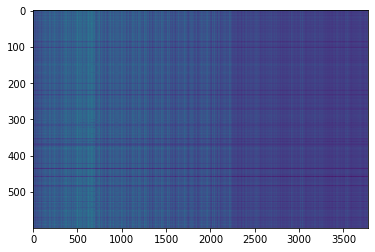

,AUC,pAUC
Source_0,0.768100,0.651579
Source_1,0.754300,0.665263
Source_2,0.836700,0.735263
Target_0,0.686900,0.673684
Target_1,0.799600,0.597368
Target_2,0.400800,0.505263
mean,0.707733,0.638070
h_mean,0.664874,0.629227


2021-05-30 02:48:46,873 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:11038.825033, val_AUC_hmean:0.664874, val_pAUC_hmean:0.629227, best_flag:True
2021-05-30 02:48:46,875 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.54it/s]
2021-05-30 02:48:47,561 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.01it/s]
2021-05-30 02:48:47,605 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.27it/s]
2021-05-30 02:48:47,651 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:10786.505046, val_AUC_hmean:0.691375, val_pAUC_hmean:0.624770, best_flag:False
2021-05-30 02:48:47,653 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.11it/s]
2021-05-30 02:48:48,317 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.21it/s]
2021-05-30 02:48:48,369 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.36it/s]
2021-05-30 02

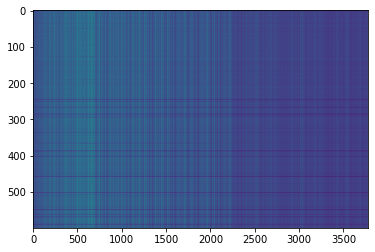

,AUC,pAUC
Source_0,0.785400,0.651579
Source_1,0.729500,0.658947
Source_2,0.824600,0.732632
Target_0,0.702700,0.675789
Target_1,0.807100,0.593684
Target_2,0.438000,0.522105
mean,0.714550,0.639123
h_mean,0.681668,0.631797


2021-05-30 02:48:54,589 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:9403.704264, val_AUC_hmean:0.681668, val_pAUC_hmean:0.631797, best_flag:True
2021-05-30 02:48:54,590 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.66it/s]
2021-05-30 02:48:55,272 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.77it/s]
2021-05-30 02:48:55,325 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.43it/s]
2021-05-30 02:48:55,377 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:9212.471191, val_AUC_hmean:0.640725, val_pAUC_hmean:0.600886, best_flag:False
2021-05-30 02:48:55,379 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.06it/s]
2021-05-30 02:48:56,046 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.37it/s]
2021-05-30 02:48:56,100 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.54it/s]
2021-05-30 02:4

100%|██████████| 2/2 [00:00<00:00, 56.21it/s]
2021-05-30 02:49:07,749 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.70it/s]
2021-05-30 02:49:07,800 - pytorch_modeler.py - INFO - epoch:100/300, train_losses:6669.328695, val_AUC_hmean:0.655327, val_pAUC_hmean:0.618929, best_flag:False
2021-05-30 02:49:07,801 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.95it/s]
2021-05-30 02:49:08,471 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.06it/s]
2021-05-30 02:49:08,523 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.19it/s]
2021-05-30 02:49:08,573 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:6528.202799, val_AUC_hmean:0.664046, val_pAUC_hmean:0.624503, best_flag:False
2021-05-30 02:49:08,574 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.00it/s]
2021-05-30 02:49:09,243 - pytorch_modeler.py - INFO - valid_source
100%|███████

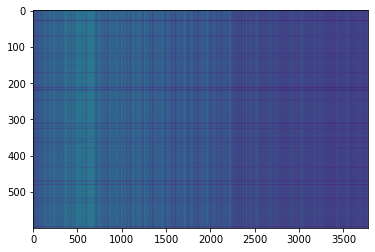

,AUC,pAUC
Source_0,0.747000,0.644211
Source_1,0.722700,0.643684
Source_2,0.836800,0.737895
Target_0,0.684600,0.663158
Target_1,0.825800,0.640526
Target_2,0.425600,0.515263
mean,0.707083,0.640789
h_mean,0.671239,0.633516


2021-05-30 02:49:16,392 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:5531.418376, val_AUC_hmean:0.671239, val_pAUC_hmean:0.633516, best_flag:True
2021-05-30 02:49:16,392 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.09it/s]
2021-05-30 02:49:17,058 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.05it/s]
2021-05-30 02:49:17,099 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 97.43it/s]
2021-05-30 02:49:17,141 - pytorch_modeler.py - INFO - epoch:110/300, train_losses:5375.960327, val_AUC_hmean:0.659680, val_pAUC_hmean:0.632993, best_flag:False
2021-05-30 02:49:17,142 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.10it/s]
2021-05-30 02:49:17,807 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.88it/s]
2021-05-30 02:49:17,873 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.13it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 55.67it/s]
2021-05-30 02:49:29,495 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.18it/s]


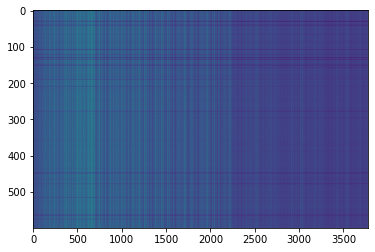

,AUC,pAUC
Source_0,0.783300,0.657895
Source_1,0.731600,0.645263
Source_2,0.817600,0.732632
Target_0,0.698300,0.678421
Target_1,0.810900,0.636842
Target_2,0.402500,0.504737
mean,0.707367,0.642632
h_mean,0.665459,0.634237


2021-05-30 02:49:31,098 - pytorch_modeler.py - INFO - epoch:126/300, train_losses:3821.439290, val_AUC_hmean:0.665459, val_pAUC_hmean:0.634237, best_flag:True
2021-05-30 02:49:31,099 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.75it/s]
2021-05-30 02:49:31,777 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.90it/s]
2021-05-30 02:49:31,830 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.27it/s]
2021-05-30 02:49:31,882 - pytorch_modeler.py - INFO - epoch:127/300, train_losses:3786.565145, val_AUC_hmean:0.653769, val_pAUC_hmean:0.631402, best_flag:False
2021-05-30 02:49:31,884 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.47it/s]
2021-05-30 02:49:32,502 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.63it/s]
2021-05-30 02:49:32,563 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.17it/s]
2021-05-30 02

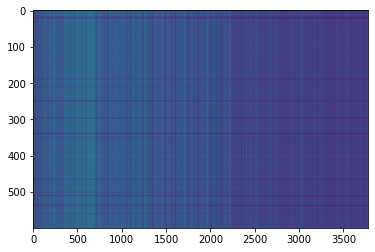

,AUC,pAUC
Source_0,0.775300,0.656842
Source_1,0.756700,0.662105
Source_2,0.821100,0.727368
Target_0,0.710700,0.673158
Target_1,0.825700,0.641579
Target_2,0.446800,0.507368
mean,0.722717,0.644737
h_mean,0.690805,0.636758


2021-05-30 02:49:36,720 - pytorch_modeler.py - INFO - epoch:131/300, train_losses:3534.481913, val_AUC_hmean:0.690805, val_pAUC_hmean:0.636758, best_flag:True
2021-05-30 02:49:36,721 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.50it/s]
2021-05-30 02:49:37,408 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.27it/s]
2021-05-30 02:49:37,463 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.49it/s]
2021-05-30 02:49:37,520 - pytorch_modeler.py - INFO - epoch:132/300, train_losses:3399.957194, val_AUC_hmean:0.693827, val_pAUC_hmean:0.635314, best_flag:False
2021-05-30 02:49:37,521 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.90it/s]
2021-05-30 02:49:38,195 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.85it/s]
2021-05-30 02:49:38,255 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.63it/s]
2021-05-30 02

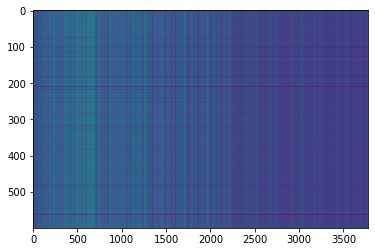

,AUC,pAUC
Source_0,0.793900,0.665789
Source_1,0.727500,0.648947
Source_2,0.834200,0.730000
Target_0,0.732700,0.684211
Target_1,0.812900,0.641053
Target_2,0.395100,0.512105
mean,0.716050,0.647018
h_mean,0.669724,0.639182


2021-05-30 02:49:46,067 - pytorch_modeler.py - INFO - epoch:141/300, train_losses:2865.864685, val_AUC_hmean:0.669724, val_pAUC_hmean:0.639182, best_flag:True
2021-05-30 02:49:46,068 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.53it/s]
2021-05-30 02:49:46,684 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.57it/s]
2021-05-30 02:49:46,739 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.56it/s]
2021-05-30 02:49:46,791 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:2793.847758, val_AUC_hmean:0.667982, val_pAUC_hmean:0.636426, best_flag:False
2021-05-30 02:49:46,792 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.01it/s]
2021-05-30 02:49:47,460 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.18it/s]
2021-05-30 02:49:47,513 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.09it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 80.04it/s]
2021-05-30 02:49:57,941 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.63it/s]
2021-05-30 02:49:57,987 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:2001.831573, val_AUC_hmean:0.676387, val_pAUC_hmean:0.622833, best_flag:False
2021-05-30 02:49:57,988 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.45it/s]
2021-05-30 02:49:58,444 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.92it/s]
2021-05-30 02:49:58,479 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.53it/s]
2021-05-30 02:49:58,518 - pytorch_modeler.py - INFO - epoch:159/300, train_losses:2166.310822, val_AUC_hmean:0.619665, val_pAUC_hmean:0.551325, best_flag:False
2021-05-30 02:49:58,519 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.22it/s]
2021-05-30 02:49:59,145 - pytorch_modeler.py - INFO - valid_source
100%|█████

2021-05-30 02:50:07,738 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.12it/s]
2021-05-30 02:50:08,200 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.57it/s]
2021-05-30 02:50:08,235 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.82it/s]
2021-05-30 02:50:08,279 - pytorch_modeler.py - INFO - epoch:175/300, train_losses:1510.187897, val_AUC_hmean:0.649233, val_pAUC_hmean:0.629557, best_flag:False
2021-05-30 02:50:08,279 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 24.14it/s]
2021-05-30 02:50:08,779 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.40it/s]
2021-05-30 02:50:08,834 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.48it/s]
2021-05-30 02:50:08,883 - pytorch_modeler.py - INFO - epoch:176/300, train_losses:1411.081736, val_AUC_hmean:0.685851, val_pAUC_hmean:0.620397, best_flag:False
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 103.74it/s]
2021-05-30 02:50:17,835 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:1078.207535, val_AUC_hmean:0.686532, val_pAUC_hmean:0.634260, best_flag:False
2021-05-30 02:50:17,836 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.33it/s]
2021-05-30 02:50:18,530 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.01it/s]
2021-05-30 02:50:18,581 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.39it/s]
2021-05-30 02:50:18,624 - pytorch_modeler.py - INFO - epoch:192/300, train_losses:1054.156840, val_AUC_hmean:0.677113, val_pAUC_hmean:0.629932, best_flag:False
2021-05-30 02:50:18,625 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.98it/s]
2021-05-30 02:50:19,071 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.89it/s]
2021-05-30 02:50:19,107 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 25.66it/s]
2021-05-30 02:50:28,849 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.70it/s]
2021-05-30 02:50:28,891 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.02it/s]
2021-05-30 02:50:28,931 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:763.777354, val_AUC_hmean:0.667579, val_pAUC_hmean:0.631629, best_flag:False
2021-05-30 02:50:28,932 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.19it/s]
2021-05-30 02:50:29,593 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.27it/s]
2021-05-30 02:50:29,630 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.42it/s]
2021-05-30 02:50:29,668 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:776.044464, val_AUC_hmean:0.652219, val_pAUC_hmean:0.633681, best_flag:False
2021-05-30 02:50:29,669 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 02:50:39,230 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.18it/s]
2021-05-30 02:50:39,893 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.01it/s]
2021-05-30 02:50:39,946 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.15it/s]
2021-05-30 02:50:39,996 - pytorch_modeler.py - INFO - epoch:225/300, train_losses:563.845647, val_AUC_hmean:0.643978, val_pAUC_hmean:0.632636, best_flag:False
2021-05-30 02:50:39,997 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.08it/s]
2021-05-30 02:50:40,662 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.96it/s]
2021-05-30 02:50:40,716 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.92it/s]
2021-05-30 02:50:40,765 - pytorch_modeler.py - INFO - epoch:226/300, train_losses:532.360771, val_AUC_hmean:0.646739, val_pAUC_hmean:0.630012, best_flag:False
2021-05-30 02:

100%|██████████| 2/2 [00:00<00:00, 97.34it/s]
2021-05-30 02:50:51,380 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:395.007919, val_AUC_hmean:0.658972, val_pAUC_hmean:0.629352, best_flag:False
2021-05-30 02:50:51,381 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.19it/s]
2021-05-30 02:50:51,824 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.81it/s]
2021-05-30 02:50:51,861 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.78it/s]
2021-05-30 02:50:51,902 - pytorch_modeler.py - INFO - epoch:242/300, train_losses:389.885251, val_AUC_hmean:0.641581, val_pAUC_hmean:0.628785, best_flag:False
2021-05-30 02:50:51,903 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.80it/s]
2021-05-30 02:50:52,511 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.85it/s]
2021-05-30 02:50:52,565 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 18.07it/s]
2021-05-30 02:51:03,494 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.68it/s]
2021-05-30 02:51:03,546 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.98it/s]
2021-05-30 02:51:03,598 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:297.713125, val_AUC_hmean:0.650760, val_pAUC_hmean:0.630144, best_flag:False
2021-05-30 02:51:03,599 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.00it/s]
2021-05-30 02:51:04,268 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.25it/s]
2021-05-30 02:51:04,319 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.36it/s]
2021-05-30 02:51:04,370 - pytorch_modeler.py - INFO - epoch:259/300, train_losses:291.266399, val_AUC_hmean:0.658904, val_pAUC_hmean:0.630841, best_flag:False
2021-05-30 02:51:04,371 - pytorch_modeler.py - INFO - train
100%|█████████

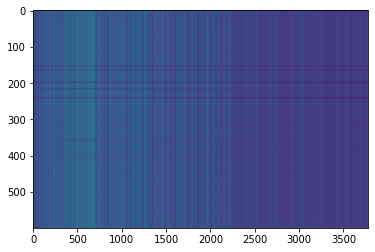

,AUC,pAUC
Source_0,0.783300,0.668947
Source_1,0.744900,0.625789
Source_2,0.836000,0.723684
Target_0,0.714100,0.680000
Target_1,0.827300,0.661579
Target_2,0.410100,0.521579
mean,0.719283,0.646930
h_mean,0.676985,0.640064


2021-05-30 02:51:12,455 - pytorch_modeler.py - INFO - epoch:268/300, train_losses:281.105846, val_AUC_hmean:0.676985, val_pAUC_hmean:0.640064, best_flag:True
2021-05-30 02:51:12,455 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.12it/s]
2021-05-30 02:51:13,119 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.46it/s]
2021-05-30 02:51:13,173 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.95it/s]
2021-05-30 02:51:13,224 - pytorch_modeler.py - INFO - epoch:269/300, train_losses:264.051119, val_AUC_hmean:0.662494, val_pAUC_hmean:0.634826, best_flag:False
2021-05-30 02:51:13,225 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.16it/s]
2021-05-30 02:51:13,888 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.88it/s]
2021-05-30 02:51:13,942 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.25it/s]
2021-05-30 02:5

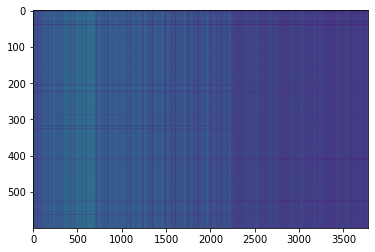

,AUC,pAUC
Source_0,0.778700,0.675263
Source_1,0.761100,0.629474
Source_2,0.840900,0.725789
Target_0,0.672600,0.678947
Target_1,0.827600,0.666842
Target_2,0.384200,0.515789
mean,0.710850,0.648684
h_mean,0.660417,0.641122


2021-05-30 02:51:25,865 - pytorch_modeler.py - INFO - epoch:283/300, train_losses:224.201031, val_AUC_hmean:0.660417, val_pAUC_hmean:0.641122, best_flag:True
2021-05-30 02:51:25,866 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.42it/s]
2021-05-30 02:51:26,556 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.11it/s]
2021-05-30 02:51:26,610 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.16it/s]
2021-05-30 02:51:26,662 - pytorch_modeler.py - INFO - epoch:284/300, train_losses:219.893583, val_AUC_hmean:0.678567, val_pAUC_hmean:0.637128, best_flag:False
2021-05-30 02:51:26,663 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.79it/s]
2021-05-30 02:51:27,339 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.25it/s]
2021-05-30 02:51:27,397 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.95it/s]
2021-05-30 02:5

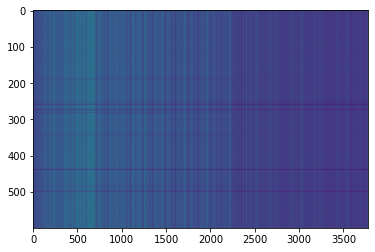

,AUC,pAUC
Source_0,0.755100,0.665789
Source_1,0.726200,0.633158
Source_2,0.823900,0.724737
Target_0,0.669700,0.675263
Target_1,0.828000,0.671579
Target_2,0.405000,0.521579
mean,0.701317,0.648684
h_mean,0.660417,0.641824


2021-05-30 02:51:31,233 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:207.062861, val_AUC_hmean:0.660417, val_pAUC_hmean:0.641824, best_flag:True
2021-05-30 02:51:31,234 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.13it/s]
2021-05-30 02:51:31,898 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.84it/s]
2021-05-30 02:51:31,952 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.50it/s]
2021-05-30 02:51:32,001 - pytorch_modeler.py - INFO - epoch:289/300, train_losses:228.719186, val_AUC_hmean:0.711481, val_pAUC_hmean:0.632771, best_flag:False
2021-05-30 02:51:32,002 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.03it/s]
2021-05-30 02:51:32,669 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.19it/s]
2021-05-30 02:51:32,723 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.10it/s]
2021-05-30 02:5

,AUC,pAUC
Source_0,0.755100,0.665789
Source_1,0.726200,0.633158
Source_2,0.823900,0.724737
Target_0,0.669700,0.675263
Target_1,0.828000,0.671579
Target_2,0.405000,0.521579
mean,0.701317,0.648684
h_mean,0.660417,0.641824


2021-05-30 02:51:40,713 - 00_train.py - INFO - TARGET MACHINE_TYPE: pump
2021-05-30 02:51:40,714 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 02:51:40,811 - 00_train.py - INFO - TRAINING


elapsed time: 250.325075388 [sec]


2021-05-30 02:51:41,247 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 16.39it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 17.93it/s]
2021-05-30 02:51:41,919 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.04it/s]
2021-05-30 02:51:41,969 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.29it/s]


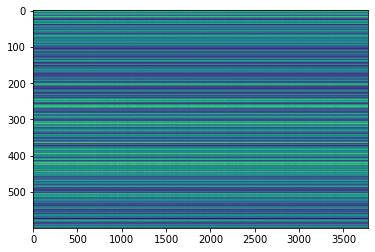

,AUC,pAUC
Source_0,0.541700,0.538947
Source_1,0.580500,0.566842
Source_2,0.684100,0.587368
Target_0,0.526100,0.585263
Target_1,0.676900,0.565263
Target_2,0.646400,0.523158
mean,0.609283,0.561140
h_mean,0.602676,0.560155


2021-05-30 02:51:43,478 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:135903.921875, val_AUC_hmean:0.602676, val_pAUC_hmean:0.560155, best_flag:True
2021-05-30 02:51:43,479 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.57it/s]
2021-05-30 02:51:44,166 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.27it/s]
2021-05-30 02:51:44,224 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.55it/s]
2021-05-30 02:51:44,281 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:87116.552734, val_AUC_hmean:0.626744, val_pAUC_hmean:0.551824, best_flag:False
2021-05-30 02:51:44,282 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.81it/s]
2021-05-30 02:51:44,998 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.12it/s]
2021-05-30 02:51:45,052 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.48it/s]


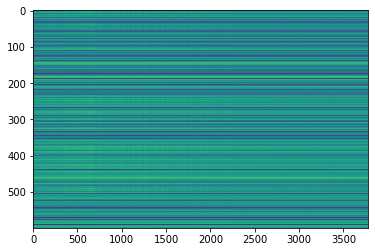

,AUC,pAUC
Source_0,0.583700,0.543158
Source_1,0.638200,0.532105
Source_2,0.736600,0.610000
Target_0,0.565200,0.604737
Target_1,0.664900,0.531053
Target_2,0.722700,0.560526
mean,0.651883,0.563596
h_mean,0.645531,0.561774


2021-05-30 02:51:46,628 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:77070.845052, val_AUC_hmean:0.645531, val_pAUC_hmean:0.561774, best_flag:True
2021-05-30 02:51:46,629 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.78it/s]
2021-05-30 02:51:47,306 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.08it/s]
2021-05-30 02:51:47,359 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.58it/s]


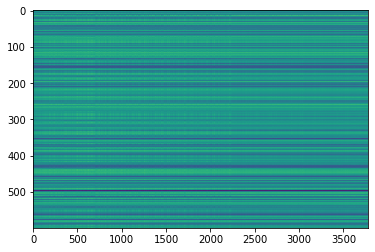

,AUC,pAUC
Source_0,0.629600,0.543684
Source_1,0.670400,0.552632
Source_2,0.771400,0.662105
Target_0,0.663400,0.602632
Target_1,0.633100,0.498947
Target_2,0.660100,0.565789
mean,0.671333,0.570965
h_mean,0.668290,0.566561


2021-05-30 02:51:48,900 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:69940.987630, val_AUC_hmean:0.668290, val_pAUC_hmean:0.566561, best_flag:True
2021-05-30 02:51:48,900 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.29it/s]
2021-05-30 02:51:49,597 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.03it/s]
2021-05-30 02:51:49,646 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.16it/s]
2021-05-30 02:51:49,693 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:66468.410807, val_AUC_hmean:0.682950, val_pAUC_hmean:0.561931, best_flag:False
2021-05-30 02:51:49,694 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.06it/s]
2021-05-30 02:51:50,400 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.17it/s]
2021-05-30 02:51:50,439 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.27it/s]


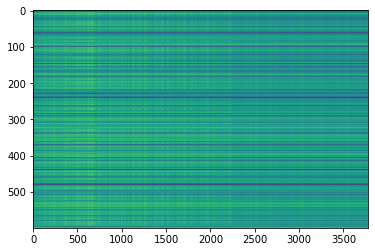

,AUC,pAUC
Source_0,0.669200,0.594737
Source_1,0.665800,0.572632
Source_2,0.777700,0.640000
Target_0,0.663200,0.624737
Target_1,0.607700,0.487895
Target_2,0.623700,0.530526
mean,0.667883,0.575088
h_mean,0.663802,0.570047


2021-05-30 02:51:52,013 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:62654.484375, val_AUC_hmean:0.663802, val_pAUC_hmean:0.570047, best_flag:True
2021-05-30 02:51:52,014 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.74it/s]
2021-05-30 02:51:52,693 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 18.79it/s]
2021-05-30 02:51:52,817 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.31it/s]


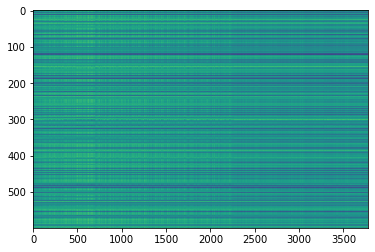

,AUC,pAUC
Source_0,0.698900,0.604211
Source_1,0.698200,0.568947
Source_2,0.798200,0.665263
Target_0,0.703600,0.642632
Target_1,0.629400,0.485263
Target_2,0.626800,0.538947
mean,0.692517,0.584211
h_mean,0.687965,0.577581


2021-05-30 02:51:54,353 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:59410.767253, val_AUC_hmean:0.687965, val_pAUC_hmean:0.577581, best_flag:True
2021-05-30 02:51:54,354 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.92it/s]
2021-05-30 02:51:55,025 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.16it/s]
2021-05-30 02:51:55,079 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.77it/s]


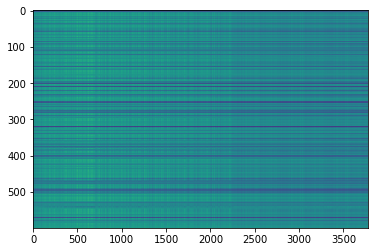

,AUC,pAUC
Source_0,0.783500,0.643684
Source_1,0.682200,0.567895
Source_2,0.788600,0.726316
Target_0,0.720100,0.662632
Target_1,0.648900,0.488421
Target_2,0.609300,0.552632
mean,0.705433,0.606930
h_mean,0.699200,0.596580


2021-05-30 02:51:56,676 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:56909.514648, val_AUC_hmean:0.699200, val_pAUC_hmean:0.596580, best_flag:True
2021-05-30 02:51:56,677 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.82it/s]
2021-05-30 02:51:57,353 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.32it/s]
2021-05-30 02:51:57,407 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.87it/s]
2021-05-30 02:51:57,459 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:54587.242188, val_AUC_hmean:0.696683, val_pAUC_hmean:0.586881, best_flag:False
2021-05-30 02:51:57,460 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.01it/s]
2021-05-30 02:51:58,128 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.86it/s]
2021-05-30 02:51:58,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.12it/s]
2021-05-30 02:5

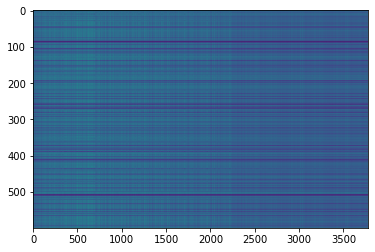

,AUC,pAUC
Source_0,0.771100,0.620000
Source_1,0.717900,0.603684
Source_2,0.776300,0.715263
Target_0,0.717400,0.665789
Target_1,0.680900,0.524211
Target_2,0.592000,0.527895
mean,0.709267,0.609474
h_mean,0.703423,0.601720


2021-05-30 02:52:00,532 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:50463.242188, val_AUC_hmean:0.703423, val_pAUC_hmean:0.601720, best_flag:True
2021-05-30 02:52:00,533 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 02:52:01,203 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.30it/s]
2021-05-30 02:52:01,257 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.45it/s]
2021-05-30 02:52:01,307 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:48712.414388, val_AUC_hmean:0.690329, val_pAUC_hmean:0.590495, best_flag:False
2021-05-30 02:52:01,308 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.05it/s]
2021-05-30 02:52:01,975 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.62it/s]
2021-05-30 02:52:02,027 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.47it/s]
2021-05-30 02

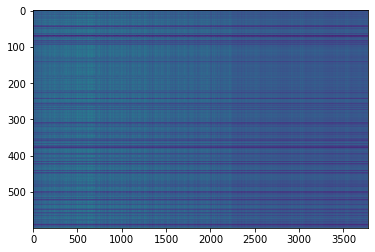

,AUC,pAUC
Source_0,0.784000,0.643684
Source_1,0.730300,0.634211
Source_2,0.844600,0.743684
Target_0,0.790000,0.655263
Target_1,0.678000,0.506842
Target_2,0.522100,0.511053
mean,0.724833,0.615789
h_mean,0.707139,0.604179


2021-05-30 02:52:04,339 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:45114.227539, val_AUC_hmean:0.707139, val_pAUC_hmean:0.604179, best_flag:True
2021-05-30 02:52:04,339 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.94it/s]
2021-05-30 02:52:05,010 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.41it/s]
2021-05-30 02:52:05,064 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.52it/s]
2021-05-30 02:52:05,115 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:43862.896484, val_AUC_hmean:0.693009, val_pAUC_hmean:0.597111, best_flag:False
2021-05-30 02:52:05,116 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.10it/s]
2021-05-30 02:52:05,781 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.07it/s]
2021-05-30 02:52:05,835 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.58it/s]
2021-05-30 02

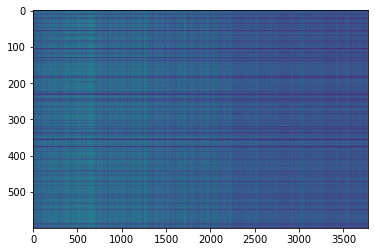

,AUC,pAUC
Source_0,0.822200,0.650000
Source_1,0.728200,0.638947
Source_2,0.859900,0.741053
Target_0,0.747400,0.669474
Target_1,0.719500,0.515263
Target_2,0.449200,0.506316
mean,0.721067,0.620175
h_mean,0.689146,0.608366


2021-05-30 02:52:08,928 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:40177.926758, val_AUC_hmean:0.689146, val_pAUC_hmean:0.608366, best_flag:True
2021-05-30 02:52:08,929 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.86it/s]
2021-05-30 02:52:09,604 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.53it/s]
2021-05-30 02:52:09,657 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.00it/s]


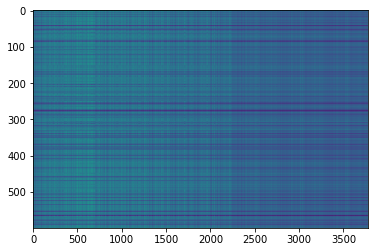

,AUC,pAUC
Source_0,0.830100,0.670000
Source_1,0.721800,0.623684
Source_2,0.836000,0.751053
Target_0,0.745800,0.668421
Target_1,0.767100,0.584737
Target_2,0.469100,0.508947
mean,0.728317,0.634474
h_mean,0.700733,0.625101


2021-05-30 02:52:11,200 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:38823.417643, val_AUC_hmean:0.700733, val_pAUC_hmean:0.625101, best_flag:True
2021-05-30 02:52:11,201 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.33it/s]
2021-05-30 02:52:11,896 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 16.36it/s]
2021-05-30 02:52:12,035 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.20it/s]
2021-05-30 02:52:12,090 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:37893.030599, val_AUC_hmean:0.691929, val_pAUC_hmean:0.599897, best_flag:False
2021-05-30 02:52:12,090 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.60it/s]
2021-05-30 02:52:12,774 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.09it/s]
2021-05-30 02:52:12,818 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.28it/s]
2021-05-30 02

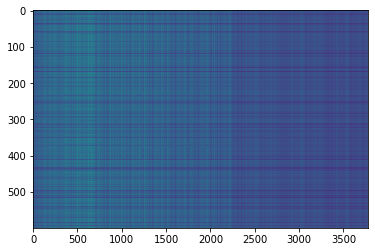

,AUC,pAUC
Source_0,0.781300,0.648421
Source_1,0.737900,0.656316
Source_2,0.819100,0.737368
Target_0,0.680200,0.648947
Target_1,0.824400,0.587368
Target_2,0.514600,0.525263
mean,0.726250,0.633947
h_mean,0.707348,0.627004


2021-05-30 02:52:23,034 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:28289.536621, val_AUC_hmean:0.707348, val_pAUC_hmean:0.627004, best_flag:True
2021-05-30 02:52:23,035 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.11it/s]
2021-05-30 02:52:23,699 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.25it/s]
2021-05-30 02:52:23,751 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.20it/s]


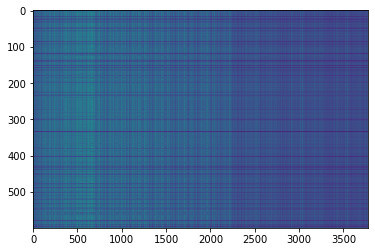

,AUC,pAUC
Source_0,0.827000,0.661579
Source_1,0.742700,0.643684
Source_2,0.840900,0.739474
Target_0,0.727500,0.656316
Target_1,0.838700,0.638421
Target_2,0.497500,0.527895
mean,0.745717,0.644561
h_mean,0.721000,0.638179


2021-05-30 02:52:25,302 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:27563.368815, val_AUC_hmean:0.721000, val_pAUC_hmean:0.638179, best_flag:True
2021-05-30 02:52:25,303 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.60it/s]
2021-05-30 02:52:25,987 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.57it/s]
2021-05-30 02:52:26,058 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.63it/s]
2021-05-30 02:52:26,108 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:26886.428548, val_AUC_hmean:0.716730, val_pAUC_hmean:0.605741, best_flag:False
2021-05-30 02:52:26,109 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.75it/s]
2021-05-30 02:52:26,788 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.94it/s]
2021-05-30 02:52:26,839 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.20it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 56.18it/s]
2021-05-30 02:52:38,535 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.04it/s]
2021-05-30 02:52:38,586 - pytorch_modeler.py - INFO - epoch:50/300, train_losses:19274.044108, val_AUC_hmean:0.714418, val_pAUC_hmean:0.627829, best_flag:False
2021-05-30 02:52:38,587 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.01it/s]
2021-05-30 02:52:39,255 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.35it/s]
2021-05-30 02:52:39,308 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.17it/s]
2021-05-30 02:52:39,358 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:18862.165039, val_AUC_hmean:0.675074, val_pAUC_hmean:0.613322, best_flag:False
2021-05-30 02:52:39,359 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.08it/s]
2021-05-30 02:52:40,025 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 02:52:50,971 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.99it/s]
2021-05-30 02:52:51,640 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.45it/s]
2021-05-30 02:52:51,690 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.44it/s]
2021-05-30 02:52:51,741 - pytorch_modeler.py - INFO - epoch:67/300, train_losses:13687.700684, val_AUC_hmean:0.701444, val_pAUC_hmean:0.611903, best_flag:False
2021-05-30 02:52:51,742 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.07it/s]
2021-05-30 02:52:52,408 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.11it/s]
2021-05-30 02:52:52,460 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.15it/s]
2021-05-30 02:52:52,512 - pytorch_modeler.py - INFO - epoch:68/300, train_losses:13386.219645, val_AUC_hmean:0.697807, val_pAUC_hmean:0.631128, best_flag:False
2021-05-30 0

100%|██████████| 2/2 [00:00<00:00, 62.16it/s]
2021-05-30 02:53:04,190 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:9975.942790, val_AUC_hmean:0.702552, val_pAUC_hmean:0.622031, best_flag:False
2021-05-30 02:53:04,191 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.02it/s]
2021-05-30 02:53:04,859 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.78it/s]
2021-05-30 02:53:04,911 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.88it/s]
2021-05-30 02:53:04,964 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:9733.148193, val_AUC_hmean:0.698311, val_pAUC_hmean:0.630824, best_flag:False
2021-05-30 02:53:04,965 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.77it/s]
2021-05-30 02:53:05,607 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.05it/s]
2021-05-30 02:53:05,643 - pytorch_modeler.py - INFO - valid_target
100%|████████

100%|██████████| 12/12 [00:00<00:00, 16.10it/s]
2021-05-30 02:53:17,295 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.10it/s]
2021-05-30 02:53:17,346 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.60it/s]
2021-05-30 02:53:17,396 - pytorch_modeler.py - INFO - epoch:100/300, train_losses:7157.472412, val_AUC_hmean:0.699252, val_pAUC_hmean:0.637721, best_flag:False
2021-05-30 02:53:17,397 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 02:53:18,066 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.52it/s]
2021-05-30 02:53:18,119 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.66it/s]
2021-05-30 02:53:18,169 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:7043.189982, val_AUC_hmean:0.682462, val_pAUC_hmean:0.619226, best_flag:False
2021-05-30 02:53:18,171 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 02:53:29,730 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.55it/s]
2021-05-30 02:53:30,379 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.42it/s]
2021-05-30 02:53:30,429 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.28it/s]
2021-05-30 02:53:30,481 - pytorch_modeler.py - INFO - epoch:117/300, train_losses:5091.758748, val_AUC_hmean:0.690740, val_pAUC_hmean:0.629004, best_flag:False
2021-05-30 02:53:30,482 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.11it/s]
2021-05-30 02:53:31,146 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.03it/s]
2021-05-30 02:53:31,199 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.01it/s]
2021-05-30 02:53:31,249 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:5080.598551, val_AUC_hmean:0.702660, val_pAUC_hmean:0.623003, best_flag:False
2021-05-30 0

100%|██████████| 2/2 [00:00<00:00, 62.58it/s]
2021-05-30 02:53:43,116 - pytorch_modeler.py - INFO - epoch:133/300, train_losses:3751.264608, val_AUC_hmean:0.698808, val_pAUC_hmean:0.634709, best_flag:False
2021-05-30 02:53:43,117 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.99it/s]
2021-05-30 02:53:43,786 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.25it/s]
2021-05-30 02:53:43,840 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.64it/s]


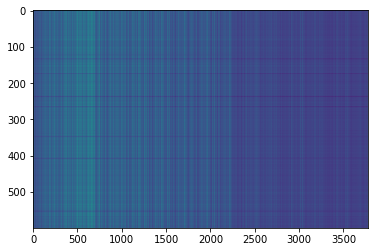

,AUC,pAUC
Source_0,0.833300,0.659474
Source_1,0.760700,0.661053
Source_2,0.842100,0.725789
Target_0,0.729500,0.664211
Target_1,0.860800,0.666842
Target_2,0.480200,0.528947
mean,0.751100,0.651053
h_mean,0.721404,0.644980


2021-05-30 02:53:45,425 - pytorch_modeler.py - INFO - epoch:134/300, train_losses:3636.186869, val_AUC_hmean:0.721404, val_pAUC_hmean:0.644980, best_flag:True
2021-05-30 02:53:45,427 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.85it/s]
2021-05-30 02:53:46,101 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.83it/s]
2021-05-30 02:53:46,153 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.69it/s]
2021-05-30 02:53:46,203 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:3562.210592, val_AUC_hmean:0.677110, val_pAUC_hmean:0.626146, best_flag:False
2021-05-30 02:53:46,205 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.08it/s]
2021-05-30 02:53:46,871 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.39it/s]
2021-05-30 02:53:46,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.07it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 55.09it/s]
2021-05-30 02:53:58,600 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.28it/s]
2021-05-30 02:53:58,650 - pytorch_modeler.py - INFO - epoch:151/300, train_losses:2604.876506, val_AUC_hmean:0.678443, val_pAUC_hmean:0.631927, best_flag:False
2021-05-30 02:53:58,651 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.03it/s]
2021-05-30 02:53:59,319 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.98it/s]
2021-05-30 02:53:59,370 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.53it/s]
2021-05-30 02:53:59,421 - pytorch_modeler.py - INFO - epoch:152/300, train_losses:2560.425985, val_AUC_hmean:0.715590, val_pAUC_hmean:0.637600, best_flag:False
2021-05-30 02:53:59,422 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.88it/s]
2021-05-30 02:54:00,095 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 02:54:10,920 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 23.94it/s]
2021-05-30 02:54:11,424 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.84it/s]
2021-05-30 02:54:11,461 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.44it/s]
2021-05-30 02:54:11,498 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:1841.447072, val_AUC_hmean:0.686669, val_pAUC_hmean:0.631333, best_flag:False
2021-05-30 02:54:11,499 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.71it/s]
2021-05-30 02:54:11,950 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.93it/s]
2021-05-30 02:54:11,990 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.43it/s]
2021-05-30 02:54:12,032 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:1826.264608, val_AUC_hmean:0.662076, val_pAUC_hmean:0.632220, best_flag:False
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 103.17it/s]
2021-05-30 02:54:21,060 - pytorch_modeler.py - INFO - epoch:184/300, train_losses:1329.463531, val_AUC_hmean:0.695966, val_pAUC_hmean:0.637896, best_flag:False
2021-05-30 02:54:21,061 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.64it/s]
2021-05-30 02:54:21,513 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.02it/s]
2021-05-30 02:54:21,560 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.52it/s]
2021-05-30 02:54:21,597 - pytorch_modeler.py - INFO - epoch:185/300, train_losses:1433.187592, val_AUC_hmean:0.694075, val_pAUC_hmean:0.617078, best_flag:False
2021-05-30 02:54:21,598 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.14it/s]
2021-05-30 02:54:22,227 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.49it/s]
2021-05-30 02:54:22,282 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 26.65it/s]
2021-05-30 02:54:31,550 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.54it/s]
2021-05-30 02:54:31,590 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.44it/s]
2021-05-30 02:54:31,631 - pytorch_modeler.py - INFO - epoch:201/300, train_losses:1164.984970, val_AUC_hmean:0.670460, val_pAUC_hmean:0.611621, best_flag:False
2021-05-30 02:54:31,632 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 22.73it/s]
2021-05-30 02:54:32,162 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.93it/s]
2021-05-30 02:54:32,198 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.58it/s]
2021-05-30 02:54:32,242 - pytorch_modeler.py - INFO - epoch:202/300, train_losses:1102.780645, val_AUC_hmean:0.675105, val_pAUC_hmean:0.612897, best_flag:False
2021-05-30 02:54:32,243 - pytorch_modeler.py - INFO - train
100%|███████

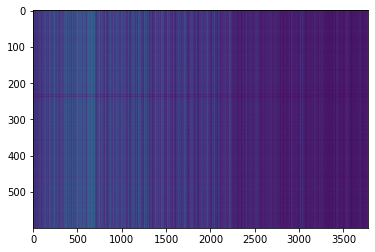

,AUC,pAUC
Source_0,0.786400,0.672632
Source_1,0.743200,0.647895
Source_2,0.812000,0.741579
Target_0,0.708400,0.673684
Target_1,0.840100,0.668421
Target_2,0.439300,0.523684
mean,0.721567,0.654649
h_mean,0.687522,0.647346


2021-05-30 02:54:40,109 - pytorch_modeler.py - INFO - epoch:212/300, train_losses:978.826024, val_AUC_hmean:0.687522, val_pAUC_hmean:0.647346, best_flag:True
2021-05-30 02:54:40,110 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.45it/s]
2021-05-30 02:54:40,565 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.92it/s]
2021-05-30 02:54:40,604 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.95it/s]
2021-05-30 02:54:40,643 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:837.705470, val_AUC_hmean:0.692282, val_pAUC_hmean:0.617723, best_flag:False
2021-05-30 02:54:40,644 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.53it/s]
2021-05-30 02:54:41,231 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.14it/s]
2021-05-30 02:54:41,283 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.37it/s]
2021-05-30 02:

100%|██████████| 2/2 [00:00<00:00, 63.29it/s]
2021-05-30 02:54:50,741 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.50it/s]
2021-05-30 02:54:50,788 - pytorch_modeler.py - INFO - epoch:229/300, train_losses:636.604678, val_AUC_hmean:0.698000, val_pAUC_hmean:0.635785, best_flag:False
2021-05-30 02:54:50,790 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 21.15it/s]
2021-05-30 02:54:51,359 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.06it/s]
2021-05-30 02:54:51,396 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.92it/s]
2021-05-30 02:54:51,434 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:530.228488, val_AUC_hmean:0.672131, val_pAUC_hmean:0.636469, best_flag:False
2021-05-30 02:54:51,435 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.96it/s]
2021-05-30 02:54:51,882 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 02:55:01,368 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.51it/s]
2021-05-30 02:55:01,823 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.26it/s]
2021-05-30 02:55:01,860 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.19it/s]
2021-05-30 02:55:01,900 - pytorch_modeler.py - INFO - epoch:246/300, train_losses:1118.969793, val_AUC_hmean:0.671769, val_pAUC_hmean:0.594006, best_flag:False
2021-05-30 02:55:01,901 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.63it/s]
2021-05-30 02:55:02,548 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.86it/s]
2021-05-30 02:55:02,600 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.26it/s]
2021-05-30 02:55:02,652 - pytorch_modeler.py - INFO - epoch:247/300, train_losses:838.144755, val_AUC_hmean:0.664620, val_pAUC_hmean:0.598971, best_flag:False
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 64.38it/s]
2021-05-30 02:55:13,582 - pytorch_modeler.py - INFO - epoch:262/300, train_losses:380.094157, val_AUC_hmean:0.683534, val_pAUC_hmean:0.633436, best_flag:False
2021-05-30 02:55:13,583 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 02:55:14,253 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.11it/s]
2021-05-30 02:55:14,305 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.76it/s]
2021-05-30 02:55:14,354 - pytorch_modeler.py - INFO - epoch:263/300, train_losses:363.270766, val_AUC_hmean:0.650833, val_pAUC_hmean:0.634536, best_flag:False
2021-05-30 02:55:14,355 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.96it/s]
2021-05-30 02:55:15,025 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.10it/s]
2021-05-30 02:55:15,078 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 12/12 [00:00<00:00, 18.04it/s]
2021-05-30 02:55:26,770 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.88it/s]
2021-05-30 02:55:26,823 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.48it/s]
2021-05-30 02:55:26,873 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:311.753935, val_AUC_hmean:0.699865, val_pAUC_hmean:0.639523, best_flag:False
2021-05-30 02:55:26,874 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.89it/s]
2021-05-30 02:55:27,547 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.18it/s]
2021-05-30 02:55:27,597 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.10it/s]
2021-05-30 02:55:27,645 - pytorch_modeler.py - INFO - epoch:280/300, train_losses:255.412332, val_AUC_hmean:0.683714, val_pAUC_hmean:0.635439, best_flag:False
2021-05-30 02:55:27,647 - pytorch_modeler.py - INFO - train
100%|█████████

2021-05-30 02:55:39,518 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.89it/s]
2021-05-30 02:55:40,156 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.45it/s]
2021-05-30 02:55:40,209 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.57it/s]
2021-05-30 02:55:40,260 - pytorch_modeler.py - INFO - epoch:296/300, train_losses:224.762768, val_AUC_hmean:0.656175, val_pAUC_hmean:0.632582, best_flag:False
2021-05-30 02:55:40,261 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.07it/s]
2021-05-30 02:55:40,927 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.70it/s]
2021-05-30 02:55:40,980 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.54it/s]
2021-05-30 02:55:41,030 - pytorch_modeler.py - INFO - epoch:297/300, train_losses:204.430373, val_AUC_hmean:0.672094, val_pAUC_hmean:0.632793, best_flag:False
2021-05-30 02:

,AUC,pAUC
Source_0,0.786400,0.672632
Source_1,0.743200,0.647895
Source_2,0.812000,0.741579
Target_0,0.708400,0.673684
Target_1,0.840100,0.668421
Target_2,0.439300,0.523684
mean,0.721567,0.654649
h_mean,0.687522,0.647346


2021-05-30 02:55:43,359 - 00_train.py - INFO - TARGET MACHINE_TYPE: fan
2021-05-30 02:55:43,360 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 02:55:43,380 - 00_train.py - INFO - TRAINING


elapsed time: 242.643348217 [sec]


2021-05-30 02:55:43,833 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 17.80it/s]
2021-05-30 02:55:44,509 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.69it/s]
2021-05-30 02:55:44,562 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.70it/s]


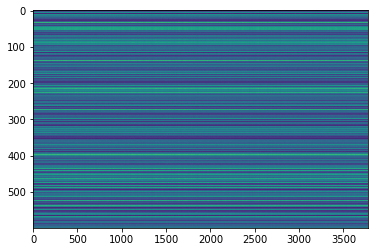

,AUC,pAUC
Source_0,0.565600,0.541053
Source_1,0.566900,0.526842
Source_2,0.619100,0.536316
Target_0,0.566700,0.542632
Target_1,0.628800,0.560000
Target_2,0.592300,0.491579
mean,0.589900,0.533070
h_mean,0.588782,0.532209


2021-05-30 02:55:46,107 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:137495.205729, val_AUC_hmean:0.588782, val_pAUC_hmean:0.532209, best_flag:True
2021-05-30 02:55:46,108 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.40it/s]
2021-05-30 02:55:46,799 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.19it/s]
2021-05-30 02:55:46,853 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.31it/s]


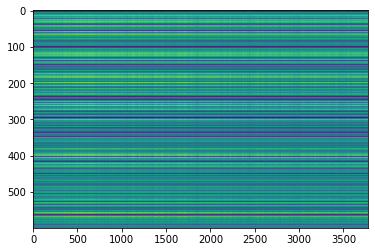

,AUC,pAUC
Source_0,0.580700,0.555263
Source_1,0.580500,0.518421
Source_2,0.638400,0.551579
Target_0,0.587300,0.615789
Target_1,0.678000,0.577368
Target_2,0.619300,0.521053
mean,0.614033,0.556579
h_mean,0.612027,0.554632


2021-05-30 02:55:48,434 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:87937.370443, val_AUC_hmean:0.612027, val_pAUC_hmean:0.554632, best_flag:True
2021-05-30 02:55:48,435 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.96it/s]
2021-05-30 02:55:49,105 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.79it/s]
2021-05-30 02:55:49,158 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.23it/s]


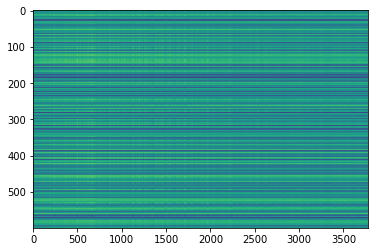

,AUC,pAUC
Source_0,0.568800,0.562105
Source_1,0.649900,0.536316
Source_2,0.685200,0.599474
Target_0,0.583600,0.604211
Target_1,0.652600,0.564737
Target_2,0.676000,0.533158
mean,0.636017,0.566667
h_mean,0.632822,0.565337


2021-05-30 02:55:50,693 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:76660.688802, val_AUC_hmean:0.632822, val_pAUC_hmean:0.565337, best_flag:True
2021-05-30 02:55:50,694 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.41it/s]
2021-05-30 02:55:51,427 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.36it/s]
2021-05-30 02:55:51,485 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.88it/s]


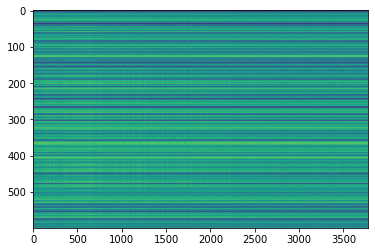

,AUC,pAUC
Source_0,0.611900,0.584737
Source_1,0.648700,0.541579
Source_2,0.729500,0.590526
Target_0,0.576900,0.636316
Target_1,0.661400,0.548947
Target_2,0.645600,0.557895
mean,0.645667,0.576667
h_mean,0.642337,0.574950


2021-05-30 02:55:53,059 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:71625.545573, val_AUC_hmean:0.642337, val_pAUC_hmean:0.574950, best_flag:True
2021-05-30 02:55:53,060 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.37it/s]
2021-05-30 02:55:53,754 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.89it/s]
2021-05-30 02:55:53,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.53it/s]


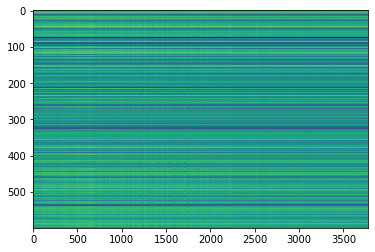

,AUC,pAUC
Source_0,0.718100,0.612632
Source_1,0.673900,0.566316
Source_2,0.728100,0.632105
Target_0,0.684200,0.646842
Target_1,0.687900,0.525789
Target_2,0.622400,0.522105
mean,0.685767,0.584298
h_mean,0.684007,0.580085


2021-05-30 02:55:55,444 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:66361.477865, val_AUC_hmean:0.684007, val_pAUC_hmean:0.580085, best_flag:True
2021-05-30 02:55:55,445 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.09it/s]
2021-05-30 02:55:56,149 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 97.76it/s]
2021-05-30 02:55:56,185 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.21it/s]
2021-05-30 02:55:56,245 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:63174.382161, val_AUC_hmean:0.666886, val_pAUC_hmean:0.578345, best_flag:False
2021-05-30 02:55:56,245 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.57it/s]
2021-05-30 02:55:56,931 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.35it/s]
2021-05-30 02:55:56,972 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.33it/s]
2021-05-30 02:5

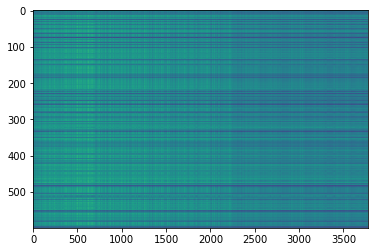

,AUC,pAUC
Source_0,0.698800,0.608421
Source_1,0.687600,0.575789
Source_2,0.817500,0.729474
Target_0,0.632400,0.634211
Target_1,0.673800,0.513158
Target_2,0.600800,0.518947
mean,0.685150,0.596667
h_mean,0.678852,0.588025


2021-05-30 02:56:01,746 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:50910.371094, val_AUC_hmean:0.678852, val_pAUC_hmean:0.588025, best_flag:True
2021-05-30 02:56:01,747 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.22it/s]
2021-05-30 02:56:02,446 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.49it/s]
2021-05-30 02:56:02,484 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.60it/s]


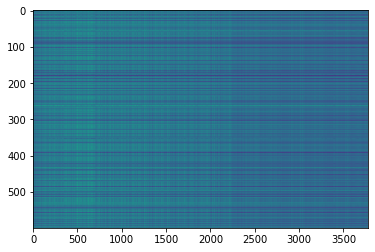

,AUC,pAUC
Source_0,0.719500,0.613158
Source_1,0.668400,0.597368
Source_2,0.815900,0.737895
Target_0,0.701200,0.656316
Target_1,0.663300,0.501053
Target_2,0.578500,0.518421
mean,0.691133,0.604035
h_mean,0.683842,0.593560


2021-05-30 02:56:04,066 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:48768.483724, val_AUC_hmean:0.683842, val_pAUC_hmean:0.593560, best_flag:True
2021-05-30 02:56:04,066 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.51it/s]
2021-05-30 02:56:04,753 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.36it/s]
2021-05-30 02:56:04,812 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.89it/s]
2021-05-30 02:56:04,860 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:47438.697917, val_AUC_hmean:0.657113, val_pAUC_hmean:0.575346, best_flag:False
2021-05-30 02:56:04,861 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.67it/s]
2021-05-30 02:56:05,542 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.49it/s]
2021-05-30 02:56:05,598 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.46it/s]


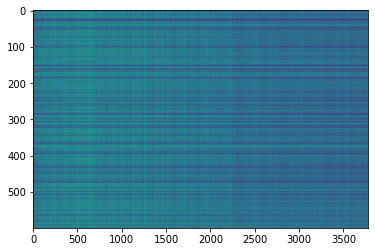

,AUC,pAUC
Source_0,0.724300,0.620000
Source_1,0.689600,0.578947
Source_2,0.819700,0.748421
Target_0,0.674200,0.665263
Target_1,0.658100,0.505789
Target_2,0.585700,0.547368
mean,0.691933,0.610965
h_mean,0.684866,0.600991


2021-05-30 02:56:07,168 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:45375.158854, val_AUC_hmean:0.684866, val_pAUC_hmean:0.600991, best_flag:True
2021-05-30 02:56:07,169 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.10it/s]
2021-05-30 02:56:07,834 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.61it/s]
2021-05-30 02:56:07,885 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.49it/s]
2021-05-30 02:56:07,939 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:43933.999674, val_AUC_hmean:0.699534, val_pAUC_hmean:0.593902, best_flag:False
2021-05-30 02:56:07,940 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.17it/s]
2021-05-30 02:56:08,603 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.57it/s]
2021-05-30 02:56:08,657 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.90it/s]
2021-05-30 02

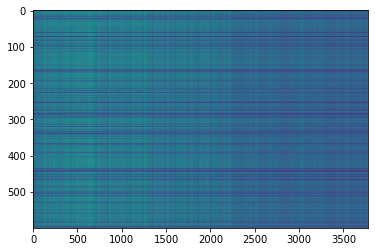

,AUC,pAUC
Source_0,0.739800,0.635789
Source_1,0.705500,0.626316
Source_2,0.879500,0.733158
Target_0,0.646100,0.651053
Target_1,0.702900,0.533684
Target_2,0.544900,0.505789
mean,0.703117,0.614298
h_mean,0.688722,0.604821


2021-05-30 02:56:11,820 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:40323.665690, val_AUC_hmean:0.688722, val_pAUC_hmean:0.604821, best_flag:True
2021-05-30 02:56:11,821 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.21it/s]
2021-05-30 02:56:12,482 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.22it/s]
2021-05-30 02:56:12,536 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.70it/s]


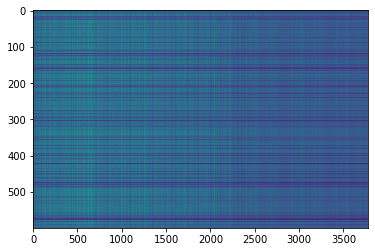

,AUC,pAUC
Source_0,0.781800,0.650000
Source_1,0.714700,0.631053
Source_2,0.860700,0.744737
Target_0,0.708900,0.677895
Target_1,0.684200,0.497895
Target_2,0.518500,0.510526
mean,0.711467,0.618684
h_mean,0.694366,0.605556


2021-05-30 02:56:14,093 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:39193.222656, val_AUC_hmean:0.694366, val_pAUC_hmean:0.605556, best_flag:True
2021-05-30 02:56:14,094 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.69it/s]
2021-05-30 02:56:14,774 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.35it/s]
2021-05-30 02:56:14,833 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.14it/s]
2021-05-30 02:56:14,883 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:38108.197266, val_AUC_hmean:0.691545, val_pAUC_hmean:0.600140, best_flag:False
2021-05-30 02:56:14,884 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.21it/s]
2021-05-30 02:56:15,545 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.91it/s]
2021-05-30 02:56:15,598 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.13it/s]


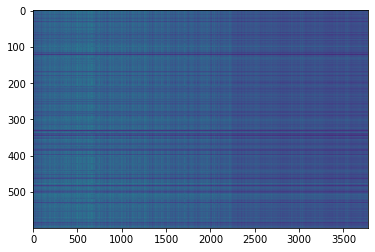

,AUC,pAUC
Source_0,0.687400,0.646316
Source_1,0.741300,0.670526
Source_2,0.806700,0.734737
Target_0,0.660700,0.662105
Target_1,0.710200,0.513684
Target_2,0.501200,0.511053
mean,0.684583,0.623070
h_mean,0.669630,0.611407


2021-05-30 02:56:17,159 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:36928.930664, val_AUC_hmean:0.669630, val_pAUC_hmean:0.611407, best_flag:True
2021-05-30 02:56:17,160 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.13it/s]
2021-05-30 02:56:17,863 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.91it/s]
2021-05-30 02:56:17,926 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.93it/s]
2021-05-30 02:56:17,979 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:36175.329427, val_AUC_hmean:0.679948, val_pAUC_hmean:0.588206, best_flag:False
2021-05-30 02:56:17,980 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.12it/s]
2021-05-30 02:56:18,644 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.38it/s]
2021-05-30 02:56:18,699 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.71it/s]
2021-05-30 02

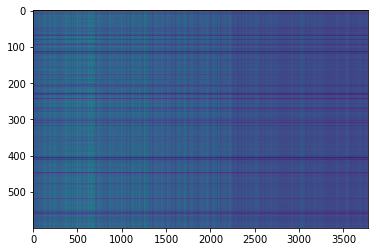

,AUC,pAUC
Source_0,0.765800,0.643158
Source_1,0.708400,0.616842
Source_2,0.811700,0.737895
Target_0,0.661100,0.651579
Target_1,0.786900,0.562105
Target_2,0.526700,0.516316
mean,0.710100,0.621316
h_mean,0.695129,0.613387


2021-05-30 02:56:25,709 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:29820.026367, val_AUC_hmean:0.695129, val_pAUC_hmean:0.613387, best_flag:True
2021-05-30 02:56:25,710 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.64it/s]
2021-05-30 02:56:26,480 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.75it/s]
2021-05-30 02:56:26,521 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.82it/s]
2021-05-30 02:56:26,578 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:29193.798828, val_AUC_hmean:0.684642, val_pAUC_hmean:0.609047, best_flag:False
2021-05-30 02:56:26,579 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.57it/s]
2021-05-30 02:56:27,264 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.83it/s]
2021-05-30 02:56:27,307 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.34it/s]
2021-05-30 02

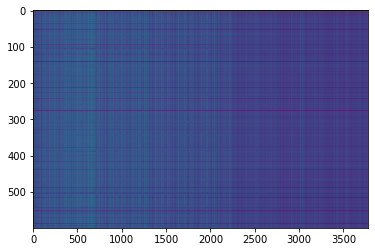

,AUC,pAUC
Source_0,0.736400,0.653158
Source_1,0.708500,0.646316
Source_2,0.787900,0.742632
Target_0,0.635600,0.657368
Target_1,0.801200,0.568421
Target_2,0.532000,0.511053
mean,0.700267,0.629825
h_mean,0.686520,0.620987


2021-05-30 02:56:30,758 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:27225.702148, val_AUC_hmean:0.686520, val_pAUC_hmean:0.620987, best_flag:True
2021-05-30 02:56:30,759 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.04it/s]
2021-05-30 02:56:31,465 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 90.52it/s]
2021-05-30 02:56:31,505 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.62it/s]
2021-05-30 02:56:31,548 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:26591.244954, val_AUC_hmean:0.698860, val_pAUC_hmean:0.613819, best_flag:False
2021-05-30 02:56:31,549 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.03it/s]
2021-05-30 02:56:32,256 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.02it/s]
2021-05-30 02:56:32,296 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.73it/s]
2021-05-30 02

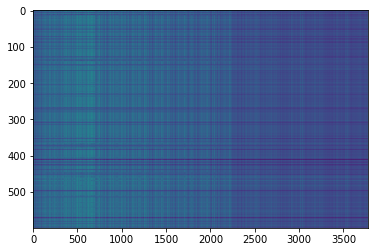

,AUC,pAUC
Source_0,0.757300,0.648421
Source_1,0.736300,0.650000
Source_2,0.825700,0.737895
Target_0,0.699000,0.667895
Target_1,0.806400,0.589474
Target_2,0.474600,0.509474
mean,0.716550,0.633860
h_mean,0.692245,0.625498


2021-05-30 02:56:34,644 - pytorch_modeler.py - INFO - epoch:37/300, train_losses:25532.652832, val_AUC_hmean:0.692245, val_pAUC_hmean:0.625498, best_flag:True
2021-05-30 02:56:34,645 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.55it/s]
2021-05-30 02:56:35,332 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.47it/s]
2021-05-30 02:56:35,384 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.96it/s]
2021-05-30 02:56:35,434 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:24983.366536, val_AUC_hmean:0.662969, val_pAUC_hmean:0.600086, best_flag:False
2021-05-30 02:56:35,436 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.64it/s]
2021-05-30 02:56:36,119 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.80it/s]
2021-05-30 02:56:36,173 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.76it/s]
2021-05-30 02

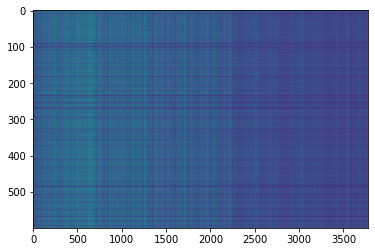

,AUC,pAUC
Source_0,0.746800,0.656842
Source_1,0.735400,0.641053
Source_2,0.844800,0.735789
Target_0,0.689500,0.674211
Target_1,0.812700,0.598421
Target_2,0.498000,0.517895
mean,0.721200,0.637368
h_mean,0.700003,0.629814


2021-05-30 02:56:40,056 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:22903.606771, val_AUC_hmean:0.700003, val_pAUC_hmean:0.629814, best_flag:True
2021-05-30 02:56:40,056 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.98it/s]
2021-05-30 02:56:40,726 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.60it/s]
2021-05-30 02:56:40,779 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.94it/s]
2021-05-30 02:56:40,833 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:22512.182780, val_AUC_hmean:0.675271, val_pAUC_hmean:0.589655, best_flag:False
2021-05-30 02:56:40,835 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.10it/s]
2021-05-30 02:56:41,500 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.98it/s]
2021-05-30 02:56:41,553 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.00it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 55.99it/s]
2021-05-30 02:56:53,226 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.64it/s]
2021-05-30 02:56:53,276 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:16161.586263, val_AUC_hmean:0.700857, val_pAUC_hmean:0.622774, best_flag:False
2021-05-30 02:56:53,277 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.94it/s]
2021-05-30 02:56:53,948 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.32it/s]
2021-05-30 02:56:54,000 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.09it/s]
2021-05-30 02:56:54,051 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:15925.866943, val_AUC_hmean:0.684321, val_pAUC_hmean:0.621037, best_flag:False
2021-05-30 02:56:54,052 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.13it/s]
2021-05-30 02:56:54,716 - pytorch_modeler.py - INFO - valid_source
100%|███████

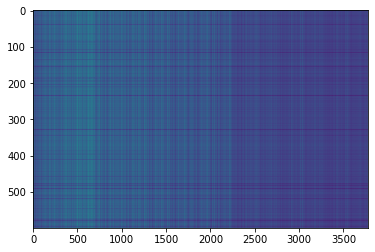

,AUC,pAUC
Source_0,0.782700,0.647895
Source_1,0.773800,0.675789
Source_2,0.807200,0.723158
Target_0,0.689900,0.657368
Target_1,0.846600,0.606842
Target_2,0.531400,0.516842
mean,0.738600,0.637982
h_mean,0.721041,0.630918


2021-05-30 02:57:04,160 - pytorch_modeler.py - INFO - epoch:71/300, train_losses:12939.257080, val_AUC_hmean:0.721041, val_pAUC_hmean:0.630918, best_flag:True
2021-05-30 02:57:04,161 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.61it/s]
2021-05-30 02:57:04,845 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.91it/s]
2021-05-30 02:57:04,899 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.59it/s]
2021-05-30 02:57:04,954 - pytorch_modeler.py - INFO - epoch:72/300, train_losses:12633.690430, val_AUC_hmean:0.696679, val_pAUC_hmean:0.627246, best_flag:False
2021-05-30 02:57:04,955 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.08it/s]
2021-05-30 02:57:05,621 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.66it/s]
2021-05-30 02:57:05,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.48it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 54.98it/s]
2021-05-30 02:57:17,220 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.78it/s]
2021-05-30 02:57:17,271 - pytorch_modeler.py - INFO - epoch:88/300, train_losses:9227.450358, val_AUC_hmean:0.643414, val_pAUC_hmean:0.623233, best_flag:False
2021-05-30 02:57:17,272 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.11it/s]
2021-05-30 02:57:17,937 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.54it/s]
2021-05-30 02:57:17,991 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.46it/s]
2021-05-30 02:57:18,043 - pytorch_modeler.py - INFO - epoch:89/300, train_losses:9175.893636, val_AUC_hmean:0.702254, val_pAUC_hmean:0.627763, best_flag:False
2021-05-30 02:57:18,044 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.24it/s]
2021-05-30 02:57:18,785 - pytorch_modeler.py - INFO - valid_source
100%|█████████

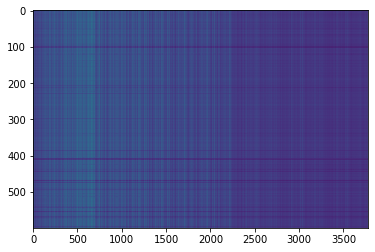

,AUC,pAUC
Source_0,0.773300,0.647895
Source_1,0.725300,0.651053
Source_2,0.845200,0.728421
Target_0,0.674600,0.662105
Target_1,0.831200,0.597895
Target_2,0.508100,0.539474
mean,0.726283,0.637807
h_mean,0.705168,0.632325


2021-05-30 02:57:27,455 - pytorch_modeler.py - INFO - epoch:99/300, train_losses:7520.252645, val_AUC_hmean:0.705168, val_pAUC_hmean:0.632325, best_flag:True
2021-05-30 02:57:27,456 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.27it/s]
2021-05-30 02:57:28,115 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.25it/s]
2021-05-30 02:57:28,168 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.94it/s]
2021-05-30 02:57:28,220 - pytorch_modeler.py - INFO - epoch:100/300, train_losses:7395.129924, val_AUC_hmean:0.669218, val_pAUC_hmean:0.622597, best_flag:False
2021-05-30 02:57:28,221 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.99it/s]
2021-05-30 02:57:28,891 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.83it/s]
2021-05-30 02:57:28,945 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.57it/s]
2021-05-30 02:

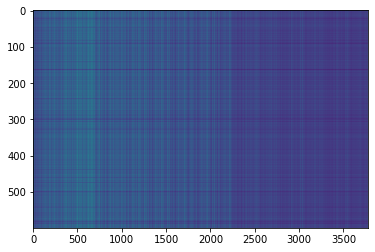

,AUC,pAUC
Source_0,0.773400,0.650000
Source_1,0.748000,0.661053
Source_2,0.848500,0.738421
Target_0,0.693400,0.664211
Target_1,0.840400,0.606842
Target_2,0.463100,0.522105
mean,0.727800,0.640439
h_mean,0.697684,0.633300


2021-05-30 02:57:40,731 - pytorch_modeler.py - INFO - epoch:114/300, train_losses:5588.166219, val_AUC_hmean:0.697684, val_pAUC_hmean:0.633300, best_flag:True
2021-05-30 02:57:40,733 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.61it/s]
2021-05-30 02:57:41,417 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.47it/s]
2021-05-30 02:57:41,470 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.98it/s]
2021-05-30 02:57:41,522 - pytorch_modeler.py - INFO - epoch:115/300, train_losses:5494.935465, val_AUC_hmean:0.650641, val_pAUC_hmean:0.631731, best_flag:False
2021-05-30 02:57:41,523 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.06it/s]
2021-05-30 02:57:42,190 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.42it/s]
2021-05-30 02:57:42,244 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.69it/s]


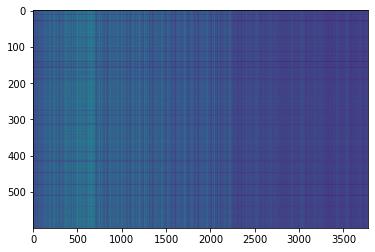

,AUC,pAUC
Source_0,0.79100,0.655263
Source_1,0.74970,0.651579
Source_2,0.83870,0.738947
Target_0,0.69670,0.664211
Target_1,0.84760,0.621579
Target_2,0.40740,0.523158
mean,0.72185,0.642456
h_mean,0.67719,0.635598


2021-05-30 02:57:43,838 - pytorch_modeler.py - INFO - epoch:116/300, train_losses:5448.030802, val_AUC_hmean:0.677190, val_pAUC_hmean:0.635598, best_flag:True
2021-05-30 02:57:43,839 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 02:57:44,509 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.22it/s]
2021-05-30 02:57:44,564 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.58it/s]
2021-05-30 02:57:44,616 - pytorch_modeler.py - INFO - epoch:117/300, train_losses:5295.400431, val_AUC_hmean:0.677706, val_pAUC_hmean:0.620645, best_flag:False
2021-05-30 02:57:44,617 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.09it/s]
2021-05-30 02:57:45,282 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.16it/s]
2021-05-30 02:57:45,334 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.50it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 54.96it/s]
2021-05-30 02:57:57,037 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.30it/s]
2021-05-30 02:57:57,090 - pytorch_modeler.py - INFO - epoch:133/300, train_losses:3891.355001, val_AUC_hmean:0.696243, val_pAUC_hmean:0.624967, best_flag:False
2021-05-30 02:57:57,091 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.07it/s]
2021-05-30 02:57:57,757 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.67it/s]
2021-05-30 02:57:57,810 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.16it/s]
2021-05-30 02:57:57,860 - pytorch_modeler.py - INFO - epoch:134/300, train_losses:3904.363281, val_AUC_hmean:0.636717, val_pAUC_hmean:0.617045, best_flag:False
2021-05-30 02:57:57,861 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.05it/s]
2021-05-30 02:57:58,529 - pytorch_modeler.py - INFO - valid_source
100%|███████

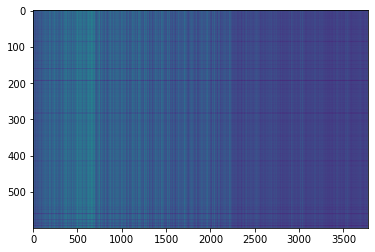

,AUC,pAUC
Source_0,0.77650,0.652632
Source_1,0.73960,0.650526
Source_2,0.85530,0.744737
Target_0,0.65910,0.667895
Target_1,0.84250,0.616842
Target_2,0.44610,0.530526
mean,0.71985,0.643860
h_mean,0.68533,0.637243


2021-05-30 02:58:06,331 - pytorch_modeler.py - INFO - epoch:143/300, train_losses:3195.240845, val_AUC_hmean:0.685330, val_pAUC_hmean:0.637243, best_flag:True
2021-05-30 02:58:06,332 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.65it/s]
2021-05-30 02:58:07,014 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.79it/s]
2021-05-30 02:58:07,070 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.32it/s]
2021-05-30 02:58:07,119 - pytorch_modeler.py - INFO - epoch:144/300, train_losses:3119.102926, val_AUC_hmean:0.688477, val_pAUC_hmean:0.634483, best_flag:False
2021-05-30 02:58:07,120 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.35it/s]
2021-05-30 02:58:07,777 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.88it/s]
2021-05-30 02:58:07,818 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.15it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 53.72it/s]
2021-05-30 02:58:19,654 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.66it/s]
2021-05-30 02:58:19,704 - pytorch_modeler.py - INFO - epoch:160/300, train_losses:2291.308065, val_AUC_hmean:0.693730, val_pAUC_hmean:0.636387, best_flag:False
2021-05-30 02:58:19,705 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.04it/s]
2021-05-30 02:58:20,373 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.62it/s]
2021-05-30 02:58:20,428 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.29it/s]


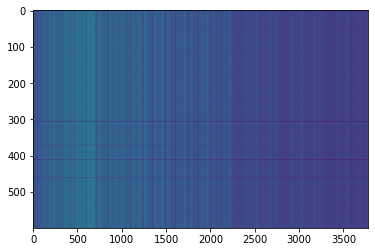

,AUC,pAUC
Source_0,0.791400,0.667895
Source_1,0.747300,0.648947
Source_2,0.843000,0.732105
Target_0,0.710400,0.668421
Target_1,0.848700,0.638947
Target_2,0.328000,0.514737
mean,0.711467,0.645175
h_mean,0.636761,0.637755


2021-05-30 02:58:21,977 - pytorch_modeler.py - INFO - epoch:161/300, train_losses:2298.219788, val_AUC_hmean:0.636761, val_pAUC_hmean:0.637755, best_flag:True
2021-05-30 02:58:21,978 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.05it/s]
2021-05-30 02:58:22,610 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.53it/s]
2021-05-30 02:58:22,659 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 95.92it/s]
2021-05-30 02:58:22,698 - pytorch_modeler.py - INFO - epoch:162/300, train_losses:2340.624715, val_AUC_hmean:0.707334, val_pAUC_hmean:0.637093, best_flag:False
2021-05-30 02:58:22,699 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.59it/s]
2021-05-30 02:58:23,153 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.08it/s]
2021-05-30 02:58:23,189 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.61it/s]
2021-05-30 02

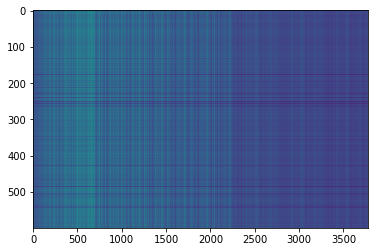

,AUC,pAUC
Source_0,0.762700,0.656316
Source_1,0.744500,0.661579
Source_2,0.849000,0.735789
Target_0,0.655100,0.652105
Target_1,0.858600,0.651579
Target_2,0.422800,0.524211
mean,0.715450,0.646930
h_mean,0.675027,0.640332


2021-05-30 02:58:30,139 - pytorch_modeler.py - INFO - epoch:172/300, train_losses:1852.396759, val_AUC_hmean:0.675027, val_pAUC_hmean:0.640332, best_flag:True
2021-05-30 02:58:30,140 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.82it/s]
2021-05-30 02:58:30,590 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.58it/s]
2021-05-30 02:58:30,633 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.24it/s]
2021-05-30 02:58:30,682 - pytorch_modeler.py - INFO - epoch:173/300, train_losses:1812.131358, val_AUC_hmean:0.665815, val_pAUC_hmean:0.635941, best_flag:False
2021-05-30 02:58:30,683 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.19it/s]
2021-05-30 02:58:31,384 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.84it/s]
2021-05-30 02:58:31,435 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.23it/s]
2021-05-30 0

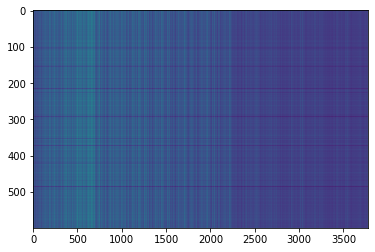

,AUC,pAUC
Source_0,0.750400,0.656316
Source_1,0.760900,0.652105
Source_2,0.826000,0.730526
Target_0,0.674800,0.661579
Target_1,0.856800,0.661053
Target_2,0.448300,0.525263
mean,0.719533,0.647807
h_mean,0.686718,0.641429


2021-05-30 02:58:39,938 - pytorch_modeler.py - INFO - epoch:185/300, train_losses:1432.474955, val_AUC_hmean:0.686718, val_pAUC_hmean:0.641429, best_flag:True
2021-05-30 02:58:39,939 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.18it/s]
2021-05-30 02:58:40,399 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.41it/s]
2021-05-30 02:58:40,442 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.15it/s]
2021-05-30 02:58:40,480 - pytorch_modeler.py - INFO - epoch:186/300, train_losses:1414.062337, val_AUC_hmean:0.676199, val_pAUC_hmean:0.632386, best_flag:False
2021-05-30 02:58:40,482 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 25.03it/s]
2021-05-30 02:58:40,963 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.32it/s]
2021-05-30 02:58:41,015 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.82it/s]
2021-05-30 02

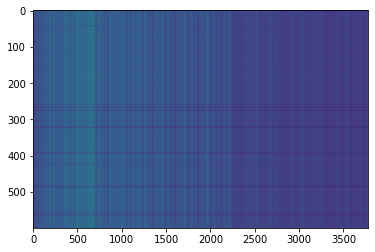

,AUC,pAUC
Source_0,0.761500,0.650526
Source_1,0.761700,0.651053
Source_2,0.823600,0.734737
Target_0,0.668400,0.648421
Target_1,0.875300,0.685263
Target_2,0.439800,0.530000
mean,0.721717,0.650000
h_mean,0.685513,0.643603


2021-05-30 02:58:45,762 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:1320.182017, val_AUC_hmean:0.685513, val_pAUC_hmean:0.643603, best_flag:True
2021-05-30 02:58:45,763 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.31it/s]
2021-05-30 02:58:46,458 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.70it/s]
2021-05-30 02:58:46,513 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.38it/s]
2021-05-30 02:58:46,558 - pytorch_modeler.py - INFO - epoch:192/300, train_losses:1326.666148, val_AUC_hmean:0.691006, val_pAUC_hmean:0.628335, best_flag:False
2021-05-30 02:58:46,559 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.29it/s]
2021-05-30 02:58:47,255 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.21it/s]
2021-05-30 02:58:47,306 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.61it/s]
2021-05-30 02

100%|██████████| 2/2 [00:00<00:00, 53.40it/s]
2021-05-30 02:58:56,981 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.82it/s]
2021-05-30 02:58:57,033 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:975.749186, val_AUC_hmean:0.689831, val_pAUC_hmean:0.630930, best_flag:False
2021-05-30 02:58:57,034 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.10it/s]
2021-05-30 02:58:57,699 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.44it/s]
2021-05-30 02:58:57,753 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.42it/s]
2021-05-30 02:58:57,803 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:996.352234, val_AUC_hmean:0.690314, val_pAUC_hmean:0.634167, best_flag:False
2021-05-30 02:58:57,804 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.59it/s]
2021-05-30 02:58:58,419 - pytorch_modeler.py - INFO - valid_source
100%|█████████

2021-05-30 02:59:07,892 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.88it/s]
2021-05-30 02:59:08,340 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 95.92it/s]
2021-05-30 02:59:08,378 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.81it/s]
2021-05-30 02:59:08,424 - pytorch_modeler.py - INFO - epoch:225/300, train_losses:857.861333, val_AUC_hmean:0.690144, val_pAUC_hmean:0.607735, best_flag:False
2021-05-30 02:59:08,424 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.88it/s]
2021-05-30 02:59:08,873 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.38it/s]
2021-05-30 02:59:08,917 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.65it/s]
2021-05-30 02:59:08,957 - pytorch_modeler.py - INFO - epoch:226/300, train_losses:837.446716, val_AUC_hmean:0.660574, val_pAUC_hmean:0.606741, best_flag:False
2021-05-30 02:

100%|██████████| 2/2 [00:00<00:00, 60.88it/s]
2021-05-30 02:59:19,961 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:581.059252, val_AUC_hmean:0.661357, val_pAUC_hmean:0.617757, best_flag:False
2021-05-30 02:59:19,962 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 02:59:20,632 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.65it/s]
2021-05-30 02:59:20,685 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.62it/s]
2021-05-30 02:59:20,737 - pytorch_modeler.py - INFO - epoch:242/300, train_losses:604.713720, val_AUC_hmean:0.669593, val_pAUC_hmean:0.624271, best_flag:False
2021-05-30 02:59:20,738 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.00it/s]
2021-05-30 02:59:21,407 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.32it/s]
2021-05-30 02:59:21,461 - pytorch_modeler.py - INFO - valid_target
100%|█████████

100%|██████████| 12/12 [00:00<00:00, 16.29it/s]
2021-05-30 02:59:33,066 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.08it/s]
2021-05-30 02:59:33,120 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.48it/s]
2021-05-30 02:59:33,178 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:483.939967, val_AUC_hmean:0.648997, val_pAUC_hmean:0.618150, best_flag:False
2021-05-30 02:59:33,179 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.49it/s]
2021-05-30 02:59:33,867 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.25it/s]
2021-05-30 02:59:33,906 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.32it/s]
2021-05-30 02:59:33,947 - pytorch_modeler.py - INFO - epoch:259/300, train_losses:472.897174, val_AUC_hmean:0.666702, val_pAUC_hmean:0.623997, best_flag:False
2021-05-30 02:59:33,948 - pytorch_modeler.py - INFO - train
100%|█████████

2021-05-30 02:59:44,875 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.12it/s]
2021-05-30 02:59:45,539 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.12it/s]
2021-05-30 02:59:45,594 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.35it/s]
2021-05-30 02:59:45,645 - pytorch_modeler.py - INFO - epoch:275/300, train_losses:340.969027, val_AUC_hmean:0.654215, val_pAUC_hmean:0.619415, best_flag:False
2021-05-30 02:59:45,646 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.12it/s]
2021-05-30 02:59:46,311 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.89it/s]
2021-05-30 02:59:46,365 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.70it/s]
2021-05-30 02:59:46,417 - pytorch_modeler.py - INFO - epoch:276/300, train_losses:337.132833, val_AUC_hmean:0.681147, val_pAUC_hmean:0.630722, best_flag:False
2021-05-30 02:

100%|██████████| 2/2 [00:00<00:00, 65.19it/s]
2021-05-30 02:59:58,071 - pytorch_modeler.py - INFO - epoch:291/300, train_losses:294.755644, val_AUC_hmean:0.651687, val_pAUC_hmean:0.626167, best_flag:False
2021-05-30 02:59:58,073 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.25it/s]
2021-05-30 02:59:58,732 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.07it/s]
2021-05-30 02:59:58,785 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.78it/s]
2021-05-30 02:59:58,836 - pytorch_modeler.py - INFO - epoch:292/300, train_losses:279.422708, val_AUC_hmean:0.671047, val_pAUC_hmean:0.632957, best_flag:False
2021-05-30 02:59:58,837 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.91it/s]
2021-05-30 02:59:59,509 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.74it/s]
2021-05-30 02:59:59,564 - pytorch_modeler.py - INFO - valid_target
100%|█████████

,AUC,pAUC
Source_0,0.761500,0.650526
Source_1,0.761700,0.651053
Source_2,0.823600,0.734737
Target_0,0.668400,0.648421
Target_1,0.875300,0.685263
Target_2,0.439800,0.530000
mean,0.721717,0.650000
h_mean,0.685513,0.643603


2021-05-30 03:00:05,114 - 00_train.py - INFO - TARGET MACHINE_TYPE: slider
2021-05-30 03:00:05,115 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 03:00:05,135 - 00_train.py - INFO - TRAINING


elapsed time: 261.753378153 [sec]


2021-05-30 03:00:05,563 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 17.21it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 17.59it/s]
2021-05-30 03:00:06,247 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.46it/s]
2021-05-30 03:00:06,301 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.80it/s]


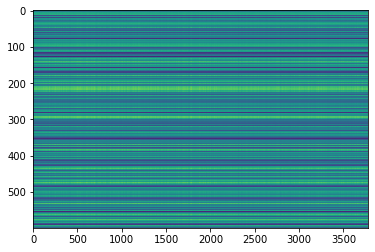

,AUC,pAUC
Source_0,0.555200,0.546842
Source_1,0.577200,0.567368
Source_2,0.665700,0.568421
Target_0,0.539700,0.599474
Target_1,0.671100,0.575789
Target_2,0.618600,0.499474
mean,0.604583,0.559561
h_mean,0.600279,0.557753


2021-05-30 03:00:07,823 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:134271.899089, val_AUC_hmean:0.600279, val_pAUC_hmean:0.557753, best_flag:True
2021-05-30 03:00:07,825 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.80it/s]
2021-05-30 03:00:08,501 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.61it/s]
2021-05-30 03:00:08,565 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.30it/s]


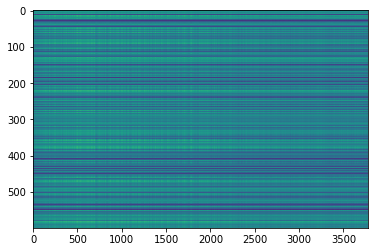

,AUC,pAUC
Source_0,0.590300,0.564737
Source_1,0.640200,0.573158
Source_2,0.612200,0.543684
Target_0,0.570500,0.622105
Target_1,0.742200,0.597368
Target_2,0.561200,0.511579
mean,0.619433,0.568772
h_mean,0.614024,0.566522


2021-05-30 03:00:10,097 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:84716.558594, val_AUC_hmean:0.614024, val_pAUC_hmean:0.566522, best_flag:True
2021-05-30 03:00:10,098 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.17it/s]
2021-05-30 03:00:10,798 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.94it/s]
2021-05-30 03:00:10,838 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 91.38it/s]


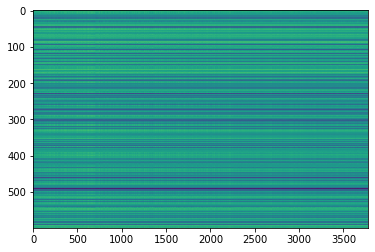

,AUC,pAUC
Source_0,0.618600,0.564737
Source_1,0.674000,0.599474
Source_2,0.712500,0.591579
Target_0,0.608100,0.613684
Target_1,0.687200,0.567895
Target_2,0.646500,0.505263
mean,0.657817,0.573772
h_mean,0.655725,0.571493


2021-05-30 03:00:12,396 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:73477.009115, val_AUC_hmean:0.655725, val_pAUC_hmean:0.571493, best_flag:True
2021-05-30 03:00:12,397 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.76it/s]
2021-05-30 03:00:13,074 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.89it/s]
2021-05-30 03:00:13,129 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.91it/s]
2021-05-30 03:00:13,177 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:67285.026693, val_AUC_hmean:0.648023, val_pAUC_hmean:0.558484, best_flag:False
2021-05-30 03:00:13,179 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.75it/s]
2021-05-30 03:00:13,856 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.71it/s]
2021-05-30 03:00:13,909 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.12it/s]
2021-05-30 03:0

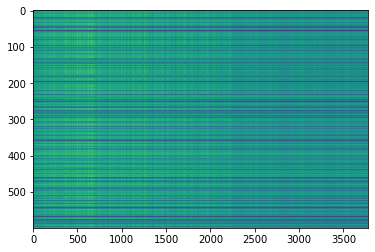

,AUC,pAUC
Source_0,0.767600,0.633684
Source_1,0.708800,0.612632
Source_2,0.758800,0.639474
Target_0,0.753100,0.655789
Target_1,0.680600,0.501579
Target_2,0.602600,0.503158
mean,0.711917,0.591053
h_mean,0.706874,0.583647


2021-05-30 03:00:18,569 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:51834.588216, val_AUC_hmean:0.706874, val_pAUC_hmean:0.583647, best_flag:True
2021-05-30 03:00:18,570 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.78it/s]
2021-05-30 03:00:19,247 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.75it/s]
2021-05-30 03:00:19,301 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.26it/s]
2021-05-30 03:00:19,352 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:49763.387044, val_AUC_hmean:0.689280, val_pAUC_hmean:0.572697, best_flag:False
2021-05-30 03:00:19,353 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.00it/s]
2021-05-30 03:00:20,022 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.54it/s]
2021-05-30 03:00:20,075 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.15it/s]
2021-05-30 03:

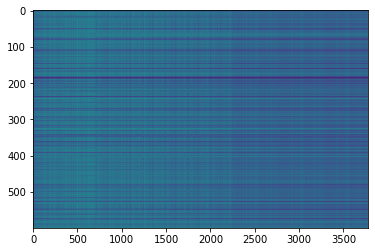

,AUC,pAUC
Source_0,0.708600,0.609474
Source_1,0.714100,0.622632
Source_2,0.820700,0.697368
Target_0,0.687200,0.655789
Target_1,0.692200,0.506316
Target_2,0.582100,0.498947
mean,0.700817,0.598421
h_mean,0.693815,0.589104


2021-05-30 03:00:23,274 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:44164.937500, val_AUC_hmean:0.693815, val_pAUC_hmean:0.589104, best_flag:True
2021-05-30 03:00:23,275 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.15it/s]
2021-05-30 03:00:23,938 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.04it/s]
2021-05-30 03:00:23,993 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.22it/s]


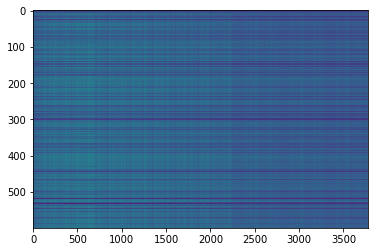

,AUC,pAUC
Source_0,0.729900,0.614211
Source_1,0.677800,0.602632
Source_2,0.850100,0.730526
Target_0,0.721700,0.641579
Target_1,0.675900,0.511053
Target_2,0.492000,0.498947
mean,0.691233,0.599825
h_mean,0.672692,0.589623


2021-05-30 03:00:25,677 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:42635.733073, val_AUC_hmean:0.672692, val_pAUC_hmean:0.589623, best_flag:True
2021-05-30 03:00:25,678 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.66it/s]
2021-05-30 03:00:26,130 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.28it/s]
2021-05-30 03:00:26,168 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.34it/s]


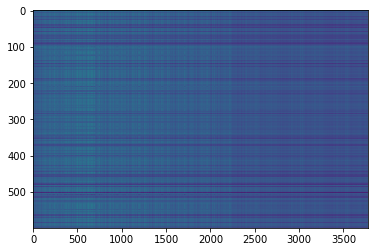

,AUC,pAUC
Source_0,0.747700,0.626842
Source_1,0.714800,0.611579
Source_2,0.835900,0.733684
Target_0,0.721800,0.666842
Target_1,0.693500,0.523158
Target_2,0.507050,0.499474
mean,0.703458,0.610263
h_mean,0.687103,0.599606


2021-05-30 03:00:27,809 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:41387.566732, val_AUC_hmean:0.687103, val_pAUC_hmean:0.599606, best_flag:True
2021-05-30 03:00:27,810 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.89it/s]
2021-05-30 03:00:28,483 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.45it/s]
2021-05-30 03:00:28,535 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.76it/s]


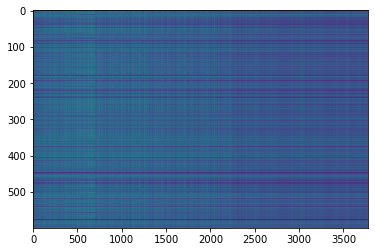

,AUC,pAUC
Source_0,0.770900,0.639474
Source_1,0.683800,0.595263
Source_2,0.812900,0.731053
Target_0,0.720600,0.667368
Target_1,0.692000,0.536842
Target_2,0.475600,0.496316
mean,0.692633,0.611053
h_mean,0.672255,0.600744


2021-05-30 03:00:30,119 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:39786.735677, val_AUC_hmean:0.672255, val_pAUC_hmean:0.600744, best_flag:True
2021-05-30 03:00:30,119 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.85it/s]
2021-05-30 03:00:30,794 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.39it/s]
2021-05-30 03:00:30,847 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.77it/s]
2021-05-30 03:00:30,898 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:38495.123372, val_AUC_hmean:0.698269, val_pAUC_hmean:0.597739, best_flag:False
2021-05-30 03:00:30,900 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.14it/s]
2021-05-30 03:00:31,563 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.42it/s]
2021-05-30 03:00:31,617 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.09it/s]


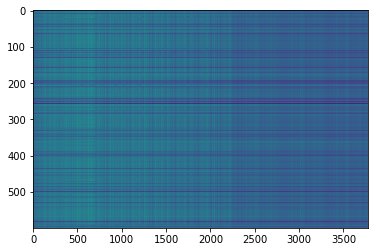

,AUC,pAUC
Source_0,0.782600,0.635263
Source_1,0.678100,0.597368
Source_2,0.814500,0.743684
Target_0,0.706600,0.650000
Target_1,0.698100,0.540526
Target_2,0.435600,0.515789
mean,0.685917,0.613772
h_mean,0.657634,0.604832


2021-05-30 03:00:33,200 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:37294.839844, val_AUC_hmean:0.657634, val_pAUC_hmean:0.604832, best_flag:True
2021-05-30 03:00:33,201 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.68it/s]
2021-05-30 03:00:33,882 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.53it/s]
2021-05-30 03:00:33,937 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.48it/s]
2021-05-30 03:00:33,988 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:36700.043945, val_AUC_hmean:0.655175, val_pAUC_hmean:0.598671, best_flag:False
2021-05-30 03:00:33,989 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.95it/s]
2021-05-30 03:00:34,660 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.13it/s]
2021-05-30 03:00:34,715 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.34it/s]
2021-05-30 03

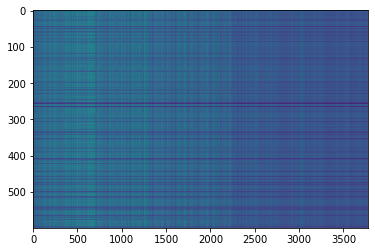

,AUC,pAUC
Source_0,0.768500,0.656842
Source_1,0.662600,0.574737
Source_2,0.842600,0.755263
Target_0,0.669000,0.657368
Target_1,0.715100,0.561579
Target_2,0.566800,0.530526
mean,0.704100,0.622719
h_mean,0.693264,0.613922


2021-05-30 03:00:39,431 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:31780.028158, val_AUC_hmean:0.693264, val_pAUC_hmean:0.613922, best_flag:True
2021-05-30 03:00:39,432 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.46it/s]
2021-05-30 03:00:40,084 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 16.05it/s]
2021-05-30 03:00:40,226 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.47it/s]
2021-05-30 03:00:40,274 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:30937.966634, val_AUC_hmean:0.672959, val_pAUC_hmean:0.608309, best_flag:False
2021-05-30 03:00:40,275 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.30it/s]
2021-05-30 03:00:40,933 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.79it/s]
2021-05-30 03:00:40,990 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.26it/s]
2021-05-30 03

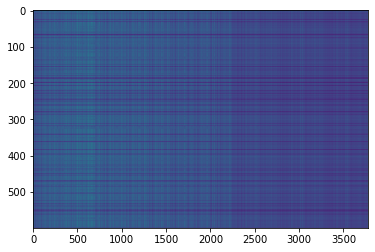

,AUC,pAUC
Source_0,0.780000,0.667368
Source_1,0.715900,0.631053
Source_2,0.869700,0.742632
Target_0,0.745500,0.657895
Target_1,0.744900,0.563158
Target_2,0.494200,0.501053
mean,0.725033,0.627193
h_mean,0.702903,0.617212


2021-05-30 03:00:44,170 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:28499.704915, val_AUC_hmean:0.702903, val_pAUC_hmean:0.617212, best_flag:True
2021-05-30 03:00:44,171 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.48it/s]
2021-05-30 03:00:44,860 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.61it/s]
2021-05-30 03:00:44,927 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.77it/s]
2021-05-30 03:00:44,980 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:27647.508138, val_AUC_hmean:0.687919, val_pAUC_hmean:0.605325, best_flag:False
2021-05-30 03:00:44,981 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.22it/s]
2021-05-30 03:00:45,641 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.37it/s]
2021-05-30 03:00:45,695 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.26it/s]


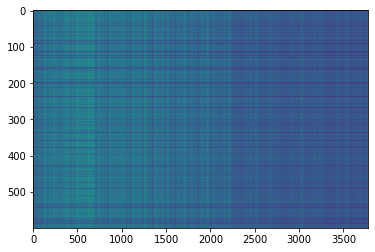

,AUC,pAUC
Source_0,0.775300,0.645263
Source_1,0.703600,0.644737
Source_2,0.824300,0.741053
Target_0,0.669900,0.662105
Target_1,0.763500,0.578947
Target_2,0.510100,0.497368
mean,0.707783,0.628246
h_mean,0.690675,0.618659


2021-05-30 03:00:47,288 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:27006.507487, val_AUC_hmean:0.690675, val_pAUC_hmean:0.618659, best_flag:True
2021-05-30 03:00:47,289 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.28it/s]
2021-05-30 03:00:47,986 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.96it/s]
2021-05-30 03:00:48,026 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.53it/s]
2021-05-30 03:00:48,084 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:26362.085775, val_AUC_hmean:0.698020, val_pAUC_hmean:0.599543, best_flag:False
2021-05-30 03:00:48,085 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.55it/s]
2021-05-30 03:00:48,771 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 93.62it/s]
2021-05-30 03:00:48,810 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.90it/s]
2021-05-30 03

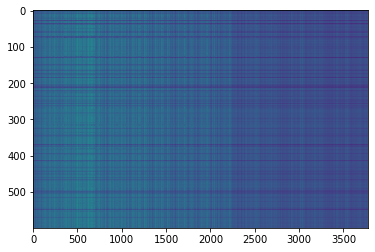

,AUC,pAUC
Source_0,0.730800,0.641053
Source_1,0.750000,0.657368
Source_2,0.808400,0.733158
Target_0,0.704400,0.649474
Target_1,0.789300,0.602632
Target_2,0.435000,0.507368
mean,0.702983,0.631842
h_mean,0.672333,0.624014


2021-05-30 03:00:51,213 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:25283.214193, val_AUC_hmean:0.672333, val_pAUC_hmean:0.624014, best_flag:True
2021-05-30 03:00:51,214 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.24it/s]
2021-05-30 03:00:51,912 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.58it/s]
2021-05-30 03:00:51,954 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.55it/s]
2021-05-30 03:00:51,995 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:24893.440267, val_AUC_hmean:0.652141, val_pAUC_hmean:0.593179, best_flag:False
2021-05-30 03:00:51,996 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.89it/s]
2021-05-30 03:00:52,670 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.83it/s]
2021-05-30 03:00:52,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 94.80it/s]


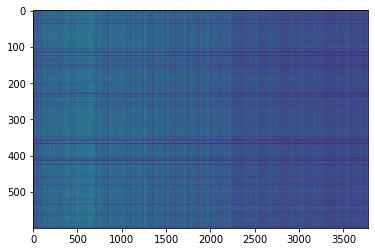

,AUC,pAUC
Source_0,0.74120,0.656842
Source_1,0.76100,0.670526
Source_2,0.81140,0.734737
Target_0,0.73020,0.660526
Target_1,0.81080,0.588421
Target_2,0.49090,0.510000
mean,0.72425,0.636842
h_mean,0.70294,0.628336


2021-05-30 03:00:54,257 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:24135.585612, val_AUC_hmean:0.702940, val_pAUC_hmean:0.628336, best_flag:True
2021-05-30 03:00:54,258 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.71it/s]
2021-05-30 03:00:54,938 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.86it/s]
2021-05-30 03:00:54,992 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.71it/s]
2021-05-30 03:00:55,043 - pytorch_modeler.py - INFO - epoch:36/300, train_losses:23621.303874, val_AUC_hmean:0.679883, val_pAUC_hmean:0.613157, best_flag:False
2021-05-30 03:00:55,044 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.03it/s]
2021-05-30 03:00:55,712 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.16it/s]
2021-05-30 03:00:55,765 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.53it/s]
2021-05-30 03

100%|██████████| 2/2 [00:00<00:00, 56.84it/s]
2021-05-30 03:01:07,606 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.77it/s]
2021-05-30 03:01:07,657 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:17071.189290, val_AUC_hmean:0.707077, val_pAUC_hmean:0.603116, best_flag:False
2021-05-30 03:01:07,658 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.63it/s]
2021-05-30 03:01:08,340 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.72it/s]
2021-05-30 03:01:08,391 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.08it/s]
2021-05-30 03:01:08,443 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:16413.790283, val_AUC_hmean:0.695418, val_pAUC_hmean:0.613457, best_flag:False
2021-05-30 03:01:08,444 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.34it/s]
2021-05-30 03:01:09,100 - pytorch_modeler.py - INFO - valid_source
100%|███████

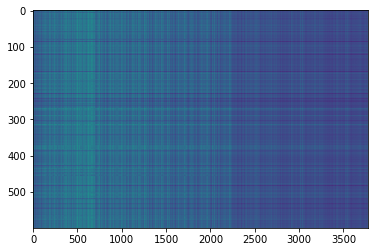

,AUC,pAUC
Source_0,0.778600,0.654211
Source_1,0.717250,0.652105
Source_2,0.838200,0.743158
Target_0,0.692900,0.670526
Target_1,0.834500,0.601053
Target_2,0.509200,0.518421
mean,0.728442,0.639912
h_mean,0.707798,0.632130


2021-05-30 03:01:14,659 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:14241.014486, val_AUC_hmean:0.707798, val_pAUC_hmean:0.632130, best_flag:True
2021-05-30 03:01:14,659 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.03it/s]
2021-05-30 03:01:15,327 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.31it/s]
2021-05-30 03:01:15,380 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.80it/s]
2021-05-30 03:01:15,433 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:13879.292969, val_AUC_hmean:0.652503, val_pAUC_hmean:0.622228, best_flag:False
2021-05-30 03:01:15,434 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.04it/s]
2021-05-30 03:01:16,101 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.88it/s]
2021-05-30 03:01:16,154 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.70it/s]
2021-05-30 03

100%|██████████| 2/2 [00:00<00:00, 56.39it/s]
2021-05-30 03:01:27,756 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.76it/s]
2021-05-30 03:01:27,808 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:9921.683838, val_AUC_hmean:0.667781, val_pAUC_hmean:0.627933, best_flag:False
2021-05-30 03:01:27,809 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.00it/s]
2021-05-30 03:01:28,477 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.50it/s]
2021-05-30 03:01:28,529 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.39it/s]
2021-05-30 03:01:28,581 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:9818.978353, val_AUC_hmean:0.690117, val_pAUC_hmean:0.617819, best_flag:False
2021-05-30 03:01:28,582 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.04it/s]
2021-05-30 03:01:29,250 - pytorch_modeler.py - INFO - valid_source
100%|█████████

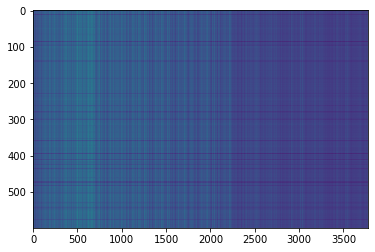

,AUC,pAUC
Source_0,0.795300,0.668947
Source_1,0.742100,0.659474
Source_2,0.850500,0.730000
Target_0,0.713800,0.664737
Target_1,0.830000,0.606316
Target_2,0.454000,0.514737
mean,0.730950,0.640702
h_mean,0.698559,0.633078


2021-05-30 03:01:35,693 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:8481.128988, val_AUC_hmean:0.698559, val_pAUC_hmean:0.633078, best_flag:True
2021-05-30 03:01:35,694 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.93it/s]
2021-05-30 03:01:36,365 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.30it/s]
2021-05-30 03:01:36,421 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.93it/s]
2021-05-30 03:01:36,471 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:8317.497762, val_AUC_hmean:0.687782, val_pAUC_hmean:0.631922, best_flag:False
2021-05-30 03:01:36,472 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.00it/s]
2021-05-30 03:01:37,141 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.82it/s]
2021-05-30 03:01:37,196 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.26it/s]
2021-05-30 03:0

100%|██████████| 2/2 [00:00<00:00, 55.88it/s]
2021-05-30 03:01:48,770 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.93it/s]
2021-05-30 03:01:48,821 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:5936.794718, val_AUC_hmean:0.666848, val_pAUC_hmean:0.632775, best_flag:False
2021-05-30 03:01:48,823 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.09it/s]
2021-05-30 03:01:49,570 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.98it/s]
2021-05-30 03:01:49,619 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.93it/s]
2021-05-30 03:01:49,666 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:5847.175049, val_AUC_hmean:0.682105, val_pAUC_hmean:0.628561, best_flag:False
2021-05-30 03:01:49,667 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.34it/s]
2021-05-30 03:01:50,362 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 03:02:01,255 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.10it/s]
2021-05-30 03:02:01,920 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.51it/s]
2021-05-30 03:02:01,973 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.65it/s]
2021-05-30 03:02:02,024 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:4203.562642, val_AUC_hmean:0.662062, val_pAUC_hmean:0.621837, best_flag:False
2021-05-30 03:02:02,025 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.80it/s]
2021-05-30 03:02:02,701 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.21it/s]
2021-05-30 03:02:02,753 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.77it/s]
2021-05-30 03:02:02,801 - pytorch_modeler.py - INFO - epoch:119/300, train_losses:4217.281799, val_AUC_hmean:0.669865, val_pAUC_hmean:0.630898, best_flag:False
2021-05-30 0

100%|██████████| 2/2 [00:00<00:00, 65.97it/s]
2021-05-30 03:02:14,466 - pytorch_modeler.py - INFO - epoch:134/300, train_losses:2990.513550, val_AUC_hmean:0.673733, val_pAUC_hmean:0.625985, best_flag:False
2021-05-30 03:02:14,467 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.15it/s]
2021-05-30 03:02:15,131 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.61it/s]
2021-05-30 03:02:15,185 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.51it/s]
2021-05-30 03:02:15,234 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:2958.947184, val_AUC_hmean:0.680123, val_pAUC_hmean:0.632889, best_flag:False
2021-05-30 03:02:15,235 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.04it/s]
2021-05-30 03:02:15,903 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.45it/s]
2021-05-30 03:02:15,958 - pytorch_modeler.py - INFO - valid_target
100%|███████

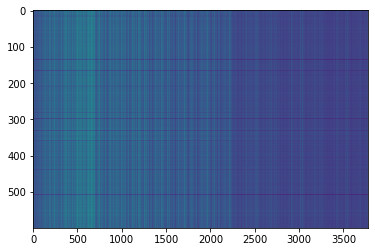

,AUC,pAUC
Source_0,0.789900,0.654211
Source_1,0.777700,0.670526
Source_2,0.850200,0.710526
Target_0,0.679700,0.651579
Target_1,0.851100,0.660000
Target_2,0.460200,0.511579
mean,0.734800,0.643070
h_mean,0.701986,0.636136


2021-05-30 03:02:22,276 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:2666.519857, val_AUC_hmean:0.701986, val_pAUC_hmean:0.636136, best_flag:True
2021-05-30 03:02:22,277 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.75it/s]
2021-05-30 03:02:22,956 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.07it/s]
2021-05-30 03:02:23,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.67it/s]
2021-05-30 03:02:23,063 - pytorch_modeler.py - INFO - epoch:143/300, train_losses:2524.113383, val_AUC_hmean:0.669971, val_pAUC_hmean:0.624558, best_flag:False
2021-05-30 03:02:23,064 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.55it/s]
2021-05-30 03:02:23,681 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.16it/s]
2021-05-30 03:02:23,734 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.27it/s]
2021-05-30 03

100%|██████████| 2/2 [00:00<00:00, 102.05it/s]
2021-05-30 03:02:34,143 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 22.06it/s]
2021-05-30 03:02:34,252 - pytorch_modeler.py - INFO - epoch:159/300, train_losses:1941.806173, val_AUC_hmean:0.679308, val_pAUC_hmean:0.621640, best_flag:False
2021-05-30 03:02:34,253 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.28it/s]
2021-05-30 03:02:34,695 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.49it/s]
2021-05-30 03:02:34,729 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.73it/s]
2021-05-30 03:02:34,765 - pytorch_modeler.py - INFO - epoch:160/300, train_losses:1878.445882, val_AUC_hmean:0.666152, val_pAUC_hmean:0.624371, best_flag:False
2021-05-30 03:02:34,766 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.18it/s]
2021-05-30 03:02:35,210 - pytorch_modeler.py - INFO - valid_source
100%|████

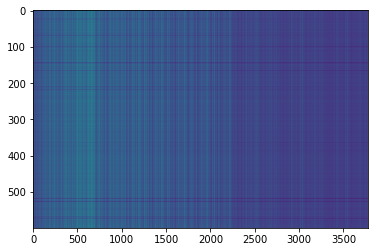

,AUC,pAUC
Source_0,0.773800,0.664737
Source_1,0.749000,0.669474
Source_2,0.840600,0.744737
Target_0,0.691900,0.680526
Target_1,0.828100,0.638421
Target_2,0.413000,0.517368
mean,0.716067,0.652544
h_mean,0.674821,0.644503


2021-05-30 03:02:37,719 - pytorch_modeler.py - INFO - epoch:163/300, train_losses:1730.656311, val_AUC_hmean:0.674821, val_pAUC_hmean:0.644503, best_flag:True
2021-05-30 03:02:37,720 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.06it/s]
2021-05-30 03:02:38,165 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.07it/s]
2021-05-30 03:02:38,200 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.73it/s]
2021-05-30 03:02:38,241 - pytorch_modeler.py - INFO - epoch:164/300, train_losses:1621.768585, val_AUC_hmean:0.680485, val_pAUC_hmean:0.631079, best_flag:False
2021-05-30 03:02:38,242 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.22it/s]
2021-05-30 03:02:38,684 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.47it/s]
2021-05-30 03:02:38,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.06it/s]
2021-05-30

100%|██████████| 12/12 [00:00<00:00, 27.40it/s]
2021-05-30 03:02:46,368 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.68it/s]
2021-05-30 03:02:46,402 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.79it/s]
2021-05-30 03:02:46,437 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:1185.833588, val_AUC_hmean:0.676731, val_pAUC_hmean:0.644440, best_flag:False
2021-05-30 03:02:46,438 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 03:02:46,877 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.34it/s]
2021-05-30 03:02:46,910 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 98.20it/s]
2021-05-30 03:02:46,948 - pytorch_modeler.py - INFO - epoch:181/300, train_losses:1186.592026, val_AUC_hmean:0.669918, val_pAUC_hmean:0.637284, best_flag:False
2021-05-30 03:02:46,949 - pytorch_modeler.py - INFO - train
100%|████

2021-05-30 03:02:54,674 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.58it/s]
2021-05-30 03:02:55,111 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.99it/s]
2021-05-30 03:02:55,145 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.05it/s]
2021-05-30 03:02:55,182 - pytorch_modeler.py - INFO - epoch:197/300, train_losses:816.567210, val_AUC_hmean:0.682764, val_pAUC_hmean:0.640485, best_flag:False
2021-05-30 03:02:55,183 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.39it/s]
2021-05-30 03:02:55,623 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 94.08it/s]
2021-05-30 03:02:55,660 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.06it/s]
2021-05-30 03:02:55,696 - pytorch_modeler.py - INFO - epoch:198/300, train_losses:859.481323, val_AUC_hmean:0.676252, val_pAUC_hmean:0.635805, best_flag:False
2021-05-30 

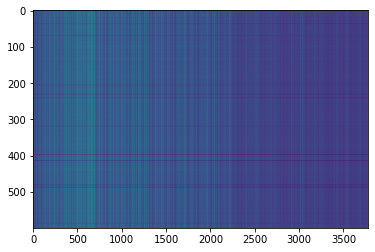

,AUC,pAUC
Source_0,0.762100,0.660000
Source_1,0.751100,0.663684
Source_2,0.856400,0.743684
Target_0,0.662200,0.675789
Target_1,0.840900,0.655789
Target_2,0.427500,0.516316
mean,0.716700,0.652544
h_mean,0.677987,0.644608


2021-05-30 03:02:57,601 - pytorch_modeler.py - INFO - epoch:199/300, train_losses:816.897497, val_AUC_hmean:0.677987, val_pAUC_hmean:0.644608, best_flag:True
2021-05-30 03:02:57,601 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.72it/s]
2021-05-30 03:02:58,036 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.40it/s]
2021-05-30 03:02:58,070 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.32it/s]
2021-05-30 03:02:58,105 - pytorch_modeler.py - INFO - epoch:200/300, train_losses:822.704478, val_AUC_hmean:0.659604, val_pAUC_hmean:0.641161, best_flag:False
2021-05-30 03:02:58,107 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.21it/s]
2021-05-30 03:02:58,550 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.45it/s]
2021-05-30 03:02:58,584 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.24it/s]


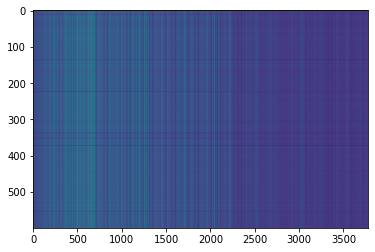

,AUC,pAUC
Source_0,0.749700,0.667368
Source_1,0.756800,0.651053
Source_2,0.829600,0.731053
Target_0,0.657800,0.686316
Target_1,0.840700,0.665263
Target_2,0.466400,0.518947
mean,0.716833,0.653333
h_mean,0.688515,0.645892


2021-05-30 03:03:00,096 - pytorch_modeler.py - INFO - epoch:201/300, train_losses:892.419322, val_AUC_hmean:0.688515, val_pAUC_hmean:0.645892, best_flag:True
2021-05-30 03:03:00,097 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.61it/s]
2021-05-30 03:03:00,533 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.60it/s]
2021-05-30 03:03:00,568 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.67it/s]
2021-05-30 03:03:00,605 - pytorch_modeler.py - INFO - epoch:202/300, train_losses:777.183675, val_AUC_hmean:0.684480, val_pAUC_hmean:0.640507, best_flag:False
2021-05-30 03:03:00,606 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.43it/s]
2021-05-30 03:03:01,045 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.58it/s]
2021-05-30 03:03:01,079 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.39it/s]
2021-05-30 

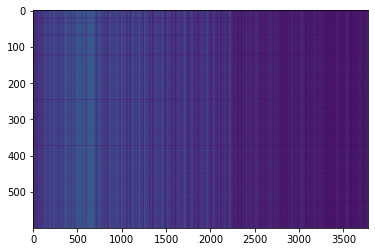

,AUC,pAUC
Source_0,0.79320,0.666316
Source_1,0.75790,0.655789
Source_2,0.82520,0.740000
Target_0,0.71380,0.673158
Target_1,0.85320,0.682105
Target_2,0.44870,0.515263
mean,0.73200,0.655439
h_mean,0.69819,0.647294


2021-05-30 03:03:05,111 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:717.597631, val_AUC_hmean:0.698190, val_pAUC_hmean:0.647294, best_flag:True
2021-05-30 03:03:05,112 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.68it/s]
2021-05-30 03:03:05,548 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.46it/s]
2021-05-30 03:03:05,582 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.00it/s]
2021-05-30 03:03:05,619 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:681.514435, val_AUC_hmean:0.693036, val_pAUC_hmean:0.637823, best_flag:False
2021-05-30 03:03:05,620 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.44it/s]
2021-05-30 03:03:06,059 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.60it/s]
2021-05-30 03:03:06,094 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.79it/s]
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 101.13it/s]
2021-05-30 03:03:13,826 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.08it/s]
2021-05-30 03:03:13,862 - pytorch_modeler.py - INFO - epoch:225/300, train_losses:453.757698, val_AUC_hmean:0.680289, val_pAUC_hmean:0.638928, best_flag:False
2021-05-30 03:03:13,863 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.64it/s]
2021-05-30 03:03:14,299 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.36it/s]
2021-05-30 03:03:14,335 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.84it/s]
2021-05-30 03:03:14,372 - pytorch_modeler.py - INFO - epoch:226/300, train_losses:475.773496, val_AUC_hmean:0.686409, val_pAUC_hmean:0.643393, best_flag:False
2021-05-30 03:03:14,373 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.67it/s]
2021-05-30 03:03:14,808 - pytorch_modeler.py - INFO - valid_source
100%|██████

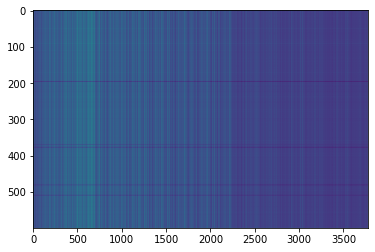

,AUC,pAUC
Source_0,0.747900,0.661053
Source_1,0.771700,0.667895
Source_2,0.803200,0.733158
Target_0,0.650400,0.670000
Target_1,0.863600,0.683158
Target_2,0.518900,0.523684
mean,0.725950,0.656491
h_mean,0.705837,0.649363


2021-05-30 03:03:21,394 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:443.061167, val_AUC_hmean:0.705837, val_pAUC_hmean:0.649363, best_flag:True
2021-05-30 03:03:21,395 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 23.97it/s]
2021-05-30 03:03:21,898 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 95.20it/s]
2021-05-30 03:03:21,940 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.59it/s]
2021-05-30 03:03:21,978 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:415.938596, val_AUC_hmean:0.666725, val_pAUC_hmean:0.639549, best_flag:False
2021-05-30 03:03:21,979 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.49it/s]
2021-05-30 03:03:22,417 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.62it/s]
2021-05-30 03:03:22,453 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.72it/s]
2021-05-30 0

100%|██████████| 2/2 [00:00<00:00, 107.18it/s]
2021-05-30 03:03:30,111 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.58it/s]
2021-05-30 03:03:30,150 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:300.748816, val_AUC_hmean:0.688791, val_pAUC_hmean:0.643233, best_flag:False
2021-05-30 03:03:30,151 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.36it/s]
2021-05-30 03:03:30,592 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.17it/s]
2021-05-30 03:03:30,627 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.05it/s]
2021-05-30 03:03:30,664 - pytorch_modeler.py - INFO - epoch:255/300, train_losses:284.165859, val_AUC_hmean:0.680338, val_pAUC_hmean:0.642927, best_flag:False
2021-05-30 03:03:30,665 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.43it/s]
2021-05-30 03:03:31,104 - pytorch_modeler.py - INFO - valid_source
100%|█████

2021-05-30 03:03:38,641 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.39it/s]
2021-05-30 03:03:39,081 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.88it/s]
2021-05-30 03:03:39,115 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.87it/s]
2021-05-30 03:03:39,152 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:250.355412, val_AUC_hmean:0.656628, val_pAUC_hmean:0.642295, best_flag:False
2021-05-30 03:03:39,153 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.61it/s]
2021-05-30 03:03:39,589 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.68it/s]
2021-05-30 03:03:39,622 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.83it/s]
2021-05-30 03:03:39,658 - pytorch_modeler.py - INFO - epoch:272/300, train_losses:255.395522, val_AUC_hmean:0.688620, val_pAUC_hmean:0.637008, best_flag:False
2021-05-30

100%|██████████| 2/2 [00:00<00:00, 106.08it/s]
2021-05-30 03:03:47,410 - pytorch_modeler.py - INFO - epoch:287/300, train_losses:211.676760, val_AUC_hmean:0.685030, val_pAUC_hmean:0.642234, best_flag:False
2021-05-30 03:03:47,411 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.52it/s]
2021-05-30 03:03:47,848 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.50it/s]
2021-05-30 03:03:47,882 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.48it/s]
2021-05-30 03:03:47,920 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:210.778429, val_AUC_hmean:0.693554, val_pAUC_hmean:0.640385, best_flag:False
2021-05-30 03:03:47,920 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.51it/s]
2021-05-30 03:03:48,358 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.31it/s]
2021-05-30 03:03:48,393 - pytorch_modeler.py - INFO - valid_target
100%|█████

,AUC,pAUC
Source_0,0.747900,0.661053
Source_1,0.771700,0.667895
Source_2,0.803200,0.733158
Target_0,0.650400,0.670000
Target_1,0.863600,0.683158
Target_2,0.518900,0.523684
mean,0.725950,0.656491
h_mean,0.705837,0.649363


elapsed time: 229.004713535 [sec]


In [15]:
for machine_type in machine_types:
    run(machine_type)

2021-05-30 03:03:54,123 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyCar
2021-05-30 03:03:54,123 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 03:03:54,125 - 00_train.py - INFO - TRAINING
2021-05-30 03:03:54,483 - pytorch_modeler.py - INFO - train
 25%|██▌       | 3/12 [00:00<00:00, 27.82it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 27.62it/s]
2021-05-30 03:03:54,920 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 92.10it/s]
2021-05-30 03:03:54,958 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.85it/s]


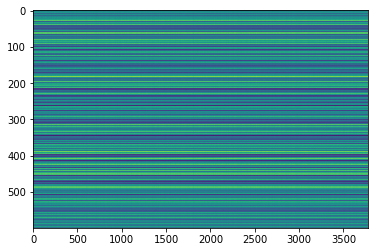

,AUC,pAUC
Source_0,0.552400,0.541053
Source_1,0.590800,0.532105
Source_2,0.614900,0.531053
Target_0,0.524600,0.584737
Target_1,0.672200,0.567368
Target_2,0.612200,0.495263
mean,0.594517,0.541930
h_mean,0.590755,0.540421


2021-05-30 03:03:56,361 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:135883.541667, val_AUC_hmean:0.590755, val_pAUC_hmean:0.540421, best_flag:True
2021-05-30 03:03:56,362 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.64it/s]
2021-05-30 03:03:56,798 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.89it/s]
2021-05-30 03:03:56,832 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.69it/s]


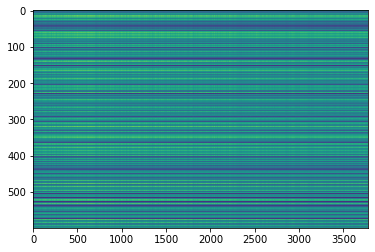

,AUC,pAUC
Source_0,0.568600,0.554737
Source_1,0.629000,0.580000
Source_2,0.638700,0.527895
Target_0,0.565700,0.610000
Target_1,0.672600,0.573684
Target_2,0.593000,0.496316
mean,0.611267,0.557105
h_mean,0.608825,0.554610


2021-05-30 03:03:58,251 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:86476.177083, val_AUC_hmean:0.608825, val_pAUC_hmean:0.554610, best_flag:True
2021-05-30 03:03:58,251 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.79it/s]
2021-05-30 03:03:58,685 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.82it/s]
2021-05-30 03:03:58,719 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.94it/s]
2021-05-30 03:03:58,755 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:76709.305339, val_AUC_hmean:0.628946, val_pAUC_hmean:0.546622, best_flag:False
2021-05-30 03:03:58,756 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.73it/s]
2021-05-30 03:03:59,190 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.78it/s]
2021-05-30 03:03:59,223 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.13it/s]
2021-05-30 

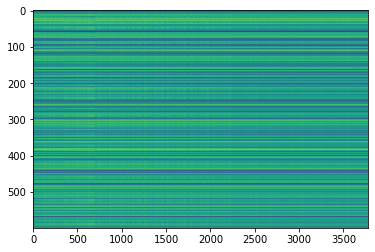

,AUC,pAUC
Source_0,0.623500,0.570000
Source_1,0.695500,0.565263
Source_2,0.762500,0.604737
Target_0,0.621400,0.623158
Target_1,0.633800,0.497895
Target_2,0.626600,0.527895
mean,0.660550,0.564825
h_mean,0.656735,0.561556


2021-05-30 03:04:01,142 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:66231.738932, val_AUC_hmean:0.656735, val_pAUC_hmean:0.561556, best_flag:True
2021-05-30 03:04:01,143 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.62it/s]
2021-05-30 03:04:01,579 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.99it/s]
2021-05-30 03:04:01,615 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.34it/s]
2021-05-30 03:04:01,653 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:63061.582031, val_AUC_hmean:0.656097, val_pAUC_hmean:0.561056, best_flag:False
2021-05-30 03:04:01,654 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.37it/s]
2021-05-30 03:04:02,094 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.11it/s]
2021-05-30 03:04:02,128 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.54it/s]
2021-05-30 0

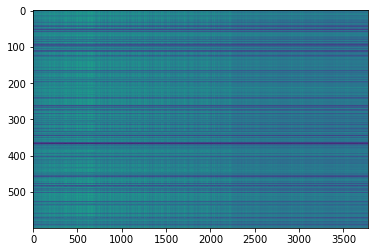

,AUC,pAUC
Source_0,0.741400,0.578421
Source_1,0.684700,0.551579
Source_2,0.782800,0.614737
Target_0,0.660200,0.628421
Target_1,0.618100,0.491579
Target_2,0.568900,0.535263
mean,0.676017,0.566667
h_mean,0.668368,0.562729


2021-05-30 03:04:04,572 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:55077.467448, val_AUC_hmean:0.668368, val_pAUC_hmean:0.562729, best_flag:True
2021-05-30 03:04:04,573 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.79it/s]
2021-05-30 03:04:05,007 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.24it/s]
2021-05-30 03:04:05,042 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.82it/s]


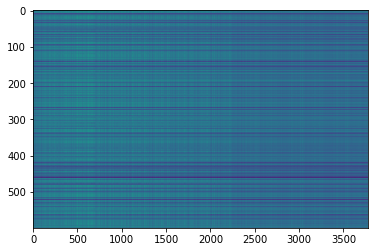

,AUC,pAUC
Source_0,0.750400,0.612105
Source_1,0.718900,0.579474
Source_2,0.827100,0.704737
Target_0,0.722900,0.665789
Target_1,0.657850,0.493158
Target_2,0.580050,0.523158
mean,0.709533,0.596404
h_mean,0.700927,0.587109


2021-05-30 03:04:06,521 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:52551.629557, val_AUC_hmean:0.700927, val_pAUC_hmean:0.587109, best_flag:True
2021-05-30 03:04:06,521 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.41it/s]
2021-05-30 03:04:06,961 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 20.38it/s]
2021-05-30 03:04:07,077 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 100.82it/s]
2021-05-30 03:04:07,119 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:51119.919271, val_AUC_hmean:0.661890, val_pAUC_hmean:0.577697, best_flag:False
2021-05-30 03:04:07,120 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.63it/s]
2021-05-30 03:04:07,556 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.56it/s]
2021-05-30 03:04:07,590 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.76it/s]


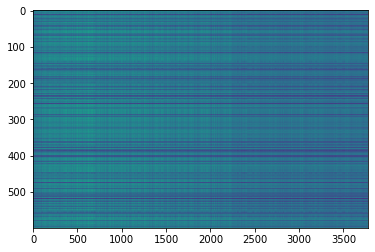

,AUC,pAUC
Source_0,0.786100,0.617368
Source_1,0.693300,0.620526
Source_2,0.806900,0.731053
Target_0,0.705300,0.644211
Target_1,0.671800,0.520000
Target_2,0.563900,0.509474
mean,0.704550,0.607105
h_mean,0.694965,0.597766


2021-05-30 03:04:09,027 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:49162.892904, val_AUC_hmean:0.694965, val_pAUC_hmean:0.597766, best_flag:True
2021-05-30 03:04:09,028 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.71it/s]
2021-05-30 03:04:09,463 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.83it/s]
2021-05-30 03:04:09,497 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 108.61it/s]
2021-05-30 03:04:09,533 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:47515.230794, val_AUC_hmean:0.688948, val_pAUC_hmean:0.596493, best_flag:False
2021-05-30 03:04:09,534 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.39it/s]
2021-05-30 03:04:09,974 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.26it/s]
2021-05-30 03:04:10,010 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.66it/s]


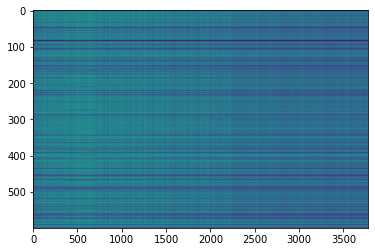

,AUC,pAUC
Source_0,0.743100,0.618421
Source_1,0.706200,0.623684
Source_2,0.784300,0.732105
Target_0,0.713900,0.644737
Target_1,0.662100,0.521579
Target_2,0.485800,0.504737
mean,0.682567,0.607544
h_mean,0.666198,0.597858


2021-05-30 03:04:11,489 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:45647.716471, val_AUC_hmean:0.666198, val_pAUC_hmean:0.597858, best_flag:True
2021-05-30 03:04:11,490 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.64it/s]
2021-05-30 03:04:11,926 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.20it/s]
2021-05-30 03:04:11,962 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.07it/s]
2021-05-30 03:04:12,000 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:44512.556315, val_AUC_hmean:0.667231, val_pAUC_hmean:0.596553, best_flag:False
2021-05-30 03:04:12,001 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.71it/s]
2021-05-30 03:04:12,437 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.62it/s]
2021-05-30 03:04:12,471 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.09it/s]
2021-05-3

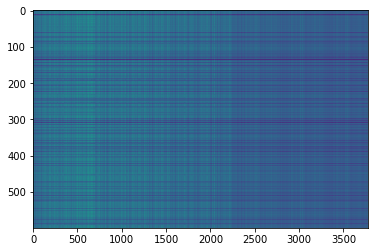

,AUC,pAUC
Source_0,0.806800,0.636316
Source_1,0.699900,0.634211
Source_2,0.818300,0.726842
Target_0,0.734650,0.670000
Target_1,0.711400,0.531579
Target_2,0.524500,0.514211
mean,0.715925,0.618860
h_mean,0.700629,0.609596


2021-05-30 03:04:16,042 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:38549.283203, val_AUC_hmean:0.700629, val_pAUC_hmean:0.609596, best_flag:True
2021-05-30 03:04:16,043 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.56it/s]
2021-05-30 03:04:16,480 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 98.52it/s]
2021-05-30 03:04:16,516 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.26it/s]


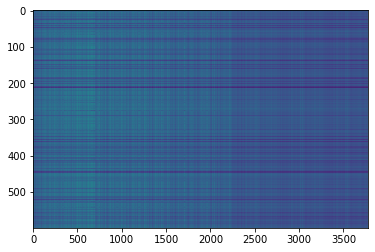

,AUC,pAUC
Source_0,0.745800,0.615263
Source_1,0.728300,0.649474
Source_2,0.802400,0.735789
Target_0,0.667700,0.640000
Target_1,0.745900,0.582105
Target_2,0.567500,0.515263
mean,0.709600,0.622982
h_mean,0.700884,0.615683


2021-05-30 03:04:18,250 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:37497.546224, val_AUC_hmean:0.700884, val_pAUC_hmean:0.615683, best_flag:True
2021-05-30 03:04:18,250 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.58it/s]
2021-05-30 03:04:18,687 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.07it/s]
2021-05-30 03:04:18,721 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.88it/s]
2021-05-30 03:04:18,757 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:36435.525065, val_AUC_hmean:0.692064, val_pAUC_hmean:0.600396, best_flag:False
2021-05-30 03:04:18,759 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.57it/s]
2021-05-30 03:04:19,196 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.04it/s]
2021-05-30 03:04:19,238 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.28it/s]
2021-05-3

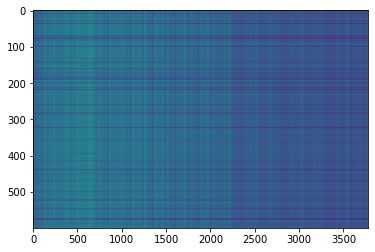

,AUC,pAUC
Source_0,0.747400,0.650526
Source_1,0.744500,0.648421
Source_2,0.857400,0.741053
Target_0,0.658200,0.665789
Target_1,0.738200,0.539474
Target_2,0.557900,0.523684
mean,0.717267,0.628158
h_mean,0.704734,0.618937


2021-05-30 03:04:27,886 - pytorch_modeler.py - INFO - epoch:37/300, train_losses:25573.160319, val_AUC_hmean:0.704734, val_pAUC_hmean:0.618937, best_flag:True
2021-05-30 03:04:27,887 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.65it/s]
2021-05-30 03:04:28,323 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.06it/s]
2021-05-30 03:04:28,357 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.59it/s]
2021-05-30 03:04:28,394 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:24941.514974, val_AUC_hmean:0.699585, val_pAUC_hmean:0.611607, best_flag:False
2021-05-30 03:04:28,395 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.74it/s]
2021-05-30 03:04:28,829 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.73it/s]
2021-05-30 03:04:28,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.00it/s]
2021-05-3

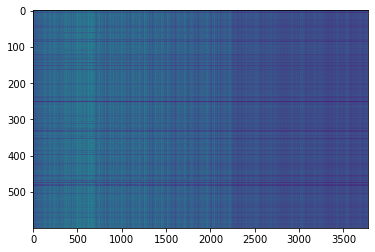

,AUC,pAUC
Source_0,0.834200,0.662632
Source_1,0.737600,0.648947
Source_2,0.872300,0.732105
Target_0,0.756800,0.686316
Target_1,0.726600,0.540526
Target_2,0.493800,0.513684
mean,0.736883,0.630702
h_mean,0.712282,0.620486


2021-05-30 03:04:30,822 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:24017.176921, val_AUC_hmean:0.712282, val_pAUC_hmean:0.620486, best_flag:True
2021-05-30 03:04:30,823 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.67it/s]
2021-05-30 03:04:31,258 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.16it/s]
2021-05-30 03:04:31,293 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.33it/s]
2021-05-30 03:04:31,331 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:23478.192546, val_AUC_hmean:0.689156, val_pAUC_hmean:0.613744, best_flag:False
2021-05-30 03:04:31,332 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.49it/s]
2021-05-30 03:04:31,770 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.53it/s]
2021-05-30 03:04:31,805 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.27it/s]


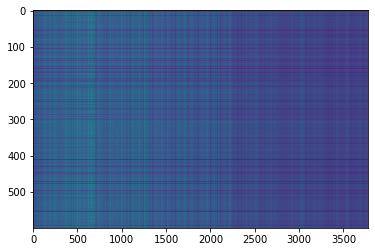

,AUC,pAUC
Source_0,0.782500,0.646842
Source_1,0.734500,0.669474
Source_2,0.835700,0.732105
Target_0,0.689400,0.657368
Target_1,0.762300,0.561053
Target_2,0.529200,0.511053
mean,0.722267,0.629649
h_mean,0.706878,0.620737


2021-05-30 03:04:33,229 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:22993.985514, val_AUC_hmean:0.706878, val_pAUC_hmean:0.620737, best_flag:True
2021-05-30 03:04:33,230 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.53it/s]
2021-05-30 03:04:33,668 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.66it/s]
2021-05-30 03:04:33,703 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.26it/s]
2021-05-30 03:04:33,741 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:22531.949056, val_AUC_hmean:0.685923, val_pAUC_hmean:0.615825, best_flag:False
2021-05-30 03:04:33,742 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.21it/s]
2021-05-30 03:04:34,185 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.90it/s]
2021-05-30 03:04:34,220 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.46it/s]
2021-05-3

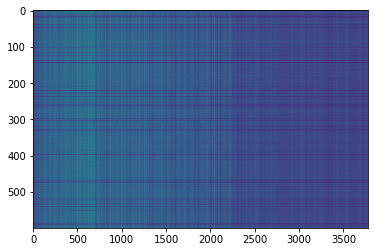

,AUC,pAUC
Source_0,0.757400,0.673158
Source_1,0.739000,0.644737
Source_2,0.839500,0.741579
Target_0,0.661300,0.674737
Target_1,0.751400,0.556316
Target_2,0.521800,0.525263
mean,0.711733,0.635965
h_mean,0.695722,0.627062


2021-05-30 03:04:39,396 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:19102.358398, val_AUC_hmean:0.695722, val_pAUC_hmean:0.627062, best_flag:True
2021-05-30 03:04:39,397 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.53it/s]
2021-05-30 03:04:39,835 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.43it/s]
2021-05-30 03:04:39,869 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.60it/s]
2021-05-30 03:04:39,906 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:18767.857422, val_AUC_hmean:0.658700, val_pAUC_hmean:0.607418, best_flag:False
2021-05-30 03:04:39,907 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.20it/s]
2021-05-30 03:04:40,350 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.93it/s]
2021-05-30 03:04:40,385 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.97it/s]
2021-05-3

100%|██████████| 12/12 [00:00<00:00, 27.57it/s]
2021-05-30 03:04:47,997 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.56it/s]
2021-05-30 03:04:48,031 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.22it/s]
2021-05-30 03:04:48,068 - pytorch_modeler.py - INFO - epoch:68/300, train_losses:13647.250407, val_AUC_hmean:0.679356, val_pAUC_hmean:0.611852, best_flag:False
2021-05-30 03:04:48,069 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 23.80it/s]
2021-05-30 03:04:48,575 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.54it/s]
2021-05-30 03:04:48,613 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.23it/s]
2021-05-30 03:04:48,657 - pytorch_modeler.py - INFO - epoch:69/300, train_losses:13436.689616, val_AUC_hmean:0.673731, val_pAUC_hmean:0.614524, best_flag:False
2021-05-30 03:04:48,658 - pytorch_modeler.py - INFO - train
100%|███

100%|██████████| 2/2 [00:00<00:00, 105.58it/s]
2021-05-30 03:04:56,306 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:10076.683757, val_AUC_hmean:0.661603, val_pAUC_hmean:0.616690, best_flag:False
2021-05-30 03:04:56,307 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.50it/s]
2021-05-30 03:04:56,744 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.54it/s]
2021-05-30 03:04:56,778 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.51it/s]
2021-05-30 03:04:56,814 - pytorch_modeler.py - INFO - epoch:85/300, train_losses:9919.548503, val_AUC_hmean:0.627887, val_pAUC_hmean:0.617828, best_flag:False
2021-05-30 03:04:56,815 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.46it/s]
2021-05-30 03:04:57,254 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.86it/s]
2021-05-30 03:04:57,288 - pytorch_modeler.py - INFO - valid_target
100%|████

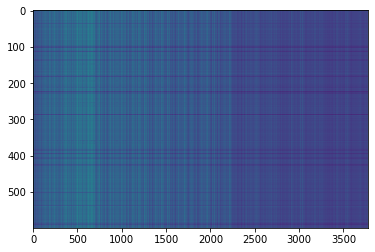

,AUC,pAUC
Source_0,0.821600,0.661053
Source_1,0.752800,0.652105
Source_2,0.815800,0.734211
Target_0,0.750100,0.681053
Target_1,0.774900,0.585263
Target_2,0.407700,0.505789
mean,0.720483,0.636579
h_mean,0.678140,0.627464


2021-05-30 03:05:00,326 - pytorch_modeler.py - INFO - epoch:89/300, train_losses:9129.082357, val_AUC_hmean:0.678140, val_pAUC_hmean:0.627464, best_flag:True
2021-05-30 03:05:00,326 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.72it/s]
2021-05-30 03:05:00,761 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.68it/s]
2021-05-30 03:05:00,796 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.29it/s]
2021-05-30 03:05:00,833 - pytorch_modeler.py - INFO - epoch:90/300, train_losses:9036.632731, val_AUC_hmean:0.684280, val_pAUC_hmean:0.611060, best_flag:False
2021-05-30 03:05:00,834 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.47it/s]
2021-05-30 03:05:01,273 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.63it/s]
2021-05-30 03:05:01,307 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.83it/s]
2021-05-30 

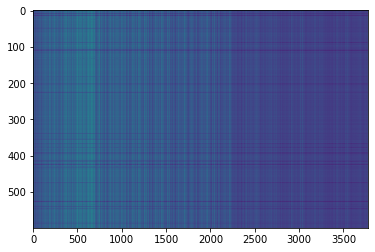

,AUC,pAUC
Source_0,0.785400,0.670526
Source_1,0.757700,0.648421
Source_2,0.825500,0.731053
Target_0,0.711300,0.673684
Target_1,0.787800,0.591579
Target_2,0.406600,0.505263
mean,0.712383,0.636754
h_mean,0.671211,0.627917


2021-05-30 03:05:08,329 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:7122.962891, val_AUC_hmean:0.671211, val_pAUC_hmean:0.627917, best_flag:True
2021-05-30 03:05:08,330 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.61it/s]
2021-05-30 03:05:08,766 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.04it/s]
2021-05-30 03:05:08,800 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.39it/s]
2021-05-30 03:05:08,836 - pytorch_modeler.py - INFO - epoch:103/300, train_losses:6987.993856, val_AUC_hmean:0.643979, val_pAUC_hmean:0.623301, best_flag:False
2021-05-30 03:05:08,838 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.62it/s]
2021-05-30 03:05:09,274 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 108.17it/s]
2021-05-30 03:05:09,308 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 92.97it/s]
2021-05-30

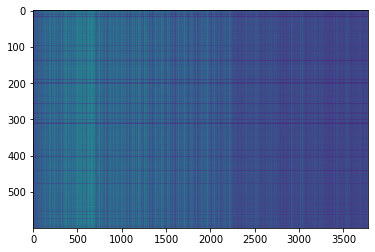

,AUC,pAUC
Source_0,0.763700,0.657895
Source_1,0.777800,0.650526
Source_2,0.793600,0.721579
Target_0,0.729500,0.677895
Target_1,0.796300,0.608421
Target_2,0.389100,0.505789
mean,0.708333,0.637018
h_mean,0.662850,0.629002


2021-05-30 03:05:17,507 - pytorch_modeler.py - INFO - epoch:117/300, train_losses:5406.015910, val_AUC_hmean:0.662850, val_pAUC_hmean:0.629002, best_flag:True
2021-05-30 03:05:17,508 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.52it/s]
2021-05-30 03:05:17,946 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.92it/s]
2021-05-30 03:05:17,980 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.40it/s]
2021-05-30 03:05:18,017 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:5280.480509, val_AUC_hmean:0.678151, val_pAUC_hmean:0.621111, best_flag:False
2021-05-30 03:05:18,018 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.66it/s]
2021-05-30 03:05:18,453 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.31it/s]
2021-05-30 03:05:18,488 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.45it/s]
2021-05-30

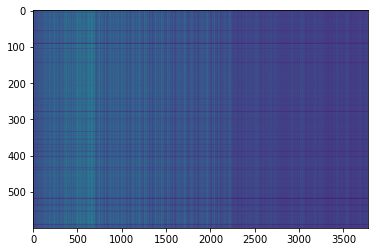

,AUC,pAUC
Source_0,0.772500,0.656316
Source_1,0.766500,0.655789
Source_2,0.828800,0.731053
Target_0,0.685300,0.681579
Target_1,0.794900,0.617895
Target_2,0.465800,0.510526
mean,0.718967,0.642193
h_mean,0.692060,0.634198


2021-05-30 03:05:22,656 - pytorch_modeler.py - INFO - epoch:124/300, train_losses:4670.676554, val_AUC_hmean:0.692060, val_pAUC_hmean:0.634198, best_flag:True
2021-05-30 03:05:22,657 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.73it/s]
2021-05-30 03:05:23,092 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.14it/s]
2021-05-30 03:05:23,128 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.43it/s]
2021-05-30 03:05:23,165 - pytorch_modeler.py - INFO - epoch:125/300, train_losses:4601.924113, val_AUC_hmean:0.663206, val_pAUC_hmean:0.623441, best_flag:False
2021-05-30 03:05:23,166 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 23.84it/s]
2021-05-30 03:05:23,671 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.68it/s]
2021-05-30 03:05:23,705 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.37it/s]
2021-05-30

100%|██████████| 12/12 [00:00<00:00, 27.56it/s]
2021-05-30 03:05:31,323 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.56it/s]
2021-05-30 03:05:31,358 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.70it/s]
2021-05-30 03:05:31,397 - pytorch_modeler.py - INFO - epoch:141/300, train_losses:3493.586589, val_AUC_hmean:0.669940, val_pAUC_hmean:0.616169, best_flag:False
2021-05-30 03:05:31,398 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.59it/s]
2021-05-30 03:05:31,835 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.32it/s]
2021-05-30 03:05:31,869 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 101.22it/s]
2021-05-30 03:05:31,906 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:3357.844889, val_AUC_hmean:0.687900, val_pAUC_hmean:0.630648, best_flag:False
2021-05-30 03:05:31,908 - pytorch_modeler.py - INFO - train
100%|████

100%|██████████| 2/2 [00:00<00:00, 103.88it/s]
2021-05-30 03:05:39,743 - pytorch_modeler.py - INFO - epoch:157/300, train_losses:2534.629822, val_AUC_hmean:0.677825, val_pAUC_hmean:0.625466, best_flag:False
2021-05-30 03:05:39,744 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.57it/s]
2021-05-30 03:05:40,181 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.55it/s]
2021-05-30 03:05:40,216 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.08it/s]
2021-05-30 03:05:40,253 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:2531.158183, val_AUC_hmean:0.651041, val_pAUC_hmean:0.625480, best_flag:False
2021-05-30 03:05:40,254 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.65it/s]
2021-05-30 03:05:40,690 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.17it/s]
2021-05-30 03:05:40,725 - pytorch_modeler.py - INFO - valid_target
100%|███

100%|██████████| 12/12 [00:00<00:00, 27.73it/s]
2021-05-30 03:05:48,401 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 107.91it/s]
2021-05-30 03:05:48,434 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.50it/s]
2021-05-30 03:05:48,470 - pytorch_modeler.py - INFO - epoch:174/300, train_losses:1978.156504, val_AUC_hmean:0.698241, val_pAUC_hmean:0.606947, best_flag:False
2021-05-30 03:05:48,471 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.74it/s]
2021-05-30 03:05:48,905 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.47it/s]
2021-05-30 03:05:48,940 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.36it/s]
2021-05-30 03:05:48,976 - pytorch_modeler.py - INFO - epoch:175/300, train_losses:1978.182200, val_AUC_hmean:0.686298, val_pAUC_hmean:0.605963, best_flag:False
2021-05-30 03:05:48,977 - pytorch_modeler.py - INFO - train
100%|███

100%|██████████| 2/2 [00:00<00:00, 103.91it/s]
2021-05-30 03:05:56,718 - pytorch_modeler.py - INFO - epoch:190/300, train_losses:1431.109843, val_AUC_hmean:0.651595, val_pAUC_hmean:0.616806, best_flag:False
2021-05-30 03:05:56,719 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.58it/s]
2021-05-30 03:05:57,156 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.62it/s]
2021-05-30 03:05:57,191 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 103.85it/s]
2021-05-30 03:05:57,228 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:1409.362264, val_AUC_hmean:0.679636, val_pAUC_hmean:0.612372, best_flag:False
2021-05-30 03:05:57,229 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.61it/s]
2021-05-30 03:05:57,666 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 102.06it/s]
2021-05-30 03:05:57,700 - pytorch_modeler.py - INFO - valid_target
100%|███

100%|██████████| 12/12 [00:00<00:00, 27.54it/s]
2021-05-30 03:06:05,386 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 101.86it/s]
2021-05-30 03:06:05,422 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.83it/s]
2021-05-30 03:06:05,458 - pytorch_modeler.py - INFO - epoch:207/300, train_losses:967.039210, val_AUC_hmean:0.676364, val_pAUC_hmean:0.625606, best_flag:False
2021-05-30 03:06:05,459 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.64it/s]
2021-05-30 03:06:05,895 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 99.94it/s]
2021-05-30 03:06:05,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.88it/s]
2021-05-30 03:06:05,968 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:1028.787923, val_AUC_hmean:0.656290, val_pAUC_hmean:0.626317, best_flag:False
2021-05-30 03:06:05,970 - pytorch_modeler.py - INFO - train
100%|█████

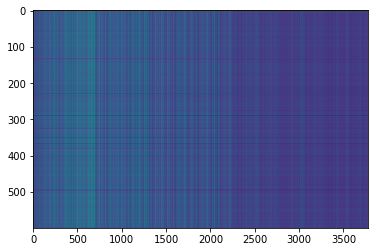

,AUC,pAUC
Source_0,0.770300,0.667368
Source_1,0.749300,0.650526
Source_2,0.812700,0.739474
Target_0,0.710400,0.685263
Target_1,0.753200,0.587895
Target_2,0.398800,0.524211
mean,0.699117,0.642456
h_mean,0.658900,0.634527


2021-05-30 03:06:07,873 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:974.370422, val_AUC_hmean:0.658900, val_pAUC_hmean:0.634527, best_flag:True
2021-05-30 03:06:07,875 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.53it/s]
2021-05-30 03:06:08,313 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 103.35it/s]
2021-05-30 03:06:08,347 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.20it/s]
2021-05-30 03:06:08,384 - pytorch_modeler.py - INFO - epoch:210/300, train_losses:986.807551, val_AUC_hmean:0.669566, val_pAUC_hmean:0.623863, best_flag:False
2021-05-30 03:06:08,385 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.57it/s]
2021-05-30 03:06:08,822 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.97it/s]
2021-05-30 03:06:08,856 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.01it/s]
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 98.44it/s]
2021-05-30 03:06:16,545 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.50it/s]
2021-05-30 03:06:16,582 - pytorch_modeler.py - INFO - epoch:226/300, train_losses:759.196345, val_AUC_hmean:0.655240, val_pAUC_hmean:0.625174, best_flag:False
2021-05-30 03:06:16,583 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.49it/s]
2021-05-30 03:06:17,021 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 95.51it/s]
2021-05-30 03:06:17,056 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.21it/s]
2021-05-30 03:06:17,092 - pytorch_modeler.py - INFO - epoch:227/300, train_losses:694.284719, val_AUC_hmean:0.668121, val_pAUC_hmean:0.625999, best_flag:False
2021-05-30 03:06:17,093 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.61it/s]
2021-05-30 03:06:17,529 - pytorch_modeler.py - INFO - valid_source
100%|███████

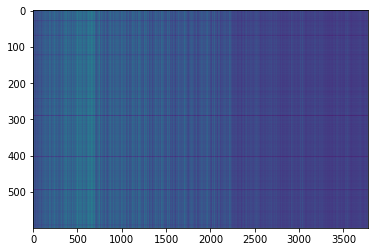

,AUC,pAUC
Source_0,0.798700,0.658421
Source_1,0.760700,0.671579
Source_2,0.811900,0.734737
Target_0,0.683300,0.681053
Target_1,0.776100,0.617368
Target_2,0.456100,0.515789
mean,0.714467,0.646491
h_mean,0.686281,0.638589


2021-05-30 03:06:19,497 - pytorch_modeler.py - INFO - epoch:229/300, train_losses:731.757151, val_AUC_hmean:0.686281, val_pAUC_hmean:0.638589, best_flag:True
2021-05-30 03:06:19,498 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.48it/s]
2021-05-30 03:06:19,936 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.40it/s]
2021-05-30 03:06:19,971 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 107.68it/s]
2021-05-30 03:06:20,007 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:684.723668, val_AUC_hmean:0.682677, val_pAUC_hmean:0.620931, best_flag:False
2021-05-30 03:06:20,009 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.44it/s]
2021-05-30 03:06:20,448 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 100.21it/s]
2021-05-30 03:06:20,483 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.44it/s]
2021-05-30 

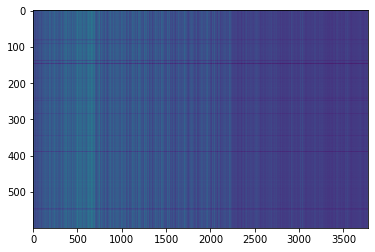

,AUC,pAUC
Source_0,0.831000,0.677895
Source_1,0.746300,0.656316
Source_2,0.836900,0.744737
Target_0,0.738100,0.682632
Target_1,0.781700,0.625789
Target_2,0.439300,0.519474
mean,0.728883,0.651140
h_mean,0.693751,0.643122


2021-05-30 03:06:27,011 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:607.394274, val_AUC_hmean:0.693751, val_pAUC_hmean:0.643122, best_flag:True
2021-05-30 03:06:27,012 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.45it/s]
2021-05-30 03:06:27,451 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 105.31it/s]
2021-05-30 03:06:27,485 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 109.37it/s]
2021-05-30 03:06:27,521 - pytorch_modeler.py - INFO - epoch:242/300, train_losses:560.072072, val_AUC_hmean:0.670645, val_pAUC_hmean:0.626749, best_flag:False
2021-05-30 03:06:27,522 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.32it/s]
2021-05-30 03:06:27,963 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.67it/s]
2021-05-30 03:06:28,004 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 104.82it/s]
2021-05-30 0

100%|██████████| 2/2 [00:00<00:00, 100.75it/s]
2021-05-30 03:06:35,737 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 99.59it/s]
2021-05-30 03:06:35,775 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:402.416674, val_AUC_hmean:0.689780, val_pAUC_hmean:0.634687, best_flag:False
2021-05-30 03:06:35,776 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.67it/s]
2021-05-30 03:06:36,211 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.18it/s]
2021-05-30 03:06:36,246 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 102.53it/s]
2021-05-30 03:06:36,283 - pytorch_modeler.py - INFO - epoch:259/300, train_losses:399.172452, val_AUC_hmean:0.672568, val_pAUC_hmean:0.619932, best_flag:False
2021-05-30 03:06:36,285 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.78it/s]
2021-05-30 03:06:36,718 - pytorch_modeler.py - INFO - valid_source
100%|██████

2021-05-30 03:06:44,011 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 26.99it/s]
2021-05-30 03:06:44,457 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.42it/s]
2021-05-30 03:06:44,492 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 105.19it/s]
2021-05-30 03:06:44,529 - pytorch_modeler.py - INFO - epoch:275/300, train_losses:505.712766, val_AUC_hmean:0.705405, val_pAUC_hmean:0.624963, best_flag:False
2021-05-30 03:06:44,530 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.33it/s]
2021-05-30 03:06:44,970 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 104.67it/s]
2021-05-30 03:06:45,004 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 96.50it/s]
2021-05-30 03:06:45,042 - pytorch_modeler.py - INFO - epoch:276/300, train_losses:424.624636, val_AUC_hmean:0.668002, val_pAUC_hmean:0.613646, best_flag:False
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 106.21it/s]
2021-05-30 03:06:52,742 - pytorch_modeler.py - INFO - epoch:291/300, train_losses:314.058304, val_AUC_hmean:0.675618, val_pAUC_hmean:0.622760, best_flag:False
2021-05-30 03:06:52,743 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.57it/s]
2021-05-30 03:06:53,180 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.06it/s]
2021-05-30 03:06:53,214 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 106.96it/s]
2021-05-30 03:06:53,250 - pytorch_modeler.py - INFO - epoch:292/300, train_losses:310.660625, val_AUC_hmean:0.676337, val_pAUC_hmean:0.625841, best_flag:False
2021-05-30 03:06:53,251 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 27.76it/s]
2021-05-30 03:06:53,685 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 106.37it/s]
2021-05-30 03:06:53,719 - pytorch_modeler.py - INFO - valid_target
100%|█████

,AUC,pAUC
Source_0,0.831000,0.677895
Source_1,0.746300,0.656316
Source_2,0.836900,0.744737
Target_0,0.738100,0.682632
Target_1,0.781700,0.625789
Target_2,0.439300,0.519474
mean,0.728883,0.651140
h_mean,0.693751,0.643122


elapsed time: 183.198500156 [sec]


In [16]:
run(machine_types[0])